In [1]:
!pip install pycountry_convert
!pip install scikit_optimize
!pip install catboost
!pip install pandas-profiling
!pip install pydot
!pip install pyqt5

In [2]:
import pandas as pd
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
import numpy as np
from pandas_profiling import ProfileReport
import seaborn
import pycountry_convert as pc
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.feature_selection import SelectKBest, mutual_info_regression, f_regression
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import cross_validate, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.neural_network import MLPRegressor
from statsmodels.regression.linear_model import OLS
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import export_graphviz
import pydot
from statsmodels.api import add_constant
import itertools
from IPython.display import Image
from skopt import BayesSearchCV
from catboost import CatBoostRegressor
from tempfile import mkdtemp
from joblib import Memory
cachedir = mkdtemp()
memory = Memory(cachedir=cachedir, verbose=5)
%matplotlib inline
#import lightgbm as lgb

/var/folders/_3/nbqjnf7n6g96vdq2stjx78sr0000gn/T/ipykernel_1438/2720936066.py:26: DeprecationWarning: The 'cachedir' parameter has been deprecated in version 0.12 and will be removed in version 0.14.
You provided "cachedir='/var/folders/_3/nbqjnf7n6g96vdq2stjx78sr0000gn/T/tmprad8uzh6'", use "location='/var/folders/_3/nbqjnf7n6g96vdq2stjx78sr0000gn/T/tmprad8uzh6'" instead.
  memory = Memory(cachedir=cachedir, verbose=5)


In [3]:
import sys
runningOnColab = 'google.colab' in sys.modules
if runningOnColab:
  from google.colab import drive
  drive.mount('/content/drive')
  %cd '/content/drive/Shareddrives/ECE219/Project4/Dataset'

# Read Datasets

In [4]:
diamonds_data = pd.read_csv('D1_Diamonds/diamonds.csv', index_col=0)
print(diamonds_data.head())
print(diamonds_data.describe())
diamonds_data.describe(include=object)

   carat      cut color clarity  depth  table  price     x     y     z
1   0.23    Ideal     E     SI2   61.5   55.0    330  3.95  3.98  2.43
2   0.21  Premium     E     SI1   59.8   61.0    327  3.89  3.84  2.31
3   0.23     Good     E     VS1   56.9   65.0    328  4.05  4.07  2.31
4   0.29  Premium     I     VS2   62.4   58.0    337  4.20  4.23  2.63
5   0.31     Good     J     SI2   63.3   58.0    338  4.34  4.35  2.75
              carat         depth         table         price             x  \
count  53940.000000  53940.000000  53940.000000  53940.000000  53940.000000   
mean       0.797940     61.749405     57.457184   3934.801557      5.731157   
std        0.474011      1.432621      2.234491   3989.442321      1.121761   
min        0.200000     43.000000     43.000000    327.000000      0.000000   
25%        0.400000     61.000000     56.000000    952.000000      4.710000   
50%        0.700000     61.800000     57.000000   2403.000000      5.700000   
75%        1.040000  

,cut,color,clarity
count,53940,53940,53940
unique,5,7,8
top,Ideal,G,SI1
freq,21551,11292,13065


In [5]:
def readEmissionCSV(year):
    fileName = 'D2_GHG/gt_' + str(year) + '.csv'
    gt_yr_data = pd.read_csv(fileName)
    gt_yr_data['year'] = year
    return gt_yr_data

In [6]:
gt_data = readEmissionCSV(2011)
gt_data = gt_data.append(readEmissionCSV(2012))
gt_data = gt_data.append(readEmissionCSV(2013))
gt_data = gt_data.append(readEmissionCSV(2014))
gt_data = gt_data.append(readEmissionCSV(2015))
print(gt_data.head())
gt_data.describe()

       AT      AP      AH    AFDP    GTEP     TIT     TAT     TEY     CDP  \
0  4.5878  1018.7  83.675  3.5758  23.979  1086.2  549.83  134.67  11.898   
1  4.2932  1018.3  84.235  3.5709  23.951  1086.1  550.05  134.67  11.892   
2  3.9045  1018.4  84.858  3.5828  23.990  1086.5  550.19  135.10  12.042   
3  3.7436  1018.3  85.434  3.5808  23.911  1086.5  550.17  135.03  11.990   
4  3.7516  1017.8  85.182  3.5781  23.917  1085.9  550.00  134.67  11.910   

        CO     NOX  year  
0  0.32663  81.952  2011  
1  0.44784  82.377  2011  
2  0.45144  83.776  2011  
3  0.23107  82.505  2011  
4  0.26747  82.028  2011  


,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX,year
count,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000
mean,17.712726,1013.070165,77.867015,3.925518,25.563801,1081.428084,546.158517,133.506404,12.060525,2.372468,65.293067,2012.985735
std,7.447451,6.463346,14.461355,0.773936,4.195957,17.536373,6.842360,15.618634,1.088795,2.262672,11.678357,1.418965
min,-6.234800,985.850000,24.085000,2.087400,17.698000,1000.800000,511.040000,100.020000,9.851800,0.000388,25.905000,2011.000000
25%,11.781000,1008.800000,68.188000,3.355600,23.129000,1071.800000,544.720000,124.450000,11.435000,1.182400,57.162000,2012.000000
50%,17.801000,1012.600000,80.470000,3.937700,25.104000,1085.900000,549.880000,133.730000,11.965000,1.713500,63.849000,2013.000000
75%,23.665000,1017.000000,89.376000,4.376900,29.061000,1097.000000,550.040000,144.080000,12.855000,2.842900,71.548000,2014.000000
max,37.103000,1036.600000,100.200000,7.610600,40.716000,1100.900000,550.610000,179.500000,15.159000,44.103000,119.910000,2015.000000


# Question 2

<AxesSubplot:>

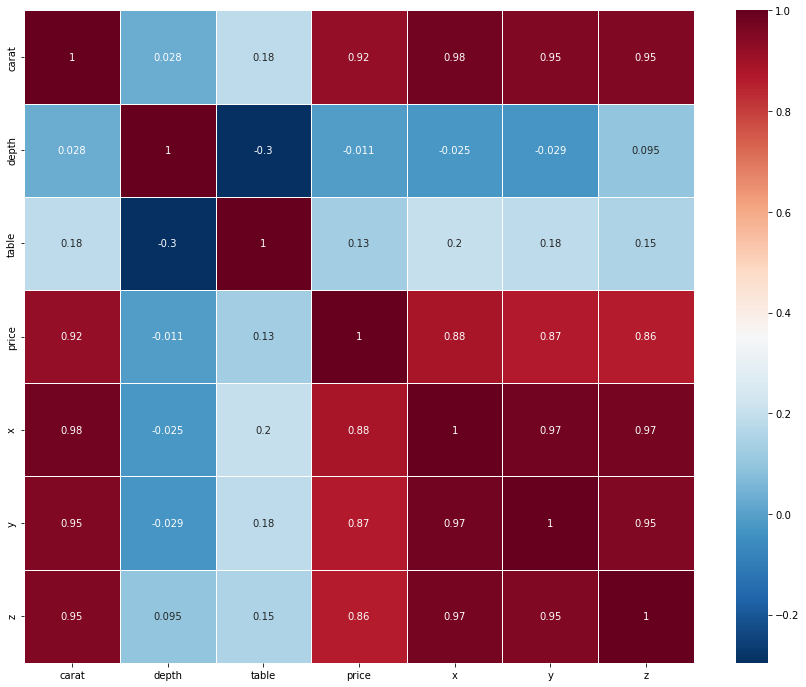

In [ ]:
corr = diamonds_data.corr()
plt.figure(figsize=(15, 12))
seaborn.heatmap(corr, linewidths=0.5,cmap="RdBu_r",annot=True)

<AxesSubplot:>

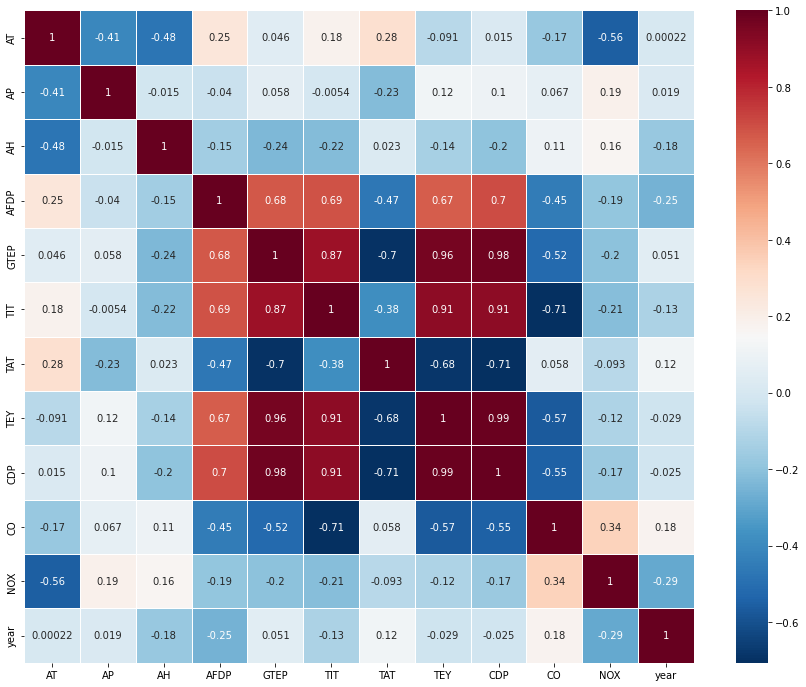

In [ ]:
corr = gt_data.corr()
plt.figure(figsize=(15, 12))
seaborn.heatmap(corr, linewidths=0.5,cmap="RdBu_r",annot=True)

# Question 3

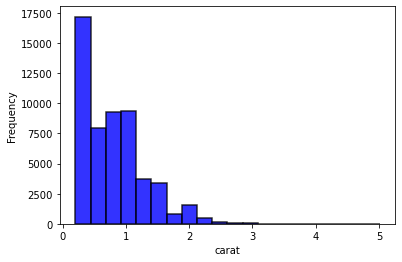

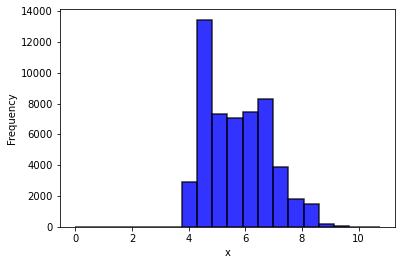

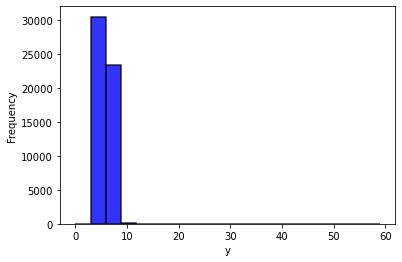

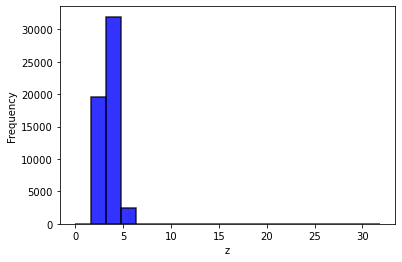

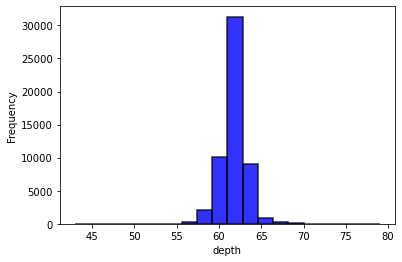

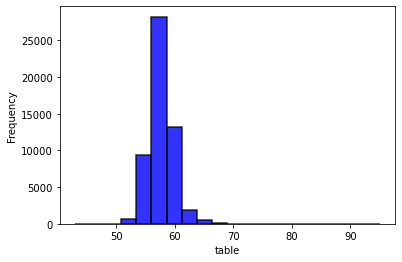

In [ ]:
%matplotlib inline
numerical_features = ['carat', 'x', 'y', 'z', 'depth', 'table'] 
for i in numerical_features:
    plt.hist(diamonds_data[i], bins=20, edgecolor='k', facecolor='b', linewidth=1.5, alpha=0.8)
    plt.xlabel(i)
    plt.ylabel('Frequency')
    plt.show()

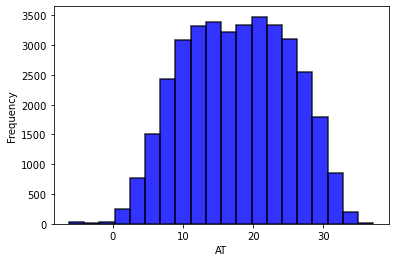

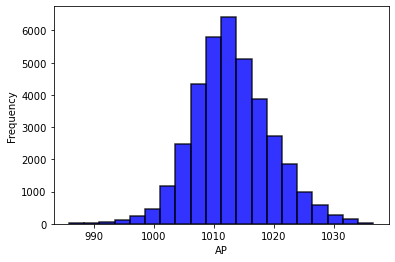

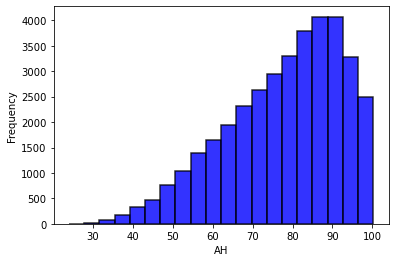

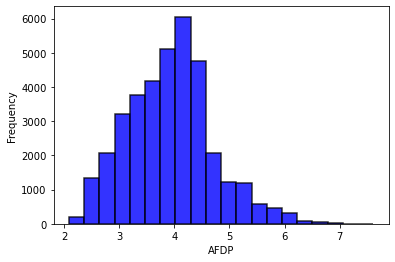

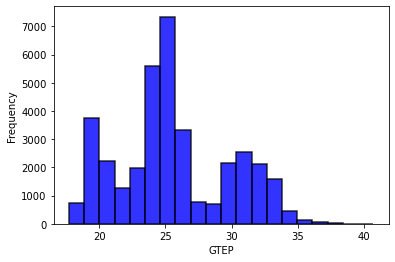

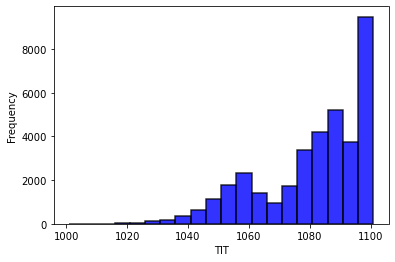

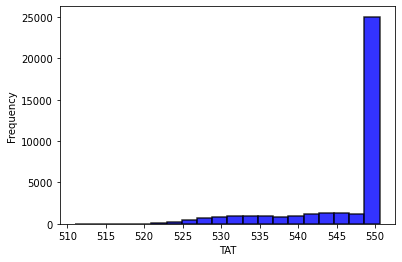

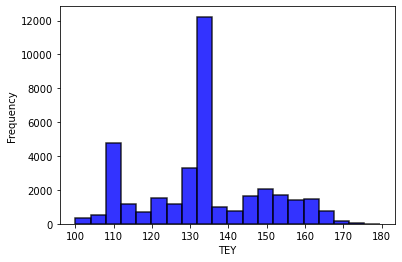

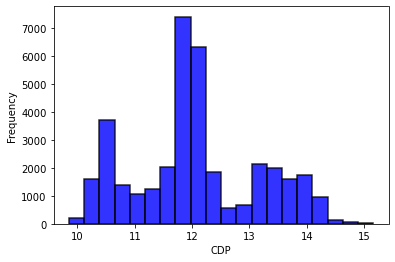

In [ ]:
numerical_features = ['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP'] 
for i in numerical_features:
    plt.hist(gt_data[i], bins=20, edgecolor='k', facecolor='b', linewidth=1.5, alpha=0.8)
    plt.xlabel(i)
    plt.ylabel('Frequency')
    plt.show()

# Question 4

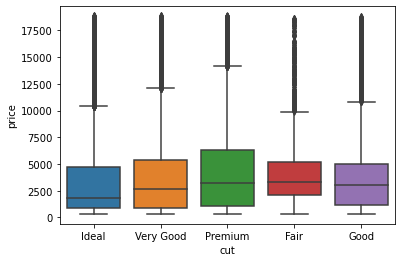

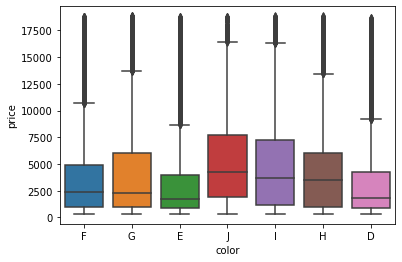

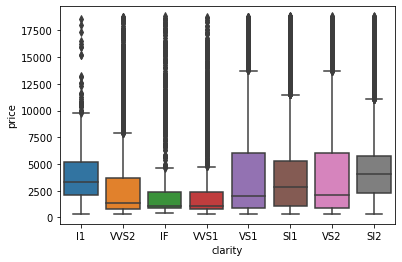

In [ ]:
cat_list = ['cut','color','clarity']
target = 'price'
for item in cat_list:
    seaborn.boxplot(x = diamonds_data[item],y = diamonds_data[target], order=list(set(diamonds_data[item])))
    plt.show()

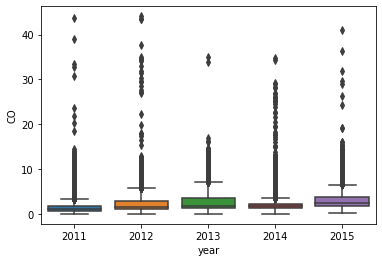

In [ ]:
cat_list = ['year']
target = 'CO'
for item in cat_list:
    seaborn.boxplot(x = gt_data[item],y = gt_data[target], order=list(set(gt_data[item])))
    plt.show()

# Question 5

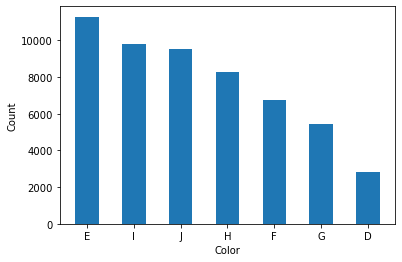

In [ ]:
x_axis = list(diamonds_data.color.unique())
y_axis = diamonds_data.color.value_counts().to_list()
plt.bar(x_axis, y_axis, width=0.5)
plt.ylabel('Count')
plt.xlabel('Color')
plt.show()

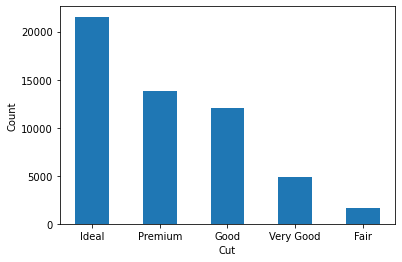

In [ ]:
x_axis = list(diamonds_data.cut.unique())
y_axis = diamonds_data.cut.value_counts().to_list()
plt.bar(x_axis, y_axis, width=0.5)
plt.ylabel('Count')
plt.xlabel('Cut')
plt.show()

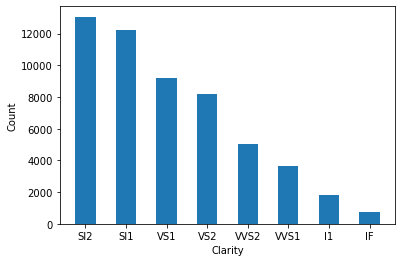

In [ ]:
x_axis = list(diamonds_data.clarity.unique())
y_axis = diamonds_data.clarity.value_counts().to_list()
plt.bar(x_axis, y_axis, width=0.5)
plt.ylabel('Count')
plt.xlabel('Clarity')
plt.show()

# Question 6

AT


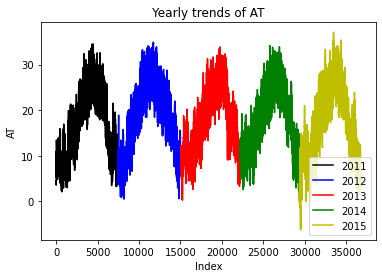

AP


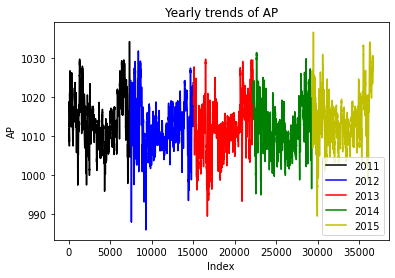

AH


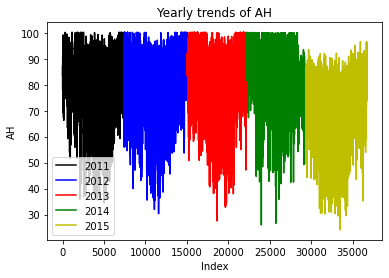

AFDP


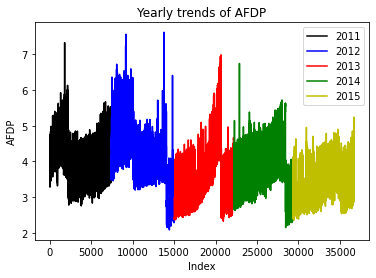

GTEP


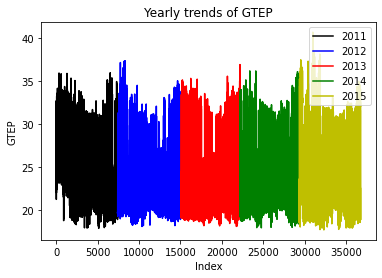

TIT


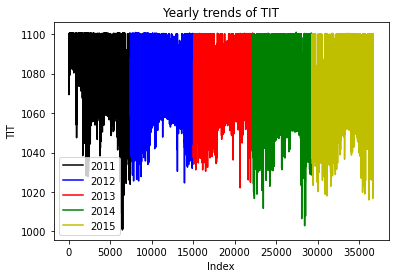

TAT


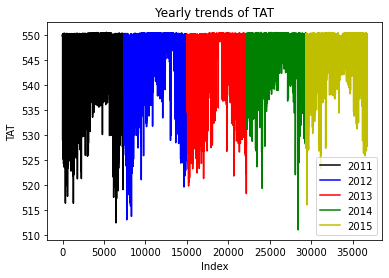

TEY


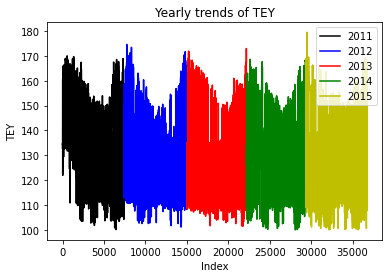

CDP


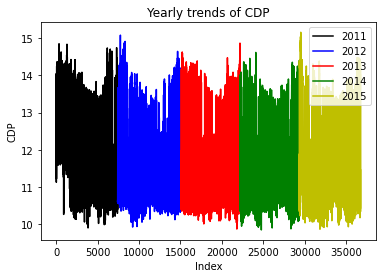

In [ ]:
years = list(gt_data['year'].unique())
start_yr = 2011
features = ['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP']
C = ['k','b','r','g','y']
gt_data.reset_index(drop=True, inplace = True)

for feat in features:
    print(feat)
    for index, yr in enumerate(years):
        df = gt_data[gt_data['year'] == yr]
        plt.plot(df.index, df[feat], color = C[index], label = str(start_yr + index))
    plt.xlabel('Index')
    plt.ylabel(feat)
    plt.title('Yearly trends of ' + feat)
    plt.legend()
    plt.show()

AT


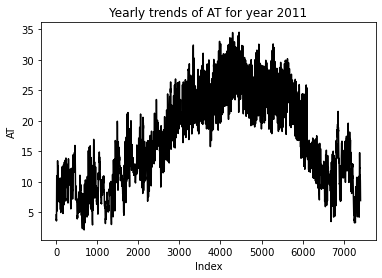

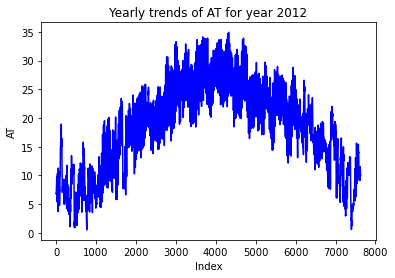

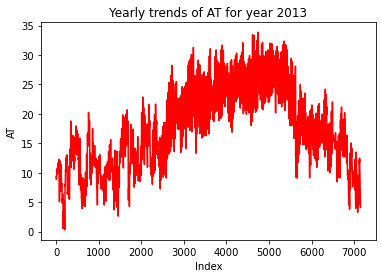

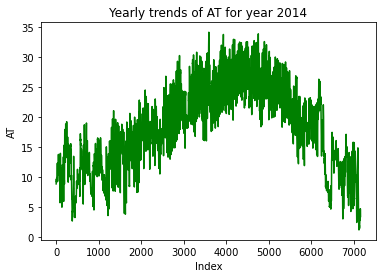

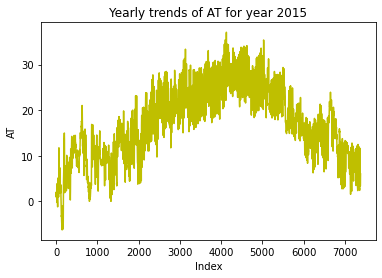

AP


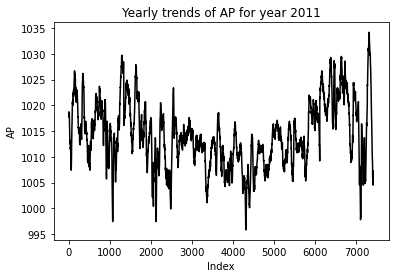

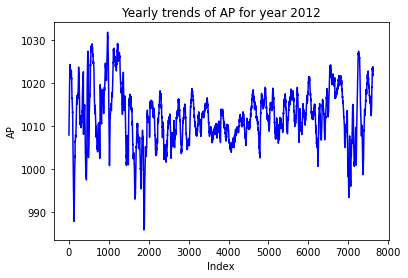

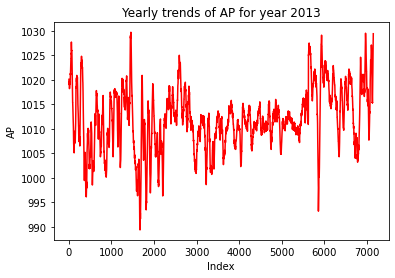

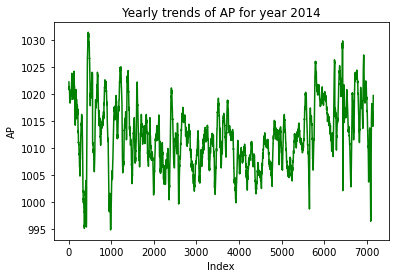

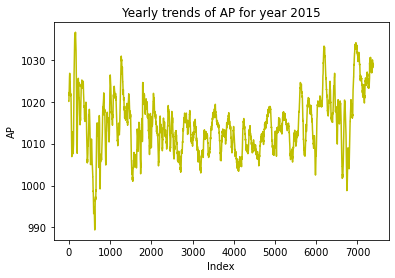

AH


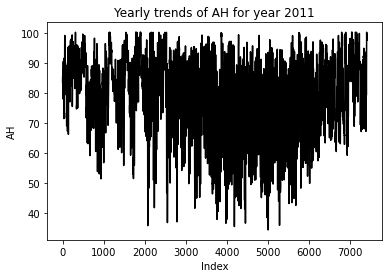

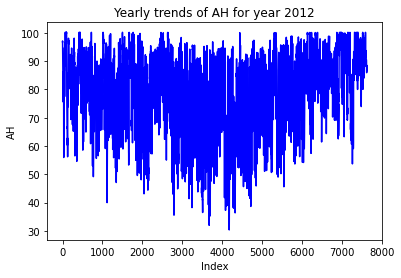

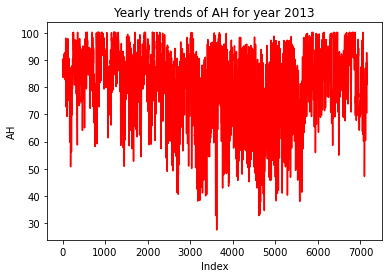

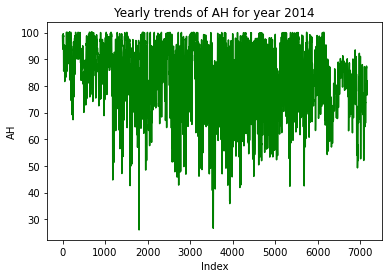

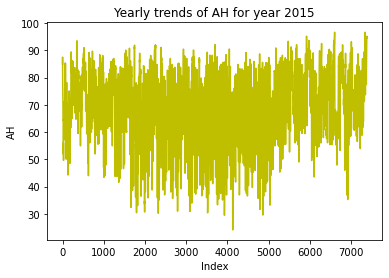

AFDP


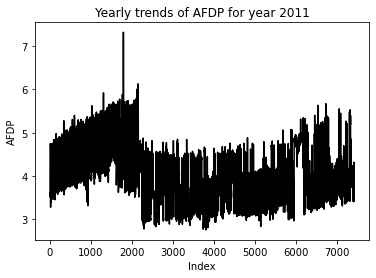

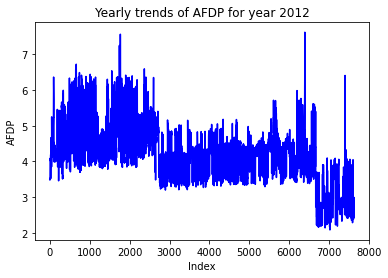

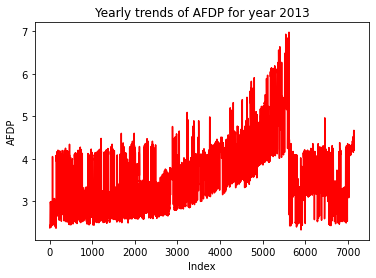

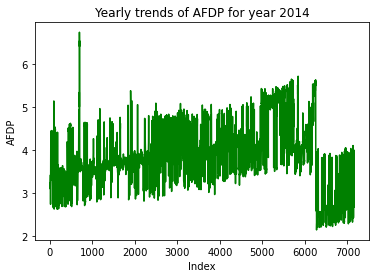

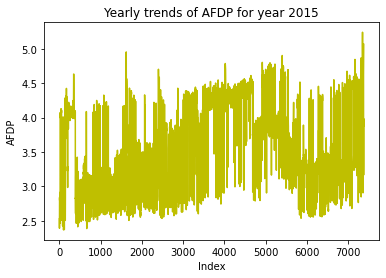

GTEP


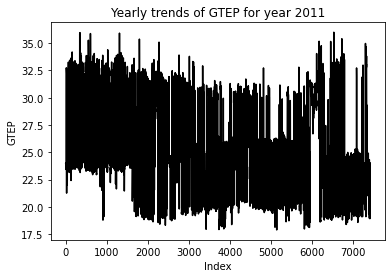

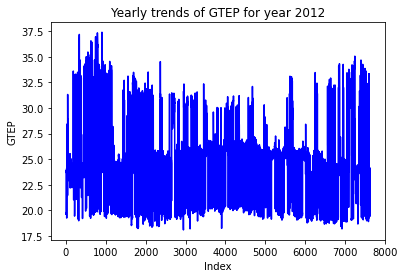

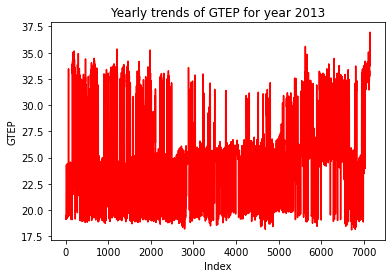

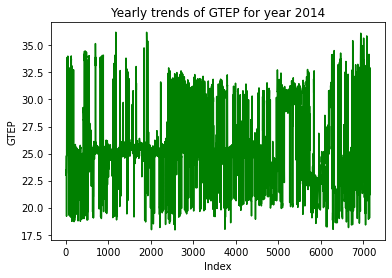

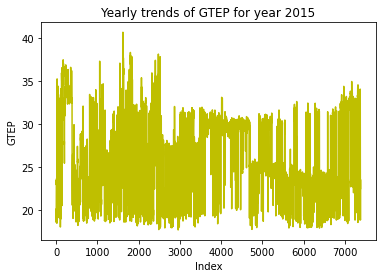

TIT


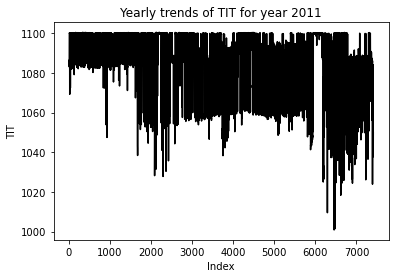

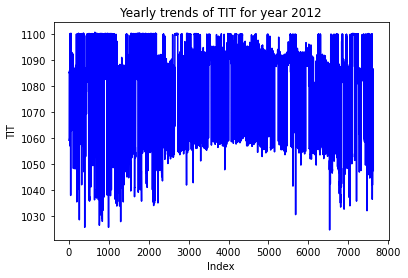

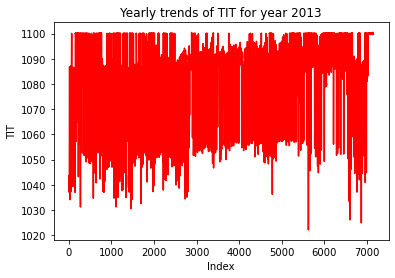

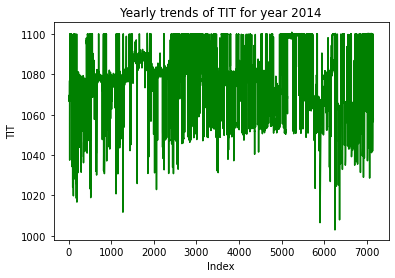

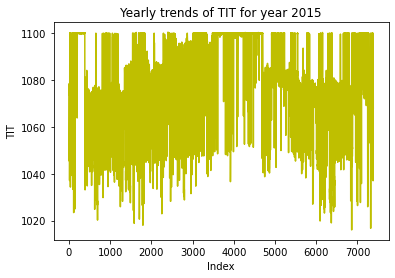

TAT


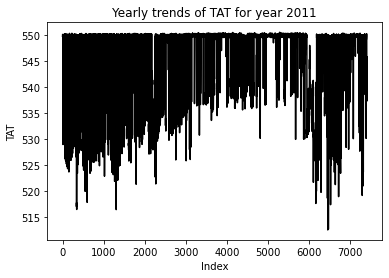

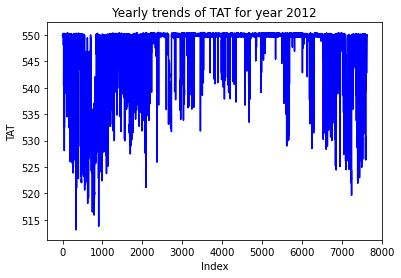

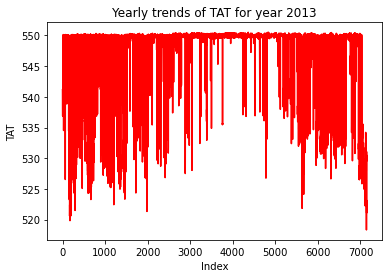

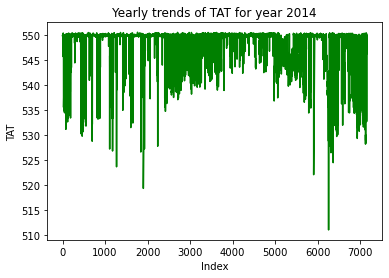

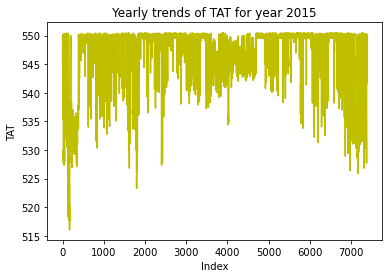

TEY


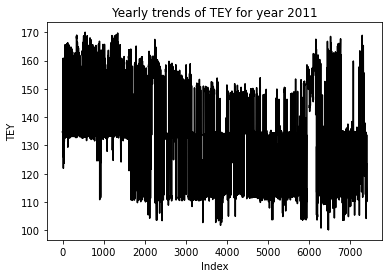

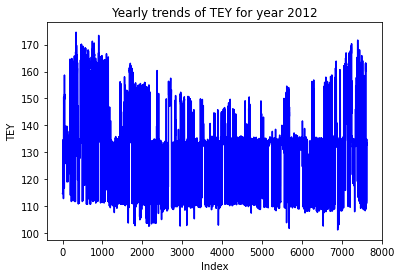

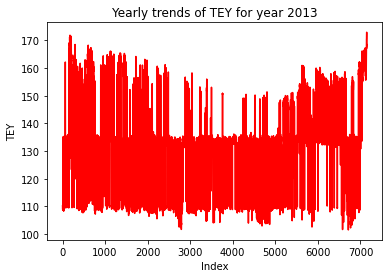

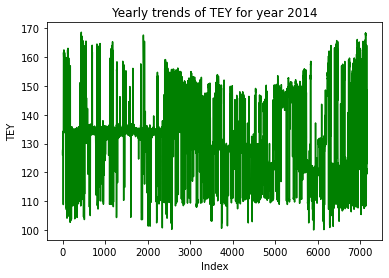

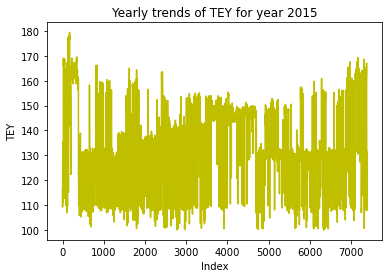

CDP


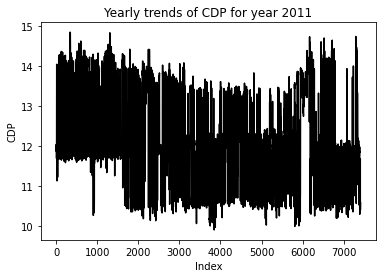

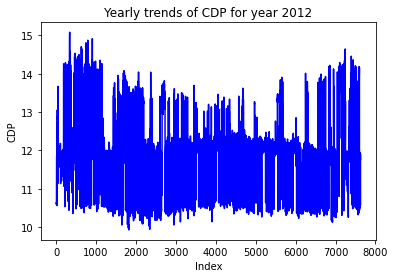

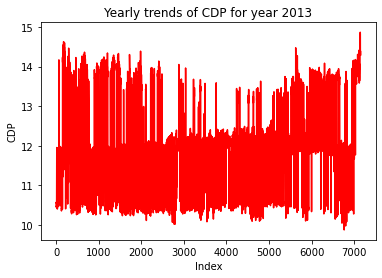

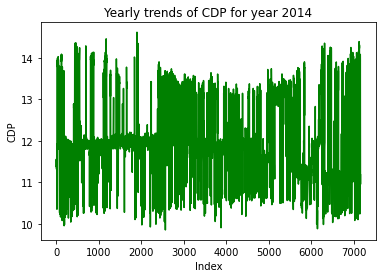

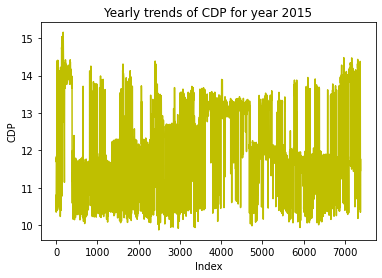

In [ ]:
years = list(gt_data['year'].unique())
start_yr = 2011
features = ['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP']
C = ['k','b','r','g','y']

for feat in features:
    print(feat)
    for index, yr in enumerate(years):
        df = gt_data[gt_data['year'] == yr]
        x_axis = np.arange(len(df.index))
        plt.plot(x_axis, df[feat], color = C[index], label = str(start_yr + index))
        plt.xlabel('Index')
        plt.ylabel(feat)
        plt.title('Yearly trends of ' + feat + ' for year ' + str(start_yr + index))
        plt.show()

# Question 1

Handle Categorical Features

In [7]:
diamonds_data_cat = diamonds_data.copy()
diamonds_data_cat['cut'].replace(['Fair', 'Good', 'Very Good', 'Premium', 'Ideal'], [1, 2, 3, 4, 5], inplace=True)
diamonds_data_cat['color'].replace(['J', 'I', 'H', 'G', 'F', 'E', 'D'], [1, 2, 3, 4, 5, 6, 7], inplace=True)
diamonds_data_cat['clarity'].replace(['I1', 'SI2', 'SI1', 'VS2', 'VS1', 'VVS2', 'VVS1', 'IF'], [1, 2, 3, 4, 5, 6, 7, 8], inplace=True)

In [8]:
print(diamonds_data_cat.head())
print(diamonds_data_cat.describe())

   carat  cut  color  clarity  depth  table  price     x     y     z
1   0.23    5      6        2   61.5   55.0    330  3.95  3.98  2.43
2   0.21    4      6        3   59.8   61.0    327  3.89  3.84  2.31
3   0.23    2      6        5   56.9   65.0    328  4.05  4.07  2.31
4   0.29    4      2        4   62.4   58.0    337  4.20  4.23  2.63
5   0.31    2      1        2   63.3   58.0    338  4.34  4.35  2.75
              carat           cut         color       clarity         depth  \
count  53940.000000  53940.000000  53940.000000  53940.000000  53940.000000   
mean       0.797940      3.904097      4.405803      4.051020     61.749405   
std        0.474011      1.116600      1.701105      1.647136      1.432621   
min        0.200000      1.000000      1.000000      1.000000     43.000000   
25%        0.400000      3.000000      3.000000      3.000000     61.000000   
50%        0.700000      4.000000      4.000000      4.000000     61.800000   
75%        1.040000      5.000000

In [9]:
gt_data_cat = gt_data.copy()
dum = pd.get_dummies(gt_data_cat['year'], columns=['year'], drop_first=False, prefix = 'year')
gt_data_cat = pd.concat([gt_data_cat, dum], axis=1)
print(gt_data_cat.head())
gt_data_cat.describe()

       AT      AP      AH    AFDP    GTEP     TIT     TAT     TEY     CDP  \
0  4.5878  1018.7  83.675  3.5758  23.979  1086.2  549.83  134.67  11.898   
1  4.2932  1018.3  84.235  3.5709  23.951  1086.1  550.05  134.67  11.892   
2  3.9045  1018.4  84.858  3.5828  23.990  1086.5  550.19  135.10  12.042   
3  3.7436  1018.3  85.434  3.5808  23.911  1086.5  550.17  135.03  11.990   
4  3.7516  1017.8  85.182  3.5781  23.917  1085.9  550.00  134.67  11.910   

        CO     NOX  year  year_2011  year_2012  year_2013  year_2014  \
0  0.32663  81.952  2011          1          0          0          0   
1  0.44784  82.377  2011          1          0          0          0   
2  0.45144  83.776  2011          1          0          0          0   
3  0.23107  82.505  2011          1          0          0          0   
4  0.26747  82.028  2011          1          0          0          0   

   year_2015  
0          0  
1          0  
2          0  
3          0  
4          0  


,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX,year,year_2011,year_2012,year_2013,year_2014,year_2015
count,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000,36733.000000
mean,17.712726,1013.070165,77.867015,3.925518,25.563801,1081.428084,546.158517,133.506404,12.060525,2.372468,65.293067,2012.985735,0.201753,0.207661,0.194702,0.194866,0.201018
std,7.447451,6.463346,14.461355,0.773936,4.195957,17.536373,6.842360,15.618634,1.088795,2.262672,11.678357,1.418965,0.401314,0.405638,0.395977,0.396103,0.400767
min,-6.234800,985.850000,24.085000,2.087400,17.698000,1000.800000,511.040000,100.020000,9.851800,0.000388,25.905000,2011.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,11.781000,1008.800000,68.188000,3.355600,23.129000,1071.800000,544.720000,124.450000,11.435000,1.182400,57.162000,2012.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,17.801000,1012.600000,80.470000,3.937700,25.104000,1085.900000,549.880000,133.730000,11.965000,1.713500,63.849000,2013.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,23.665000,1017.000000,89.376000,4.376900,29.061000,1097.000000,550.040000,144.080000,12.855000,2.842900,71.548000,2014.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,37.103000,1036.600000,100.200000,7.610600,40.716000,1100.900000,550.610000,179.500000,15.159000,44.103000,119.910000,2015.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Standardization

In [10]:
scalar = StandardScaler()
diamonds_data_S = scalar.fit_transform(diamonds_data_cat)
diamonds_data_S_df = pd.DataFrame(diamonds_data_S, columns = diamonds_data_cat.columns)
print('diamonds_data_S_df')
print(diamonds_data_S_df.describe())

scalar = StandardScaler()
gt_data_S = scalar.fit_transform(gt_data_cat)
gt_data_S_df = pd.DataFrame(gt_data_S, columns = gt_data_cat.columns)
print('gt_data_S_df')
print(gt_data_S_df.describe())

diamonds_data_S_df
              carat           cut         color       clarity         depth  \
count  5.394000e+04  5.394000e+04  5.394000e+04  5.394000e+04  5.394000e+04   
mean   2.889982e-14 -1.165888e-14 -1.709256e-14 -6.358149e-15 -3.658830e-15   
std    1.000009e+00  1.000009e+00  1.000009e+00  1.000009e+00  1.000009e+00   
min   -1.261458e+00 -2.600864e+00 -2.002131e+00 -1.852335e+00 -1.308760e+01   
25%   -8.395232e-01 -8.096951e-01 -8.264134e-01 -6.380951e-01 -5.231053e-01   
50%   -2.066210e-01  8.588908e-02 -2.385547e-01 -3.097505e-02  3.531678e-02   
75%    5.106683e-01  9.814733e-01  9.371628e-01  5.761450e-01  5.239361e-01   
max    8.886075e+00  9.814733e-01  1.525021e+00  2.397505e+00  1.204139e+01   

              table         price             x             y             z  
count  5.394000e+04  5.394000e+04  5.394000e+04  5.394000e+04  5.394000e+04  
mean   1.274832e-14  1.262602e-14  1.034809e-14 -3.139766e-15 -7.314273e-15  
std    1.000009e+00  1.000009e+00  

Extract Features and Target Variables

In [11]:
X_diamond = diamonds_data_cat[['carat', 'cut', 'color', 'clarity', 'x', 'y', 'z', 'depth', 'table']]
Y_diamond_df = diamonds_data_cat[['price']]
Y_diamond = diamonds_data_cat.price

print('X_diamond')
print(X_diamond.head())
print(X_diamond.describe())

print('Y_diamond')
print(Y_diamond_df.head())
print(Y_diamond_df.describe())

X_gt = gt_data_cat[['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'year_2011', 'year_2012', 'year_2013', 'year_2014', 'year_2015']]
Y_gt_df = gt_data_cat[['CO']]
Y_gt = gt_data_cat.CO

print('X_gt')
print(X_gt.head())
print(X_gt.describe())

print('Y_gt')
print(Y_gt_df.head())
print(Y_gt_df.describe())

X_diamond
   carat  cut  color  clarity     x     y     z  depth  table
1   0.23    5      6        2  3.95  3.98  2.43   61.5   55.0
2   0.21    4      6        3  3.89  3.84  2.31   59.8   61.0
3   0.23    2      6        5  4.05  4.07  2.31   56.9   65.0
4   0.29    4      2        4  4.20  4.23  2.63   62.4   58.0
5   0.31    2      1        2  4.34  4.35  2.75   63.3   58.0
              carat           cut         color       clarity             x  \
count  53940.000000  53940.000000  53940.000000  53940.000000  53940.000000   
mean       0.797940      3.904097      4.405803      4.051020      5.731157   
std        0.474011      1.116600      1.701105      1.647136      1.121761   
min        0.200000      1.000000      1.000000      1.000000      0.000000   
25%        0.400000      3.000000      3.000000      3.000000      4.710000   
50%        0.700000      4.000000      4.000000      4.000000      5.700000   
75%        1.040000      5.000000      6.000000      5.000000    

In [12]:
X_diamond_S = diamonds_data_S_df[['carat', 'cut', 'color', 'clarity', 'x', 'y', 'z', 'depth', 'table']]
Y_diamond_S_df = diamonds_data_S_df[['price']]
Y_diamond_S = diamonds_data_S_df.price

print('X_diamond_S')
print(X_diamond_S.head())
print(X_diamond_S.describe())

print('Y_diamond_S')
print(Y_diamond_S_df.head())
print(Y_diamond_S_df.describe())

X_gt_S = gt_data_S_df[['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'year_2011', 'year_2012', 'year_2013', 'year_2014', 'year_2015']]
Y_gt_S_df = gt_data_S_df[['CO']]
Y_gt_S = gt_data_S_df.CO

print('X_gt_S')
print(X_gt_S.head())
print(X_gt_S.describe())

print('Y_gt_S')
print(Y_gt_S_df.head())
print(Y_gt_S_df.describe())

X_diamond_S
      carat       cut     color   clarity         x         y         z  \
0 -1.198168  0.981473  0.937163 -1.245215 -1.587837 -1.536196 -1.571129   
1 -1.240361  0.085889  0.937163 -0.638095 -1.641325 -1.658774 -1.741175   
2 -1.198168 -1.705279  0.937163  0.576145 -1.498691 -1.457395 -1.741175   
3 -1.071587  0.085889 -1.414272 -0.030975 -1.364971 -1.317305 -1.287720   
4 -1.029394 -1.705279 -2.002131 -1.245215 -1.240167 -1.212238 -1.117674   

      depth     table  
0 -0.174092 -1.099672  
1 -1.360738  1.585529  
2 -3.385019  3.375663  
3  0.454133  0.242928  
4  1.082358  0.242928  
              carat           cut         color       clarity             x  \
count  5.394000e+04  5.394000e+04  5.394000e+04  5.394000e+04  5.394000e+04   
mean   2.889982e-14 -1.165888e-14 -1.709256e-14 -6.358149e-15  1.034809e-14   
std    1.000009e+00  1.000009e+00  1.000009e+00  1.000009e+00  1.000009e+00   
min   -1.261458e+00 -2.600864e+00 -2.002131e+00 -1.852335e+00 -5.109120e+00  

Use X_diamond_S / Y_diamond_S_df --- X_gt_S / Y_gt_S_df for standardized.
Else use X_diamond / Y_diamond_df --- X_gt / Y_gt_df

# Question 7

In [ ]:
diamonds_RMSE_MIR = []
diamonds_RMSE_FR = []

diamonds_RMSE_MIR_RR = []
diamonds_RMSE_FR_RR = []

diamonds_RMSE_MIR_LR = []
diamonds_RMSE_FR_LR = []


for i in range(1, X_diamond_S.shape[1] + 1):
    print('Testing Linear Regression, k = ', i)
    X_diamond_MIR = SelectKBest(score_func = mutual_info_regression, k = i).fit_transform(X_diamond_S, Y_diamond_S)
    X_diamond_FR = SelectKBest(score_func = f_regression, k = i).fit_transform(X_diamond_S, Y_diamond_S)
    
    diamond_out = cross_validate(LinearRegression(), X_diamond_MIR, Y_diamond_S, scoring = ['neg_root_mean_squared_error'], cv = 10, n_jobs = -1)
    diamonds_RMSE_MIR.append(diamond_out['test_neg_root_mean_squared_error'].mean())
    diamond_out = cross_validate(LinearRegression(), X_diamond_FR, Y_diamond_S, scoring = ['neg_root_mean_squared_error'], cv = 10, n_jobs = -1)
    diamonds_RMSE_FR.append(diamond_out['test_neg_root_mean_squared_error'].mean())
    
    print('Testing Ridge Regression, k = ', i)
    diamond_out = cross_validate(Ridge(), X_diamond_MIR, Y_diamond_S, scoring = ['neg_root_mean_squared_error'], cv = 10, n_jobs = -1)
    diamonds_RMSE_MIR_RR.append(diamond_out['test_neg_root_mean_squared_error'].mean())
    diamond_out = cross_validate(Ridge(), X_diamond_FR, Y_diamond_S, scoring = ['neg_root_mean_squared_error'], cv = 10, n_jobs = -1)
    diamonds_RMSE_FR_RR.append(diamond_out['test_neg_root_mean_squared_error'].mean())
    
    print('Testing Lasso Regression, k = ', i)
    diamond_out = cross_validate(Lasso(), X_diamond_MIR, Y_diamond_S, scoring = ['neg_root_mean_squared_error'], cv = 10, n_jobs = -1)
    diamonds_RMSE_MIR_LR.append(diamond_out['test_neg_root_mean_squared_error'].mean())
    diamond_out = cross_validate(Lasso(), X_diamond_FR, Y_diamond_S, scoring = ['neg_root_mean_squared_error'], cv = 10, n_jobs = -1)
    diamonds_RMSE_FR_LR.append(diamond_out['test_neg_root_mean_squared_error'].mean())

Testing Linear Regression, k =  1
Testing Ridge Regression, k =  1
Testing Lasso Regression, k =  1
Testing Linear Regression, k =  2
Testing Ridge Regression, k =  2
Testing Lasso Regression, k =  2
Testing Linear Regression, k =  3
Testing Ridge Regression, k =  3
Testing Lasso Regression, k =  3
Testing Linear Regression, k =  4
Testing Ridge Regression, k =  4
Testing Lasso Regression, k =  4
Testing Linear Regression, k =  5
Testing Ridge Regression, k =  5
Testing Lasso Regression, k =  5
Testing Linear Regression, k =  6
Testing Ridge Regression, k =  6
Testing Lasso Regression, k =  6
Testing Linear Regression, k =  7
Testing Ridge Regression, k =  7
Testing Lasso Regression, k =  7
Testing Linear Regression, k =  8
Testing Ridge Regression, k =  8
Testing Lasso Regression, k =  8
Testing Linear Regression, k =  9
Testing Ridge Regression, k =  9
Testing Lasso Regression, k =  9


In [ ]:
print(diamonds_RMSE_MIR)
print(diamonds_RMSE_FR)

print(diamonds_RMSE_MIR_RR)
print(diamonds_RMSE_FR_RR)

print(diamonds_RMSE_MIR_LR)
print(diamonds_RMSE_FR_LR)

[-0.36883584775859196, -0.36192181523517614, -0.3500148028397427, -0.352186984958755, -0.32613735530436877, -0.3078705218517316, -0.3041008008100073, -0.30439714783245375, -0.3020613218983586]
[-0.36883584775859196, -0.3499127425405876, -0.3500148028397427, -0.352186984958755, -0.3447984670094886, -0.3078705218517316, -0.3081178605774867, -0.30439714783245375, -0.3020613218983586]
[-0.3688348428926101, -0.3619335948034722, -0.3500503742363045, -0.3522132841983151, -0.3261522268953912, -0.307885271052781, -0.3041180823341643, -0.30441376015833604, -0.30208287542226203]
[-0.3688348428926101, -0.34994927041338286, -0.3500503742363045, -0.3522132841983151, -0.3448225285004888, -0.307885271052781, -0.30813001904803683, -0.30441376015833604, -0.30208287542226203]
[-0.8875102639279989, -0.8875102639279989, -0.8875102639279989, -0.8875102639279989, -0.8875102639279989, -0.8875102639279989, -0.8875102639279989, -0.8875102639279989, -0.8875102639279989]
[-0.8875102639279989, -0.8875102639279989,

9 features with either MIR OR FR gives best.

In [ ]:
gt_RMSE_MIR = []
gt_RMSE_FR = []

gt_RMSE_MIR_RR = []
gt_RMSE_FR_RR = []

gt_RMSE_MIR_LR = []
gt_RMSE_FR_LR = []


for i in range(1, X_gt_S.shape[1] + 1):
    print('Testing Linear Regression, k = ', i)
    X_gt_MIR = SelectKBest(score_func = mutual_info_regression, k = i).fit_transform(X_gt_S, Y_gt_S)
    X_gt_FR = SelectKBest(score_func = f_regression, k = i).fit_transform(X_gt_S, Y_gt_S)
    
    gt_out = cross_validate(LinearRegression(), X_gt_MIR, Y_gt_S, scoring = ['neg_root_mean_squared_error'], cv = 10, n_jobs = -1)
    gt_RMSE_MIR.append(gt_out['test_neg_root_mean_squared_error'].mean())
    gt_out = cross_validate(LinearRegression(), X_gt_FR, Y_gt_S, scoring = ['neg_root_mean_squared_error'], cv = 10, n_jobs = -1)
    gt_RMSE_FR.append(gt_out['test_neg_root_mean_squared_error'].mean())
    
    print('Testing Ridge Regression, k = ', i)
    gt_out = cross_validate(Ridge(), X_gt_MIR, Y_gt_S, scoring = ['neg_root_mean_squared_error'], cv = 10, n_jobs = -1)
    gt_RMSE_MIR_RR.append(gt_out['test_neg_root_mean_squared_error'].mean())
    gt_out = cross_validate(Ridge(), X_gt_FR, Y_gt_S, scoring = ['neg_root_mean_squared_error'], cv = 10, n_jobs = -1)
    gt_RMSE_FR_RR.append(gt_out['test_neg_root_mean_squared_error'].mean())
    
    print('Testing Lasso Regression, k = ', i)
    gt_out = cross_validate(Lasso(), X_gt_MIR, Y_gt_S, scoring = ['neg_root_mean_squared_error'], cv = 10, n_jobs = -1)
    gt_RMSE_MIR_LR.append(gt_out['test_neg_root_mean_squared_error'].mean())
    gt_out = cross_validate(Lasso(), X_gt_FR, Y_gt_S, scoring = ['neg_root_mean_squared_error'], cv = 10, n_jobs = -1)
    gt_RMSE_FR_LR.append(gt_out['test_neg_root_mean_squared_error'].mean())

Testing Linear Regression, k =  1
Testing Ridge Regression, k =  1
Testing Lasso Regression, k =  1
Testing Linear Regression, k =  2
Testing Ridge Regression, k =  2
Testing Lasso Regression, k =  2
Testing Linear Regression, k =  3
Testing Ridge Regression, k =  3
Testing Lasso Regression, k =  3
Testing Linear Regression, k =  4
Testing Ridge Regression, k =  4
Testing Lasso Regression, k =  4
Testing Linear Regression, k =  5
Testing Ridge Regression, k =  5
Testing Lasso Regression, k =  5
Testing Linear Regression, k =  6
Testing Ridge Regression, k =  6
Testing Lasso Regression, k =  6
Testing Linear Regression, k =  7
Testing Ridge Regression, k =  7
Testing Lasso Regression, k =  7
Testing Linear Regression, k =  8
Testing Ridge Regression, k =  8
Testing Lasso Regression, k =  8
Testing Linear Regression, k =  9
Testing Ridge Regression, k =  9
Testing Lasso Regression, k =  9
Testing Linear Regression, k =  10
Testing Ridge Regression, k =  10
Testing Lasso Regression, k =  

In [ ]:
print(gt_RMSE_MIR)
print(gt_RMSE_FR)

print(gt_RMSE_MIR_RR)
print(gt_RMSE_FR_RR)

print(gt_RMSE_MIR_LR)
print(gt_RMSE_FR_LR)

[-0.7117485731180647, -0.6966621326685986, -0.682252993757481, -0.6945211163108104, -0.696637689557345, -0.7007365070145559, -0.6971962428201832, -0.6643497843851428, -0.6633736714245962, -0.6642276886558582, -0.6680006393998914, -0.6790367192951817, -0.6839769972530825, -0.683964455199152]
[-0.7117485731180647, -0.6966621326685986, -0.682252993757481, -0.6945211163108104, -0.696637689557345, -0.6954951559310331, -0.6883500056168383, -0.6914704960899491, -0.6927167232425703, -0.6858617769127975, -0.6866572146338961, -0.6660001548581143, -0.6839769972530825, -0.683964455199152]
[-0.7117484867008392, -0.6966581810424499, -0.682242567311808, -0.6943351139509675, -0.6964592739948737, -0.7006094028773235, -0.6971851993143772, -0.6643873868040812, -0.6632924704085453, -0.6641382198036758, -0.6679043024948302, -0.6787682455821724, -0.6837181085522541, -0.6837207681363392]
[-0.7117484867008392, -0.6966581810424499, -0.682242567311808, -0.6943351139509675, -0.6964592739948737, -0.69518053898917

9 features with either MIR gives best.

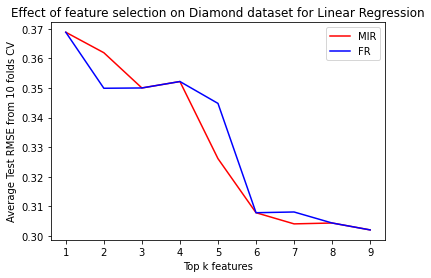

In [ ]:
plt.plot(np.arange(1, len(diamonds_RMSE_MIR) + 1, 1), np.negative(diamonds_RMSE_MIR), color = 'r', label = 'MIR')
plt.plot(np.arange(1, len(diamonds_RMSE_FR) + 1, 1), np.negative(diamonds_RMSE_FR), color = 'b', label = 'FR')

plt.legend()
plt.xlabel('Top k features')
plt.ylabel('Average Test RMSE from 10 folds CV')
plt.title('Effect of feature selection on Diamond dataset for Linear Regression')
plt.show()

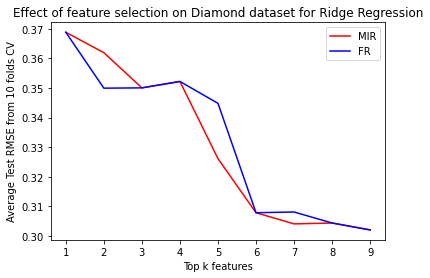

In [ ]:
plt.plot(np.arange(1, len(diamonds_RMSE_MIR_RR) + 1, 1), np.negative(diamonds_RMSE_MIR_RR), color = 'r', label = 'MIR')
plt.plot(np.arange(1, len(diamonds_RMSE_FR_RR) + 1, 1), np.negative(diamonds_RMSE_FR_RR), color = 'b', label = 'FR')

plt.legend()
plt.xlabel('Top k features')
plt.ylabel('Average Test RMSE from 10 folds CV')
plt.title('Effect of feature selection on Diamond dataset for Ridge Regression')
plt.show()

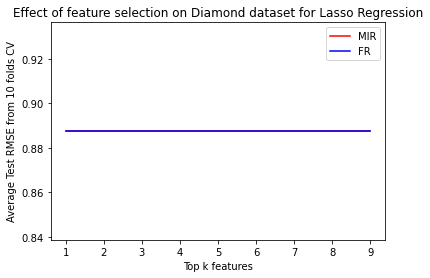

In [ ]:
plt.plot(np.arange(1, len(diamonds_RMSE_MIR_LR) + 1, 1), np.negative(diamonds_RMSE_MIR_LR), color = 'r', label = 'MIR')
plt.plot(np.arange(1, len(diamonds_RMSE_FR_LR) + 1, 1), np.negative(diamonds_RMSE_FR_LR), color = 'b', label = 'FR')

plt.legend()
plt.xlabel('Top k features')
plt.ylabel('Average Test RMSE from 10 folds CV')
plt.title('Effect of feature selection on Diamond dataset for Lasso Regression')
plt.show()

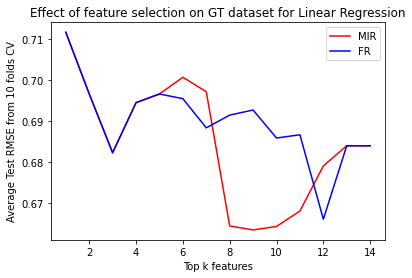

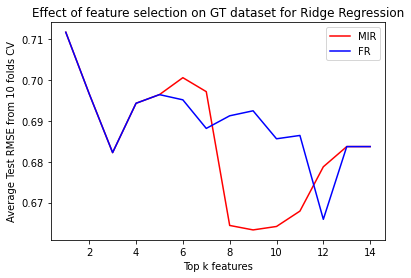

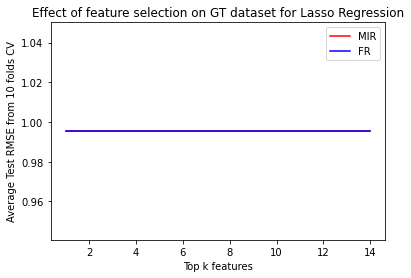

In [ ]:
plt.plot(np.arange(1, len(gt_RMSE_MIR) + 1, 1), np.negative(gt_RMSE_MIR), color = 'r', label = 'MIR')
plt.plot(np.arange(1, len(gt_RMSE_FR) + 1, 1), np.negative(gt_RMSE_FR), color = 'b', label = 'FR')

plt.legend()
plt.xlabel('Top k features')
plt.ylabel('Average Test RMSE from 10 folds CV')
plt.title('Effect of feature selection on GT dataset for Linear Regression')
plt.show()

plt.plot(np.arange(1, len(gt_RMSE_MIR_RR) + 1, 1), np.negative(gt_RMSE_MIR_RR), color = 'r', label = 'MIR')
plt.plot(np.arange(1, len(gt_RMSE_FR_RR) + 1, 1), np.negative(gt_RMSE_FR_RR), color = 'b', label = 'FR')

plt.legend()
plt.xlabel('Top k features')
plt.ylabel('Average Test RMSE from 10 folds CV')
plt.title('Effect of feature selection on GT dataset for Ridge Regression')
plt.show()

plt.plot(np.arange(1, len(gt_RMSE_MIR_LR) + 1, 1), np.negative(gt_RMSE_MIR_LR), color = 'r', label = 'MIR')
plt.plot(np.arange(1, len(gt_RMSE_FR_LR) + 1, 1), np.negative(gt_RMSE_FR_LR), color = 'b', label = 'FR')

plt.legend()
plt.xlabel('Top k features')
plt.ylabel('Average Test RMSE from 10 folds CV')
plt.title('Effect of feature selection on GT dataset for Lasso Regression')
plt.show()

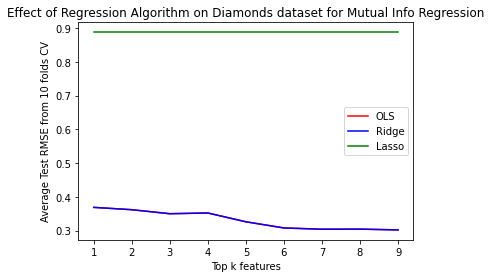

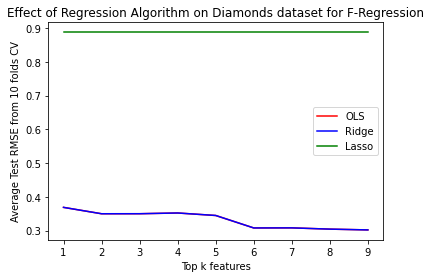

In [ ]:
plt.plot(np.arange(1, len(diamonds_RMSE_MIR) + 1, 1), np.negative(diamonds_RMSE_MIR), color = 'r', label = 'OLS')
plt.plot(np.arange(1, len(diamonds_RMSE_MIR_RR) + 1, 1), np.negative(diamonds_RMSE_MIR_RR), color = 'b', label = 'Ridge')
plt.plot(np.arange(1, len(diamonds_RMSE_MIR_LR) + 1, 1), np.negative(diamonds_RMSE_MIR_LR), color = 'g', label = 'Lasso')

plt.legend()
plt.xlabel('Top k features')
plt.ylabel('Average Test RMSE from 10 folds CV')
plt.title('Effect of Regression Algorithm on Diamonds dataset for Mutual Info Regression')
plt.show()

plt.plot(np.arange(1, len(diamonds_RMSE_FR) + 1, 1), np.negative(diamonds_RMSE_FR), color = 'r', label = 'OLS')
plt.plot(np.arange(1, len(diamonds_RMSE_FR_RR) + 1, 1), np.negative(diamonds_RMSE_FR_RR), color = 'b', label = 'Ridge')
plt.plot(np.arange(1, len(diamonds_RMSE_FR_LR) + 1, 1), np.negative(diamonds_RMSE_FR_LR), color = 'g', label = 'Lasso')

plt.legend()
plt.xlabel('Top k features')
plt.ylabel('Average Test RMSE from 10 folds CV')
plt.title('Effect of Regression Algorithm on Diamonds dataset for F-Regression')
plt.show()

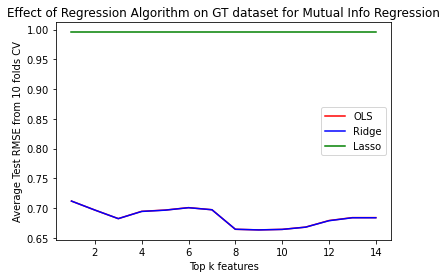

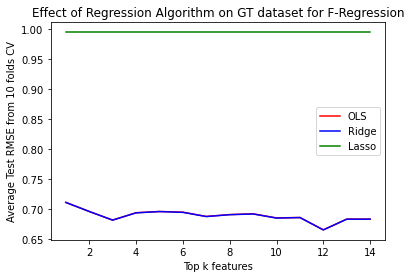

In [ ]:
plt.plot(np.arange(1, len(gt_RMSE_MIR) + 1, 1), np.negative(gt_RMSE_MIR), color = 'r', label = 'OLS')
plt.plot(np.arange(1, len(gt_RMSE_MIR_RR) + 1, 1), np.negative(gt_RMSE_MIR_RR), color = 'b', label = 'Ridge')
plt.plot(np.arange(1, len(gt_RMSE_MIR_LR) + 1, 1), np.negative(gt_RMSE_MIR_LR), color = 'g', label = 'Lasso')

plt.legend()
plt.xlabel('Top k features')
plt.ylabel('Average Test RMSE from 10 folds CV')
plt.title('Effect of Regression Algorithm on GT dataset for Mutual Info Regression')
plt.show()

plt.plot(np.arange(1, len(gt_RMSE_FR) + 1, 1), np.negative(gt_RMSE_FR), color = 'r', label = 'OLS')
plt.plot(np.arange(1, len(gt_RMSE_FR_RR) + 1, 1), np.negative(gt_RMSE_FR_RR), color = 'b', label = 'Ridge')
plt.plot(np.arange(1, len(gt_RMSE_FR_LR) + 1, 1), np.negative(gt_RMSE_FR_LR), color = 'g', label = 'Lasso')

plt.legend()
plt.xlabel('Top k features')
plt.ylabel('Average Test RMSE from 10 folds CV')
plt.title('Effect of Regression Algorithm on GT dataset for F-Regression')
plt.show()

# Question 9

In [12]:
# Read Data
diamonds_data = pd.read_csv('D1_Diamonds/diamonds.csv', index_col=0)

# Handle Categorical Data
diamonds_data['cut'].replace(['Fair', 'Good', 'Very Good', 'Premium', 'Ideal'], [1, 2, 3, 4, 5], inplace=True)
diamonds_data['color'].replace(['J', 'I', 'H', 'G', 'F', 'E', 'D'], [1, 2, 3, 4, 5, 6, 7], inplace=True)
diamonds_data['clarity'].replace(['I1', 'SI2', 'SI1', 'VS2', 'VS1', 'VVS2', 'VVS1', 'IF'], [1, 2, 3, 4, 5, 6, 7, 8], inplace=True)

# Split into features and target
X_diamond_df = diamonds_data[['carat', 'cut', 'color', 'clarity', 'x', 'y', 'z', 'depth', 'table']]
Y_diamond_df = diamonds_data[['price']]
Y_diamond = diamonds_data.price

# Standardize
#scalar = StandardScaler()
#X_diamond_S = scalar.fit_transform(X_diamond_df)
#X_diamond_S_df = pd.DataFrame(X_diamond_S, columns = X_diamond_df.columns)

#print('X_diamond_S')
#print(X_diamond_S_df.describe())

In [ ]:
from tempfile import mkdtemp
from joblib import Memory
cachedir = mkdtemp()
memory = Memory(cachedir=cachedir, verbose=5)

pipe_standard_linear = Pipeline([
    ('standardize', StandardScaler()),
    ('kbest', SelectKBest()),
    ('model', LinearRegression())
], memory = memory)

pipe_nonstandard_linear = Pipeline([
    ('kbest', SelectKBest()),
    ('model', LinearRegression())
], memory = memory)

param_grid_linear = [
    {
        'kbest__score_func': (mutual_info_regression, f_regression),
        'kbest__k': (1, 2, 3, 4, 5, 6, 7, 8, 9),
    }
]

grid1 = GridSearchCV(pipe_standard_linear, param_grid = param_grid_linear, cv = 10, n_jobs = -1, verbose = 1, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_diamond_df, Y_diamond_S)
grid2 = GridSearchCV(pipe_nonstandard_linear, param_grid = param_grid_linear, cv = 10, n_jobs = -1, verbose = 1, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_diamond_df, Y_diamond_S)

Fitting 10 folds for each of 18 candidates, totalling 180 fits


/var/folders/_3/nbqjnf7n6g96vdq2stjx78sr0000gn/T/ipykernel_6051/3790067162.py:4: DeprecationWarning: The 'cachedir' parameter has been deprecated in version 0.12 and will be removed in version 0.14.
You provided "cachedir='/var/folders/_3/nbqjnf7n6g96vdq2stjx78sr0000gn/T/tmp5k6jf6tz'", use "location='/var/folders/_3/nbqjnf7n6g96vdq2stjx78sr0000gn/T/tmp5k6jf6tz'" instead.
  memory = Memory(cachedir=cachedir, verbose=5)


________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(StandardScaler(),        carat  cut  color  clarity     x     y     z  depth  table
1       0.23    5      6        2  3.95  3.98  2.43   61.5   55.0
2       0.21    4      6        3  3.89  3.84  2.31   59.8   61.0
3       0.23    2      6        5  4.05  4.07  2.31   56.9   65.0
4       0.29    4      2        4  4.20  4.23  2.63   62.4   58.0
5       0.31    2      1        2  4.34  4.35  2.75   63.3   58.0
...      ...  ...    ...      ...   ...   ...   ...    ...    ...
53936   0.72    5      7        3  5.75  5.76  3.50   60.8   57.0
53937   0.72    2      7        3  5.69  5.75  3.61   63.1   55.0
53938   0.70    3      7        3  5.66  5.68  3.56   62.8   60.0
53939   0.86    4      3        2  6.15  6.12  3.74   61.0   58.0
53940   0.75    5      7        2  5.83  5.87  3.64   62.2   55.0

[53940 rows x 9 columns], 
0     

In [ ]:
pipe_standard = Pipeline([
    ('standardize', StandardScaler()),
    ('kbest', SelectKBest()),
    ('model', None)
], memory = memory)

pipe_nonstandard = Pipeline([
    ('kbest', SelectKBest()),
    ('model', None)
], memory = memory)

param_grid = [
    {
        'model': (Ridge(random_state=42), Lasso(random_state=42)),
        'model__alpha': (0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0),
        'kbest__score_func': (mutual_info_regression, f_regression),
        'kbest__k': (1, 2, 3, 4, 5, 6, 7, 8, 9),
    }
]

grid3 = GridSearchCV(pipe_standard, param_grid = param_grid, cv = 10, n_jobs = -1, verbose = 1, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_diamond_df, Y_diamond_S)
grid4 = GridSearchCV(pipe_nonstandard, param_grid = param_grid, cv = 10, n_jobs = -1, verbose = 1, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_diamond_df, Y_diamond_S)

Fitting 10 folds for each of 288 candidates, totalling 2880 fits
________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(StandardScaler(),        carat  cut  color  clarity     x     y     z  depth  table
1       0.23    5      6        2  3.95  3.98  2.43   61.5   55.0
2       0.21    4      6        3  3.89  3.84  2.31   59.8   61.0
3       0.23    2      6        5  4.05  4.07  2.31   56.9   65.0
4       0.29    4      2        4  4.20  4.23  2.63   62.4   58.0
5       0.31    2      1        2  4.34  4.35  2.75   63.3   58.0
...      ...  ...    ...      ...   ...   ...   ...    ...    ...
53936   0.72    5      7        3  5.75  5.76  3.50   60.8   57.0
53937   0.72    2      7        3  5.69  5.75  3.61   63.1   55.0
53938   0.70    3      7        3  5.66  5.68  3.56   62.8   60.0
53939   0.86    4      3        2  6.15  6.12  3.74   61.0   58.0
53940   0.75    5      7        2  

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(StandardScaler(),        carat  cut  color  clarity     x     y     z  depth  table
1       0.23    5      6        2  3.95  3.98  2.43   61.5   55.0
2       0.21    4      6        3  3.89  3.84  2.31   59.8   61.0
3       0.23    2      6        5  4.05  4.07  2.31   56.9   65.0
4       0.29    4      2        4  4.20  4.23  2.63   62.4   58.0
5       0.31    2      1        2  4.34  4.35  2.75   63.3   58.0
...      ...  ...    ...      ...   ...   ...   ...    ...    ...
53936   0.72    5      7        3  5.75  5.76  3.50   60.8   57.0
53937   0.72    2      7        3  5.69  5.75  3.61   63.1   55.0
53938   0.70    3      7        3  5.66  5.68  3.56   62.8   60.0
53939   0.86    4      3        2  6.15  6.12  3.74   61.0   58.0
53940   0.75    5      7        2  5.83  5.87  3.64   62.2   55.0

[48546 rows x 9 columns], 
0     

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(StandardScaler(),        carat  cut  color  clarity     x     y     z  depth  table
1       0.23    5      6        2  3.95  3.98  2.43   61.5   55.0
2       0.21    4      6        3  3.89  3.84  2.31   59.8   61.0
3       0.23    2      6        5  4.05  4.07  2.31   56.9   65.0
4       0.29    4      2        4  4.20  4.23  2.63   62.4   58.0
5       0.31    2      1        2  4.34  4.35  2.75   63.3   58.0
...      ...  ...    ...      ...   ...   ...   ...    ...    ...
53936   0.72    5      7        3  5.75  5.76  3.50   60.8   57.0
53937   0.72    2      7        3  5.69  5.75  3.61   63.1   55.0
53938   0.70    3      7        3  5.66  5.68  3.56   62.8   60.0
53939   0.86    4      3        2  6.15  6.12  3.74   61.0   58.0
53940   0.75    5      7        2  5.83  5.87  3.64   62.2   55.0

[48546 rows x 9 columns], 
0     

_fit_transform_one(SelectKBest(k=3, score_func=<function mutual_info_regression at 0x7fd5c84388b0>),        carat  cut  color  clarity     x     y     z  depth  table
1       0.23    5      6        2  3.95  3.98  2.43   61.5   55.0
2       0.21    4      6        3  3.89  3.84  2.31   59.8   61.0
3       0.23    2      6        5  4.05  4.07  2.31   56.9   65.0
4       0.29    4      2        4  4.20  4.23  2.63   62.4   58.0
5       0.31    2      1        2  4.34  4.35  2.75   63.3   58.0
...      ...  ...    ...      ...   ...   ...   ...    ...    ...
53936   0.72    5      7        3  5.75  5.76  3.50   60.8   57.0
53937   0.72    2      7        3  5.69  5.75  3.61   63.1   55.0
53938   0.70    3      7        3  5.66  5.68  3.56   62.8   60.0
53939   0.86    4      3        2  6.15  6.12  3.74   61.0   58.0
53940   0.75    5      7        2  5.83  5.87  3.64   62.2   55.0

[48546 rows x 9 columns], 
0       -0.903594
1       -0.904346
2       -0.904095
3       -0.901839
4      

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(StandardScaler(),        carat  cut  color  clarity     x     y     z  depth  table
1       0.23    5      6        2  3.95  3.98  2.43   61.5   55.0
2       0.21    4      6        3  3.89  3.84  2.31   59.8   61.0
3       0.23    2      6        5  4.05  4.07  2.31   56.9   65.0
4       0.29    4      2        4  4.20  4.23  2.63   62.4   58.0
5       0.31    2      1        2  4.34  4.35  2.75   63.3   58.0
...      ...  ...    ...      ...   ...   ...   ...    ...    ...
53936   0.72    5      7        3  5.75  5.76  3.50   60.8   57.0
53937   0.72    2      7        3  5.69  5.75  3.61   63.1   55.0
53938   0.70    3      7        3  5.66  5.68  3.56   62.8   60.0
53939   0.86    4      3        2  6.15  6.12  3.74   61.0   58.0
53940   0.75    5      7        2  5.83  5.87  3.64   62.2   55.0

[48546 rows x 9 columns], 
0     

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(StandardScaler(),        carat  cut  color  clarity     x     y     z  depth  table
5395    0.30    5      7        2  4.35  4.32  2.65   61.1   55.0
5396    0.30    4      7        2  4.35  4.32  2.61   60.2   60.0
5397    0.30    5      7        2  4.33  4.30  2.68   62.1   57.0
5398    0.30    4      7        2  4.31  4.28  2.68   62.4   58.0
5399    0.30    4      7        2  4.31  4.26  2.63   61.4   59.0
...      ...  ...    ...      ...   ...   ...   ...    ...    ...
53936   0.72    5      7        3  5.75  5.76  3.50   60.8   57.0
53937   0.72    2      7        3  5.69  5.75  3.61   63.1   55.0
53938   0.70    3      7        3  5.66  5.68  3.56   62.8   60.0
53939   0.86    4      3        2  6.15  6.12  3.74   61.0   58.0
53940   0.75    5      7        2  5.83  5.87  3.64   62.2   55.0

[48546 rows x 9 columns], 
5394  

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(StandardScaler(),        carat  cut  color  clarity     x     y     z  depth  table
1       0.23    5      6        2  3.95  3.98  2.43   61.5   55.0
2       0.21    4      6        3  3.89  3.84  2.31   59.8   61.0
3       0.23    2      6        5  4.05  4.07  2.31   56.9   65.0
4       0.29    4      2        4  4.20  4.23  2.63   62.4   58.0
5       0.31    2      1        2  4.34  4.35  2.75   63.3   58.0
...      ...  ...    ...      ...   ...   ...   ...    ...    ...
53936   0.72    5      7        3  5.75  5.76  3.50   60.8   57.0
53937   0.72    2      7        3  5.69  5.75  3.61   63.1   55.0
53938   0.70    3      7        3  5.66  5.68  3.56   62.8   60.0
53939   0.86    4      3        2  6.15  6.12  3.74   61.0   58.0
53940   0.75    5      7        2  5.83  5.87  3.64   62.2   55.0

[48546 rows x 9 columns], 
0     

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(StandardScaler(),        carat  cut  color  clarity     x     y     z  depth  table
1       0.23    5      6        2  3.95  3.98  2.43   61.5   55.0
2       0.21    4      6        3  3.89  3.84  2.31   59.8   61.0
3       0.23    2      6        5  4.05  4.07  2.31   56.9   65.0
4       0.29    4      2        4  4.20  4.23  2.63   62.4   58.0
5       0.31    2      1        2  4.34  4.35  2.75   63.3   58.0
...      ...  ...    ...      ...   ...   ...   ...    ...    ...
53936   0.72    5      7        3  5.75  5.76  3.50   60.8   57.0
53937   0.72    2      7        3  5.69  5.75  3.61   63.1   55.0
53938   0.70    3      7        3  5.66  5.68  3.56   62.8   60.0
53939   0.86    4      3        2  6.15  6.12  3.74   61.0   58.0
53940   0.75    5      7        2  5.83  5.87  3.64   62.2   55.0

[48546 rows x 9 columns], 
0     

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(StandardScaler(),        carat  cut  color  clarity     x     y     z  depth  table
1       0.23    5      6        2  3.95  3.98  2.43   61.5   55.0
2       0.21    4      6        3  3.89  3.84  2.31   59.8   61.0
3       0.23    2      6        5  4.05  4.07  2.31   56.9   65.0
4       0.29    4      2        4  4.20  4.23  2.63   62.4   58.0
5       0.31    2      1        2  4.34  4.35  2.75   63.3   58.0
...      ...  ...    ...      ...   ...   ...   ...    ...    ...
53936   0.72    5      7        3  5.75  5.76  3.50   60.8   57.0
53937   0.72    2      7        3  5.69  5.75  3.61   63.1   55.0
53938   0.70    3      7        3  5.66  5.68  3.56   62.8   60.0
53939   0.86    4      3        2  6.15  6.12  3.74   61.0   58.0
53940   0.75    5      7        2  5.83  5.87  3.64   62.2   55.0

[48546 rows x 9 columns], 
0     

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
Fitting 10 folds for each of 288 candidates, totalling 2880 fits
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cach

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min


In [ ]:
result1 = pd.DataFrame(grid1.cv_results_)[['mean_test_score', 'mean_train_score', 'param_kbest__score_func', 'param_kbest__k']]
result1['Standardize'] = True
result1['param_model'] = 'LinearRegression()'

result2 = pd.DataFrame(grid2.cv_results_)[['mean_test_score', 'mean_train_score', 'param_kbest__score_func', 'param_kbest__k']]
result2['Standardize'] = False
result2['param_model'] = 'LinearRegression()'

result3 = pd.DataFrame(grid3.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha', 'param_kbest__score_func', 'param_kbest__k']]
result3['Standardize'] = True

result4 = pd.DataFrame(grid4.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha', 'param_kbest__score_func', 'param_kbest__k']]
result4['Standardize'] = False

results = pd.concat([result1, result2, result3, result4])
results = results.sort_values(by=['mean_test_score'], ascending = False).reset_index(drop = True)
results.to_csv('diamonds.csv', sep='\t', encoding='utf-8')

In [ ]:
def readEmissionCSV(year):
    fileName = 'D2_GHG/gt_' + str(year) + '.csv'
    gt_yr_data = pd.read_csv(fileName)
    gt_yr_data['year'] = year
    return gt_yr_data

# Read Data
gt_data = readEmissionCSV(2011)
gt_data = gt_data.append(readEmissionCSV(2012))
gt_data = gt_data.append(readEmissionCSV(2013))
gt_data = gt_data.append(readEmissionCSV(2014))
gt_data = gt_data.append(readEmissionCSV(2015))

# Handle categorical data
dum = pd.get_dummies(gt_data['year'], columns=['year'], drop_first=False, prefix = 'year')
gt_data = pd.concat([gt_data, dum], axis=1)

# Split into features and target
X_gt_df = gt_data[['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'year']]
X_gt_df_years = gt_data[['AT', 'AP', 'AH', 'AFDP', 'GTEP', 'TIT', 'TAT', 'TEY', 'CDP', 'year_2011', 'year_2012', 'year_2013', 'year_2014', 'year_2015']]
Y_gt_df = gt_data[['CO']]
Y_gt = gt_data.CO

# Standardize
#scalar = StandardScaler()
#X_gt_S = scalar.fit_transform(X_gt_df)
#X_gt_S_df = pd.DataFrame(X_gt_S, columns = X_gt_df.columns)

#X_gt_S_years = scalar.fit_transform(X_gt_df_years)
#X_gt_S_df_years = pd.DataFrame(X_gt_S_years, columns = X_gt_df_years.columns)

#print('X_gt_S')
#print(X_gt_S_df.describe())

#print('X_gt_S_years')
#print(X_gt_S_df_years.describe())


In [ ]:
from tempfile import mkdtemp
from joblib import Memory
cachedir = mkdtemp()
memory = Memory(cachedir=cachedir, verbose=5)

pipe_standard_linear = Pipeline([
    ('standardize', StandardScaler()),
    ('kbest', SelectKBest()),
    ('model', LinearRegression())
], memory = memory)

pipe_nonstandard_linear = Pipeline([
    ('kbest', SelectKBest()),
    ('model', LinearRegression())
], memory = memory)

param_grid_linear = [
    {
        'kbest__score_func': (mutual_info_regression, f_regression),
        'kbest__k': (1, 2, 3, 4, 5, 6, 7, 8, 9, 10),
    }
]

grid1 = GridSearchCV(pipe_standard_linear, param_grid = param_grid_linear, cv = 10, n_jobs = -1, verbose = 1, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_gt_df, Y_gt_S)
grid2 = GridSearchCV(pipe_nonstandard_linear, param_grid = param_grid_linear, cv = 10, n_jobs = -1, verbose = 1, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_gt_df, Y_gt_S)

/var/folders/_3/nbqjnf7n6g96vdq2stjx78sr0000gn/T/ipykernel_6051/2868599385.py:4: DeprecationWarning: The 'cachedir' parameter has been deprecated in version 0.12 and will be removed in version 0.14.
You provided "cachedir='/var/folders/_3/nbqjnf7n6g96vdq2stjx78sr0000gn/T/tmpk_cmw9e2'", use "location='/var/folders/_3/nbqjnf7n6g96vdq2stjx78sr0000gn/T/tmpk_cmw9e2'" instead.
  memory = Memory(cachedir=cachedir, verbose=5)


Fitting 10 folds for each of 20 candidates, totalling 200 fits
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache 

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(StandardScaler(),           AT      AP      AH    AFDP    GTEP     TIT     TAT     TEY     CDP  \
0     4.5878  1018.7  83.675  3.5758  23.979  1086.2  549.83  134.67  11.898   
1     4.2932  1018.3  84.235  3.5709  23.951  1086.1  550.05  134.67  11.892   
2     3.9045  1018.4  84.858  3.5828  23.990  1086.5  550.19  135.10  12.042   
3     3.7436  1018.3  85.434  3.5808  23.911  1086.5  550.17  135.03  11.990   
4     3.7516  1017.8  85.182  3.5781  23.917  1085.9  550.00  134.67  11.910   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
7379  3.6268  1028.5  93.200  3.1661  19.087  1037.0  541.59  109.08  10.411   
7380  4.1674  1028.6  94.036  3.1923  19.016  1037.6  542.28  108.79  10.344   
7381  5.4820  1028.5  95.219  3.3128  18.857  1038.0  543.48  107.81  10.462   
7382  5.8837  1028.7  94.2

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=8, score_func=<function mutual_info_regression at 0x7f8831821280>),           AT      AP      AH    AFDP    GTEP     TIT     TAT     TEY     CDP  \
0     4.5878  1018.7  83.675  3.5758  23.979  1086.2  549.83  134.67  11.898   
1     4.2932  1018.3  84.235  3.5709  23.951  1086.1  550.05  134.67  11.892   
2     3.9045  1018.4  84.858  3.5828  23.990  1086.5  550.19  135.10  12.042   
3     3.7436  1018.3  85.434  3.5808  23.911  1086.5  550.17  135.03  11.990   
4     3.7516  1017.8  85.182  3.5781  23.917  1085.9  550.00  134.67  11.910   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
7379  3.6268  1028.5  93.200  3.1661  19.087  1037.0  541.59  109.08  10.411   
7380  4.1674  1028.6  94.036  3.1923  19.016  1037.6  542.28  108.79  10.344   
7381  5.4820  1028.5  95.219  3.3128  18.8

In [ ]:
pipe_standard = Pipeline([
    ('standardize', StandardScaler()),
    ('kbest', SelectKBest()),
    ('model', None)
], memory = memory)

pipe_nonstandard = Pipeline([
    ('kbest', SelectKBest()),
    ('model', None)
], memory = memory)

param_grid = [
    {
        'model': (Ridge(random_state=42), Lasso(random_state=42)),
        'model__alpha': (0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0),
        'kbest__score_func': (mutual_info_regression, f_regression),
        'kbest__k': (1, 2, 3, 4, 5, 6, 7, 8, 9, 10),
    }
]

grid3 = GridSearchCV(pipe_standard, param_grid = param_grid, cv = 10, n_jobs = -1, verbose = 1, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_gt_df, Y_gt_S)
grid4 = GridSearchCV(pipe_nonstandard, param_grid = param_grid, cv = 10, n_jobs = -1, verbose = 1, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_gt_df, Y_gt_S)

Fitting 10 folds for each of 320 candidates, totalling 3200 fits
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loadin

________________________________________________fit_transform_one - 4.0s, 0.1min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=2, score_func=<function mutual_info_regression at 0x7f8e181988b0>), array([[-1.827691, ..., -1.33717 ],
       ...,
       [-1.630339, ...,  1.698493]]), 
0       -0.904182
1       -0.850611
2       -0.849020
3       -0.946415
4       -0.930328
           ...   
36728    3.809943
36729    3.876679
36730    3.996008
36731    0.415856
36732    4.246601
Name: CO, Length: 33060, dtype: float64, 
None, message_clsname='Pipeline', message=None)
________________________________________________fit_transform_one - 3.6s, 0.1min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
________________________________

4      3.7516  1017.8  85.182  3.5781  ...  550.00  134.67  11.910  2011
...       ...     ...     ...     ...  ...     ...     ...     ...   ...
3706  26.7140  1010.3  64.507  4.2948  ...  544.79  147.81  13.158  2015
3707  29.0240  1010.5  60.526  4.2450  ...  546.54  146.34  13.124  2015
3708  30.4500  1010.7  54.090  4.2698  ...  545.81  146.73  13.141  2015
3709  30.3300  1010.9  55.449  4.2914  ...  545.56  146.94  13.175  2015
3710  30.2120  1010.7  54.566  4.2805  ...  545.85  146.74  13.157  2015

[33060 rows x 10 columns], 
0       -0.904182
1       -0.850611
2       -0.849020
3       -0.946415
4       -0.930328
           ...   
33055   -0.287393
33056   -0.178538
33057   -0.277626
33058   -0.193565
33059   -0.265428
Name: CO, Length: 33060, dtype: float64, 
None, message_clsname='Pipeline', message=None)
________________________________________________fit_transform_one - 3.6s, 0.1min
________________________________________________________________________________
[Memory] C

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=3, score_func=<function f_regression at 0x7fb1105c3430>),           AT      AP      AH    AFDP  ...     TAT     TEY     CDP  year
0     4.5878  1018.7  83.675  3.5758  ...  549.83  134.67  11.898  2011
1     4.2932  1018.3  84.235  3.5709  ...  550.05  134.67  11.892  2011
2     3.9045  1018.4  84.858  3.5828  ...  550.19  135.10  12.042  2011
3     3.7436  1018.3  85.434  3.5808  ...  550.17  135.03  11.990  2011
4     3.7516  1017.8  85.182  3.5781  ...  550.00  134.67  11.910  2011
...      ...     ...     ...     ...  ...     ...     ...     ...   ...
7379  3.6268  1028.5  93.200  3.1661  ...  541.59  109.08  10.411  2015
7380  4.1674  1028.6  94.036  3.1923  ...  542.28  108.79  10.344  2015
7381  5.4820  1028.5  95.219  3.3128  ...  543.48  107.81  10.462  2015
7382  5.8837  1028.7  94.200  3.9831  ...  550.11  1

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=7, score_func=<function f_regression at 0x7ffcd852b430>),           AT      AP      AH    AFDP  ...     TAT     TEY     CDP  year
0     4.5878  1018.7  83.675  3.5758  ...  549.83  134.67  11.898  2011
1     4.2932  1018.3  84.235  3.5709  ...  550.05  134.67  11.892  2011
2     3.9045  1018.4  84.858  3.5828  ...  550.19  135.10  12.042  2011
3     3.7436  1018.3  85.434  3.5808  ...  550.17  135.03  11.990  2011
4     3.7516  1017.8  85.182  3.5781  ...  550.00  134.67  11.910  2011
...      ...     ...     ...     ...  ...     ...     ...     ...   ...
7379  3.6268  1028.5  93.200  3.1661  ...  541.59  109.08  10.411  2015
7380  4.1674  1028.6  94.036  3.1923  ...  542.28  108.79  10.344  2015
7381  5.4820  1028.5  95.219  3.3128  ...  543.48  107.81  10.462  2015
7382  5.8837  1028.7  94.200  3.9831  ...  550.11  1

7382  5.8837  1028.7  94.200  3.9831  ...  550.11  131.41  11.771  2015
7383  6.0392  1028.8  94.547  3.8752  ...  548.23  125.41  11.462  2015

[33060 rows x 10 columns], 
0       -0.904182
1       -0.850611
2       -0.849020
3       -0.946415
4       -0.930328
           ...   
36728    3.809943
36729    3.876679
36730    3.996008
36731    0.415856
36732    4.246601
Name: CO, Length: 33060, dtype: float64, 
None, message_clsname='Pipeline', message=None)
________________________________________________fit_transform_one - 4.0s, 0.1min
________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(score_func=<function mutual_info_regression at 0x7ffd185788b0>),           AT      AP      AH    AFDP  ...     TAT     TEY     CDP  year
0     4.5878  1018.7  83.675  3.5758  ...  549.83  134.67  11.898  2011
1     4.2932  1018.3  84.235  3.5709  ...  550.05  134.67  11.892  2011
2     3.9

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 253.73202824003783, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 323.40752484161203, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(


________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=8, score_func=<function f_regression at 0x7fbe5081b430>),           AT      AP      AH    AFDP  ...     TAT     TEY     CDP  year
0     4.5878  1018.7  83.675  3.5758  ...  549.83  134.67  11.898  2011
1     4.2932  1018.3  84.235  3.5709  ...  550.05  134.67  11.892  2011
2     3.9045  1018.4  84.858  3.5828  ...  550.19  135.10  12.042  2011
3     3.7436  1018.3  85.434  3.5808  ...  550.17  135.03  11.990  2011
4     3.7516  1017.8  85.182  3.5781  ...  550.00  134.67  11.910  2011
...      ...     ...     ...     ...  ...     ...     ...     ...   ...
7379  3.6268  1028.5  93.200  3.1661  ...  541.59  109.08  10.411  2015
7380  4.1674  1028.6  94.036  3.1923  ...  542.28  108.79  10.344  2015
7381  5.4820  1028.5  95.219  3.3128  ...  543.48  107.81  10.462  2015
7382  5.8837  1028.7  94.200  3.9831  ...  550.11  1

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.366110724191458, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.49333875812772, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(


________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=9, score_func=<function f_regression at 0x7fd5c8393430>),           AT      AP      AH    AFDP  ...     TAT     TEY     CDP  year
0     4.5878  1018.7  83.675  3.5758  ...  549.83  134.67  11.898  2011
1     4.2932  1018.3  84.235  3.5709  ...  550.05  134.67  11.892  2011
2     3.9045  1018.4  84.858  3.5828  ...  550.19  135.10  12.042  2011
3     3.7436  1018.3  85.434  3.5808  ...  550.17  135.03  11.990  2011
4     3.7516  1017.8  85.182  3.5781  ...  550.00  134.67  11.910  2011
...      ...     ...     ...     ...  ...     ...     ...     ...   ...
7379  3.6268  1028.5  93.200  3.1661  ...  541.59  109.08  10.411  2015
7380  4.1674  1028.6  94.036  3.1923  ...  542.28  108.79  10.344  2015
7381  5.4820  1028.5  95.219  3.3128  ...  543.48  107.81  10.462  2015
7382  5.8837  1028.7  94.200  3.9831  ...  550.11  1

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 50.10877734543101, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(


[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.603695383886588, tolerance: 3.432197641283393
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 252.4768177722999, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.001376315185553, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/si

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.710502516962151, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.50787621021118, tolerance: 3.146867178164331
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39.08608370840011, tolerance: 3.432197641283393
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 400.8606808232689, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 28.120975685369558, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 628.3557708466014, tolerance: 3.1045305597316086
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/s

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.884338460939034, tolerance: 3.3296148031495907
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 993.7771767470986, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 656.1855094160437, tolerance: 3.1045305597316086
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/s

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16.009502464596153, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.242460217916232, tolerance: 3.1045305597316086
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 57.21484430736018, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/s

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
Fitting 10 folds for each of 320 candidates, totalling 3200 fits
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loadin

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.452893791662063, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(


___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.452893791662063, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.392160647568744, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.392160647568744, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4665.2294709822345, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 79.1824599511474, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(


___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 451.62529075573184, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(


[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 67.81642080939673, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2571.082233666578, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4835.635385756062, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/si

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 59.53568891121722, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31.32417024161441, tolerance: 3.146867178164331
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.6608811974329, tolerance: 3.324532579074931
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-p

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 418.1110924615332, tolerance: 3.1045305597316086
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5582.388621962517, tolerance: 3.432197641283393
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1636.7558389502574, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/s

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.147347955942678, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 768.9228867855636, tolerance: 3.324532579074931
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 782.1464613534499, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/s

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1603.7520514002426, tolerance: 3.324532579074931
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5983.448095003373, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4294.8383050023185, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/s

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4294.8383050023185, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1657.9961987071383, tolerance: 3.1045305597316086
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2784.6460252109364, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min


In [ ]:
pipe_standard_linear = Pipeline([
    ('standardize', StandardScaler()),
    ('kbest', SelectKBest()),
    ('model', LinearRegression())
], memory = memory)

pipe_nonstandard_linear = Pipeline([
    ('kbest', SelectKBest()),
    ('model', LinearRegression())
], memory = memory)

param_grid_linear = [
    {
        'kbest__score_func': (mutual_info_regression, f_regression),
        'kbest__k': (1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14),
    }
]

grid5 = GridSearchCV(pipe_standard_linear, param_grid = param_grid_linear, cv = 10, n_jobs = -1, verbose = 1, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_gt_df_years, Y_gt_S)
grid6 = GridSearchCV(pipe_nonstandard_linear, param_grid = param_grid_linear, cv = 10, n_jobs = -1, verbose = 1, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_gt_df_years, Y_gt_S)

Fitting 10 folds for each of 28 candidates, totalling 280 fits
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading 

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(StandardScaler(),           AT      AP      AH    AFDP    GTEP     TIT     TAT     TEY     CDP  \
0     4.5878  1018.7  83.675  3.5758  23.979  1086.2  549.83  134.67  11.898   
1     4.2932  1018.3  84.235  3.5709  23.951  1086.1  550.05  134.67  11.892   
2     3.9045  1018.4  84.858  3.5828  23.990  1086.5  550.19  135.10  12.042   
3     3.7436  1018.3  85.434  3.5808  23.911  1086.5  550.17  135.03  11.990   
4     3.7516  1017.8  85.182  3.5781  23.917  1085.9  550.00  134.67  11.910   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
7379  3.6268  1028.5  93.200  3.1661  19.087  1037.0  541.59  109.08  10.411   
7380  4.1674  1028.6  94.036  3.1923  19.016  1037.6  542.28..., 
0       -0.904182
1       -0.850611
2       -0.849020
3       -0.946415
4       -0.930328
           ...   
36728    3.8

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

________________________________________________fit_transform_one - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=3, score_func=<function f_regression at 0x7fb1105c3430>), array([[-1.706966, ..., -0.536268],
       ...,
       [-1.511903, ...,  1.864738]]), 
0       -0.904182
1       -0.850611
2       -0.849020
3       -0.946415
4       -0.930328
           ...   
36728    3.809943
36729    3.876679
36730    3.996008
36731    0.415856
36732    4.246601
Name: CO, Length: 33060, dtype: float64, 
None, message_clsname='Pipeline', message=None)
________________________________________________fit_transform_one - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tra

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=5, score_func=<function mutual_info_regression at 0x7fa7005788b0>), array([[-1.817248, ..., -0.536268],
       ...,
       [-1.623428, ...,  1.864738]]), 
0       -0.904182
1       -0.850611
2       -0.849020
3       -0.946415
4       -0.930328
           ...   
36728    3.809943
36729    3.876679
36730    3.996008
36731    0.415856
36732    4.246601
Name: CO, Length: 33060, dtype: float64, 
None, message_clsname='Pipeline', message=None)
________________________________________________fit_transform_one - 5.3s, 0.1min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
________________________________________________________________________________
[Memory

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=6, score_func=<function mutual_info_regression at 0x7ffd185788b0>), array([[-1.698098, ..., -0.536268],
       ...,
       [-1.50426 , ...,  1.864738]]), 
0       -0.904182
1       -0.850611
2       -0.849020
3       -0.946415
4       -0.930328
           ...   
36728    3.809943
36729    3.876679
36730    3.996008
36731    0.415856
36732    4.246601
Name: CO, Length: 33060, dtype: float64, 
None, message_clsname='Pipeline', message=None)
________________________________________________fit_transform_one - 5.8s, 0.1min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
________________________________________________________________________________
[Memory

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(score_func=<function mutual_info_regression at 0x7f8831821280>),           AT      AP      AH    AFDP    GTEP     TIT     TAT     TEY     CDP  \
0     4.5878  1018.7  83.675  3.5758  23.979  1086.2  549.83  134.67  11.898   
1     4.2932  1018.3  84.235  3.5709  23.951  1086.1  550.05  134.67  11.892   
2     3.9045  1018.4  84.858  3.5828  23.990  1086.5  550.19  135.10  12.042   
3     3.7436  1018.3  85.434  3.5808  23.911  1086.5  550.17  135.03  11.990   
4     3.7516  1017.8  85.182  3.5781  23.917  1085.9  550.00  134.67  11.910   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
7379  3.6268  1028.5  93.200  3.1661  19.087  1037.0  541.59  109.08  10.411   
7380  4.1674  1028.6  94.036  3.1923  19.016  1037.6  542.28..., 
0       -0.904182
1       -0.850611
2       -0.849020
3      

In [ ]:
pipe_standard = Pipeline([
    ('standardize', StandardScaler()),
    ('kbest', SelectKBest()),
    ('model', None)
], memory = memory)

pipe_nonstandard = Pipeline([
    ('kbest', SelectKBest()),
    ('model', None)
], memory = memory)

param_grid = [
    {
        'model': (Ridge(random_state=42), Lasso(random_state=42)),
        'model__alpha': (0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0),
        'kbest__score_func': (mutual_info_regression, f_regression),
        'kbest__k': (1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14),
    }
]

grid7 = GridSearchCV(pipe_standard, param_grid = param_grid, cv = 10, n_jobs = -1, verbose = 1, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_gt_df_years, Y_gt_S)
grid8 = GridSearchCV(pipe_nonstandard, param_grid = param_grid, cv = 10, n_jobs = -1, verbose = 1, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_gt_df_years, Y_gt_S)

Fitting 10 folds for each of 448 candidates, totalling 4480 fits
________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=1, score_func=<function mutual_info_regression at 0x7ff6005488b0>),            AT      AP      AH  ...  year_2013  year_2014  year_2015
0      4.5878  1018.7  83.675  ...          0          0          0
1      4.2932  1018.3  84.235  ...          0          0          0
2      3.9045  1018.4  84.858  ...          0          0          0
3      3.7436  1018.3  85.434  ...          0          0          0
4      3.7516  1017.8  85.182  ...          0          0          0
...       ...     ...     ...  ...        ...        ...        ...
3706  26.7140  1010.3  64.507  ...          0          0          1
3707  29.0240  1010.5  60.526  ...          0          0          1
3708  30.4500  1010.7  54.090  ...          0          0          1
3709  30.3300  10

________________________________________________fit_transform_one - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=11, score_func=<function f_regression at 0x7f8e68a43430>), array([[-1.744881, ..., -0.355589],
       ...,
       [ 1.721612, ...,  2.812232]]), 
0       -0.904182
1       -0.850611
2       -0.849020
3       -0.946415
4       -0.930328
           ...   
33055   -0.287393
33056   -0.178538
33057   -0.277626
33058   -0.193565
33059   -0.265428
Name: CO, Length: 33060, dtype: float64, 
None, message_clsname='Pipeline', message=None)
________________________________________________fit_transform_one - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=2, score_func=<function mutual_info_regression at 0x7fcdc02b08b0>),           AT      AP      AH  ...  year_2013  year_2014  year_2015
0     4.5878  1018.7  83.675  ...          0          0          0
1     4.2932  1018.3  84.235  ...          0          0          0
2     3.9045  1018.4  84.858  ...          0          0          0
3     3.7436  1018.3  85.434  ...          0          0          0
4     3.7516  1017.8  85.182  ...          0          0          0
...      ...     ...     ...  ...        ...        ...        ...
7379  3.6268  1028.5  93.200  ...          0          0          1
7380  4.1674  1028.6  94.036  ...          0          0          1
7381  5.4820  1028.5  95.219  ...          0          0          1
7382  5.8837  1028.7  94.200  ...          0          0          1
7383  6.0392  1028.8  94.

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=7, score_func=<function f_regression at 0x7fb1105c3430>),           AT      AP      AH  ...  year_2013  year_2014  year_2015
0     4.5878  1018.7  83.675  ...          0          0          0
1     4.2932  1018.3  84.235  ...          0          0          0
2     3.9045  1018.4  84.858  ...          0          0          0
3     3.7436  1018.3  85.434  ...          0          0          0
4     3.7516  1017.8  85.182  ...          0          0          0
...      ...     ...     ...  ...        ...        ...        ...
7379  3.6268  1028.5  93.200  ...          0          0          1
7380  4.1674  1028.6  94.036  ...          0          0          1
7381  5.4820  1028.5  95.219  ...          0          0          1
7382  5.8837  1028.7  94.200  ...          0          0          1
7383  6.0392  1028.8  94.547  ...  

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=5, score_func=<function mutual_info_regression at 0x7fd5c84388b0>),           AT      AP      AH  ...  year_2013  year_2014  year_2015
0     4.5878  1018.7  83.675  ...          0          0          0
1     4.2932  1018.3  84.235  ...          0          0          0
2     3.9045  1018.4  84.858  ...          0          0          0
3     3.7436  1018.3  85.434  ...          0          0          0
4     3.7516  1017.8  85.182  ...          0          0          0
...      ...     ...     ...  ...        ...        ...        ...
7379  3.6268  1028.5  93.200  ...          0          0          1
7380  4.1674  1028.6  94.036  ...          0          0          1
7381  5.4820  1028.5  95.219  ...          0          0          1
7382  5.8837  1028.7  94.200  ...          0          0          1
7383  6.0392  1028.8  94.

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=11, score_func=<function f_regression at 0x7ffcd852b430>),           AT      AP      AH  ...  year_2013  year_2014  year_2015
0     4.5878  1018.7  83.675  ...          0          0          0
1     4.2932  1018.3  84.235  ...          0          0          0
2     3.9045  1018.4  84.858  ...          0          0          0
3     3.7436  1018.3  85.434  ...          0          0          0
4     3.7516  1017.8  85.182  ...          0          0          0
...      ...     ...     ...  ...        ...        ...        ...
7379  3.6268  1028.5  93.200  ...          0          0          1
7380  4.1674  1028.6  94.036  ...          0          0          1
7381  5.4820  1028.5  95.219  ...          0          0          1
7382  5.8837  1028.7  94.200  ...          0          0          1
7383  6.0392  1028.8  94.547  ... 

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(score_func=<function mutual_info_regression at 0x7fa7005788b0>),           AT      AP      AH  ...  year_2013  year_2014  year_2015
0     4.5878  1018.7  83.675  ...          0          0          0
1     4.2932  1018.3  84.235  ...          0          0          0
2     3.9045  1018.4  84.858  ...          0          0          0
3     3.7436  1018.3  85.434  ...          0          0          0
4     3.7516  1017.8  85.182  ...          0          0          0
...      ...     ...     ...  ...        ...        ...        ...
7379  3.6268  1028.5  93.200  ...          0          0          1
7380  4.1674  1028.6  94.036  ...          0          0          1
7381  5.4820  1028.5  95.219  ...          0          0          1
7382  5.8837  1028.7  94.200  ...          0          0          1
7383  6.0392  1028.8  94.547  

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 253.73202824003783, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 323.40752484161203, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.366110724191458, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/

________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=14,
            score_func=<function mutual_info_regression at 0x7ff6005488b0>), 
          AT      AP      AH  ...  year_2013  year_2014  year_2015
0     4.5878  1018.7  83.675  ...          0          0          0
1     4.2932  1018.3  84.235  ...          0          0          0
2     3.9045  1018.4  84.858  ...          0          0          0
3     3.7436  1018.3  85.434  ...          0          0          0
4     3.7516  1017.8  85.182  ...          0          0          0
...      ...     ...     ...  ...        ...        ...        ...
7379  3.6268  1028.5  93.200  ...          0          0          1
7380  4.1674  1028.6  94.036  ...          0          0          1
7381  5.4820  1028.5  95.219  ...          0          0          1
7382  5.8837  1028.7  94.200  ...          0          0          1
7383  6.039

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 51.81680843488721, tolerance: 3.3296148031495907
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 73.39923901150723, tolerance: 3.324532579074931
  model = cd_fast.enet_coordinate_descent(


___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 317.6185111450377, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.372701405953194, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.01901594341507, tolerance: 3.146867178164331
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8.210024142765178, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 280.2636602872808, tolerance: 3.3296148031495907
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.527949432942478, tolerance: 3.336842178704525
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/si

[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 404.41959473209135, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 335.5541853566265, tolerance: 3.336842178704525
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 440.64682350201656, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 818.0125705086939, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.788206604389416, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.796776146204138, tolerance: 3.432197641283393
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/s

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 330.4505154595481, tolerance: 3.146867178164331
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.629139301927353, tolerance: 3.1045305597316086
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.5566191365342092, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(


[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.221458806638111, tolerance: 3.336842178704525
  model = cd_fast.enet_coordinate_descent(


_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0mi

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 331.7767236586533, tolerance: 3.3296148031495907
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 393.72514267387487, tolerance: 3.324532579074931
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.3921437612716545, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 761.8963082769933, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1566.7201203024542, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1212.3368524144744, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1025.7972136210938, tolerance: 3.3296148031495907
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 184.43533546949948, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 820.3094397271107, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.253506860071866, tolerance: 3.146867178164331
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 338.31392169860555, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 648.2835409072322, tolerance: 3.336842178704525
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/si

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1075.1478192693066, tolerance: 3.336842178704525
  model = cd_fast.enet_coordinate_descent(


_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1206.2281269020923, tolerance: 3.146867178164331
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 285.4592872523408, tolerance: 3.1045305597316086
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4596.542655446347, tolerance: 3.432197641283393
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/si

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1072.591632580401, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 788.8737751972294, tolerance: 3.324532579074931
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 939.7984997209933, tolerance: 3.3296148031495907
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/si

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
________________________________________________________________________________
[Memory] Calling sklearn.pipeline._fit_transform_one...
_fit_transform_one(SelectKBest(k=12,
            score_func=<function mutual_info_regression at 0x7f8831821280>), 
array([[-1.762362, ..., -0.50159 ],
       ...,
       [-1.567474, ...,  1.993659]]), 
0       -0.904182
1       -0.850611
2       -0.849020
3       -0.946415
4       -0.930328
           ...   
36728    3.809943
36729    3.876679
36730    3.996008
36731    0.415856
36732    4.246601
Name: CO, Length: 36733, dtype: float64, 
None, message_clsname='Pipeline', message=None)
________________________________________________fit_transform_one - 3.4s, 0.1min
Fitting 10 folds for each of 448 candidates, totalling 4480 fits
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
__________________________________

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.452893791662063, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(


___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13.452893791662063, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(


___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.392160647568744, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.392160647568744, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(


[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 10.694177120061795, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4665.2294709822345, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 188.9810755510498, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 564.1047167470169, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3516.250618565782, tolerance: 3.432197641283393
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38.57450190028612, tolerance: 3.1045305597316086
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/sit

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 658.5081746878041, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 569.5685088832961, tolerance: 3.146867178164331
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1860.6447450423711, tolerance: 3.3296148031495907
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/s

[Memory]0.1s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2353.047387139298, tolerance: 3.432197641283393
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 99.16406953696242, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(


t_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0m

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.163084059200628, tolerance: 3.324532579074931
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5047.860920903593, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5309.816215224914, tolerance: 3.1045305597316086
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/sit

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 397.99015214658357, tolerance: 3.146867178164331
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 436.0625175177174, tolerance: 3.3296148031495907
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.71184425593856, tolerance: 3.324532579074931
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/si

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6171.974026264145, tolerance: 3.336842178704525
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5490.4395011358865, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4.781054164352099, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/s

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.359587165032281, tolerance: 3.336842178704525
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.274632034566821, tolerance: 3.146867178164331
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6005.175423132374, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/sit

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6711.329631005508, tolerance: 3.432197641283393
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.6036869844956527, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6037.490279201123, tolerance: 3.3296148031495907
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/s

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6063.3578467963225, tolerance: 3.3296148031495907
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93.32533364413212, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(


 cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6562.2958955092545, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6117.201972512656, tolerance: 3.1045305597316086
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5396.806113466001, tolerance: 3.432197641283393
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/si

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6171.097329519126, tolerance: 3.324532579074931
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6246.770446532352, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6017.23000451367, tolerance: 3.3296148031495907
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/sit

___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 55.52718685882792, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 93.78215319361334, tolerance: 3.336842178704525
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.675396475451635, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/si

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 447.81556557546355, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1709.3603661729276, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5976.164721745387, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min
[Memory]0.0s, 0.0min    : Loading _fit_tr

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4310.379058625164, tolerance: 3.432197641283393
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.274465110504025, tolerance: 3.146867178164331
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 392.94213443744775, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/si

[Memory]0.0s, 0.0min    : Loading _fit_transform_one...
___________________________________fit_transform_one cache loaded - 0.0s, 0.0min


In [ ]:
result1 = pd.DataFrame(grid1.cv_results_)[['mean_test_score', 'mean_train_score', 'param_kbest__score_func', 'param_kbest__k']]
result1['Standardize'] = True
result1['param_model'] = 'LinearRegression()'
result1['year'] = 'Direct'

result2 = pd.DataFrame(grid2.cv_results_)[['mean_test_score', 'mean_train_score', 'param_kbest__score_func', 'param_kbest__k']]
result2['Standardize'] = False
result2['param_model'] = 'LinearRegression()'
result2['year'] = 'Direct'

result3 = pd.DataFrame(grid3.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha', 'param_kbest__score_func', 'param_kbest__k']]
result3['Standardize'] = True
result3['year'] = 'Direct'

result4 = pd.DataFrame(grid4.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha', 'param_kbest__score_func', 'param_kbest__k']]
result4['Standardize'] = False
result4['year'] = 'Direct'

result5 = pd.DataFrame(grid5.cv_results_)[['mean_test_score', 'mean_train_score', 'param_kbest__score_func', 'param_kbest__k']]
result5['Standardize'] = True
result5['param_model'] = 'LinearRegression()'
result5['year'] = 'One Hot'

result6 = pd.DataFrame(grid6.cv_results_)[['mean_test_score', 'mean_train_score', 'param_kbest__score_func', 'param_kbest__k']]
result6['Standardize'] = False
result6['param_model'] = 'LinearRegression()'
result6['year'] = 'One Hot'

result7 = pd.DataFrame(grid7.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha', 'param_kbest__score_func', 'param_kbest__k']]
result7['Standardize'] = True
result7['year'] = 'One Hot'

result8 = pd.DataFrame(grid8.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model', 'param_model__alpha', 'param_kbest__score_func', 'param_kbest__k']]
result8['Standardize'] = False
result8['year'] = 'One Hot'

results = pd.concat([result1, result2, result3, result4, result5, result6, result7, result8])
results = results.sort_values(by=['mean_test_score'], ascending = False).reset_index(drop = True)
results.to_csv('GT.csv', sep='\t', encoding='utf-8')

# Question 11

In [ ]:
import statsmodels.api as sm
 
lm_fit = sm.OLS(Y_diamond_S, sm.add_constant(X_diamond_S)).fit()
print(lm_fit.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.907
Model:                            OLS   Adj. R-squared:                  0.907
Method:                 Least Squares   F-statistic:                 5.845e+04
Date:                Thu, 10 Mar 2022   Prob (F-statistic):               0.00
Time:                        16:17:58   Log-Likelihood:                -12477.
No. Observations:               53940   AIC:                         2.497e+04
Df Residuals:                   53930   BIC:                         2.506e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -6.661e-16      0.001  -5.07e-13      1.0

In [ ]:
lm_fit.pvalues


const       1.000000e+00
carat       0.000000e+00
cut         1.113990e-98
color       0.000000e+00
clarity     0.000000e+00
x          3.098309e-136
y           3.501855e-02
z           4.158692e-01
depth       4.663890e-62
table       1.130952e-19
dtype: float64

In [ ]:
import statsmodels.api as sm
 
lm_fit = sm.OLS(Y_gt_S, sm.add_constant(X_gt_S)).fit()
print(lm_fit.summary())

                            OLS Regression Results                            
Dep. Variable:                     CO   R-squared:                       0.599
Model:                            OLS   Adj. R-squared:                  0.599
Method:                 Least Squares   F-statistic:                     3917.
Date:                Thu, 10 Mar 2022   Prob (F-statistic):               0.00
Time:                        16:18:30   Log-Likelihood:                -35341.
No. Observations:               36733   AIC:                         7.071e+04
Df Residuals:                   36718   BIC:                         7.084e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0019      0.005      0.399      0.6

In [ ]:
lm_fit.pvalues

const         6.900833e-01
AT            8.288866e-57
AP            1.780828e-02
AH            9.493852e-01
AFDP          7.389446e-01
GTEP          4.698295e-01
TIT           4.044448e-02
TAT          3.310755e-126
TEY          1.223186e-137
CDP           5.535595e-11
year_2011     5.733834e-01
year_2012     5.733834e-01
year_2013     5.733834e-01
year_2014     5.733834e-01
year_2015     5.733834e-01
dtype: float64

# Question 12

In [ ]:
# Best previously was top 9 with F-Regression
selK = SelectKBest(score_func = f_regression, k = 9)
X_diamond_df_topk = selK.fit_transform(X_diamond_df, Y_diamond_S)

pipeline = Pipeline([
    ('PR', PolynomialFeatures()),
    ('standardize', StandardScaler()),
    ('model', Ridge(random_state=42))
])

param_grid = [
    {
        'PR__degree': (1, 2, 3, 4, 5),
        'model__alpha': (0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0)
    }
]

grid = GridSearchCV(pipeline, param_grid = param_grid, cv = 10, n_jobs = -1, verbose = 3, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_diamond_df_topk, Y_diamond_S)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


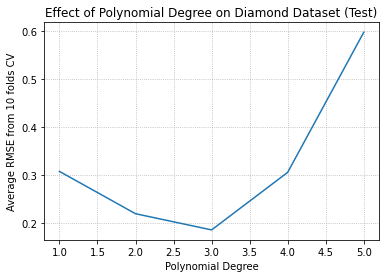

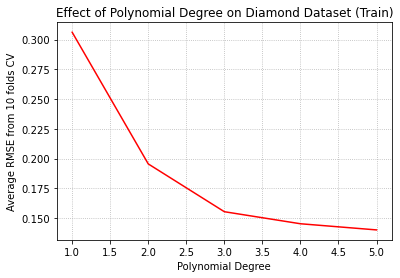

In [ ]:
poly_result = pd.DataFrame(grid.cv_results_)[['mean_test_score','mean_train_score','param_PR__degree','param_model__alpha']]
results = poly_result.sort_values(by=['mean_test_score'], ascending = False).reset_index(drop = True)
results.to_csv('diamond_PR.csv', sep='\t', encoding='utf-8')
score = []
train = []
alpha = []
degree_list = np.arange(1,6,1)

for i in degree_list:
    score.append((poly_result.loc[poly_result['param_PR__degree'] == i]).max().mean_test_score)
    train.append((poly_result.loc[poly_result['param_PR__degree'] == i]).max().mean_train_score)
    alpha.append(float(poly_result['param_model__alpha'][
        (poly_result.loc[poly_result['param_PR__degree'] == i])
        [['mean_test_score']].idxmax()].to_numpy()))

plt.plot(degree_list, np.negative(score))
plt.grid(linestyle=':')
plt.xlabel('Polynomial Degree')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of Polynomial Degree on Diamond Dataset (Test)')
plt.show()

plt.plot(degree_list, np.negative(train), 'r')
plt.grid(linestyle=':')
plt.xlabel('Polynomial Degree')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of Polynomial Degree on Diamond Dataset (Train)')
plt.show()

In [ ]:
selK = SelectKBest(score_func = f_regression, k = 9)
X_diamond_df_topk = selK.fit_transform(X_diamond_df, Y_diamond_S)
column_names = X_diamond_df.columns[selK.get_support()]

b_params = grid.best_estimator_.get_params()
b_coefs = b_params['model'].coef_
b_feature_name = list(column_names)
b_names = b_params['PR'].get_feature_names(b_feature_name)
b_sorted_indice = np.argsort(-abs(b_coefs))
salient_features =[b_names[i] for i in b_sorted_indice[:5]]
print ('Top 5 Salient features (Diamond):',salient_features)

Top 5 Salient features (Diamond): ['carat color clarity', 'carat^2 clarity', 'carat^3', 'carat clarity y', 'z']


In [ ]:
# Best previously was top 9 with Mutual-Info-Regression
X_gt_df_topk = SelectKBest(score_func = mutual_info_regression, k = 9).fit_transform(X_gt_df_years, Y_gt_S)

pipeline = Pipeline([
    ('PR', PolynomialFeatures()),
    ('standardize', StandardScaler()),
    ('model', None)
])

param_grid = [
    {
        'model': (Ridge(random_state=42), Lasso(random_state=42)),
        'PR__degree': (1, 2, 3, 4),
        'model__alpha': (0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0)
    }
]

grid = GridSearchCV(pipeline, param_grid = param_grid, cv = 10, n_jobs = -1, verbose = 3, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_gt_df_topk, Y_gt_S)

Fitting 10 folds for each of 64 candidates, totalling 640 fits


/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 818.0125705076753, tolerance: 3.1997832011137284
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6.788206604378502, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19.79677614848879, tolerance: 3.432197641283393
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/si

[CV 1/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.0001;, score=(train=-0.654, test=-0.413) total time=   0.1s
[CV 4/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.001;, score=(train=-0.634, test=-0.631) total time=   0.0s
[CV 2/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.01;, score=(train=-0.622, test=-0.731) total time=   0.0s
[CV 9/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.01;, score=(train=-0.631, test=-0.839) total time=   0.0s
[CV 7/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.1;, score=(train=-0.644, test=-0.537) total time=   0.0s
[CV 1/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=1.0;, score=(train=-0.654, test=-0.413) total time=   0.0s
[CV 1/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=10.0;, score=(train=-0.654, test=-0.412) total time=   0.0s
[CV 2/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=10.0;, scor

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 5/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.0001;, score=(train=-0.637, test=-0.625) total time=   0.1s
[CV 2/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.001;, score=(train=-0.622, test=-0.731) total time=   0.0s
[CV 5/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.01;, score=(train=-0.637, test=-0.625) total time=   0.0s
[CV 3/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.1;, score=(train=-0.603, test=-0.911) total time=   0.0s
[CV 5/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=1.0;, score=(train=-0.637, test=-0.625) total time=   0.0s
[CV 9/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=10.0;, score=(train=-0.631, test=-0.830) total time=   0.0s
[CV 10/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=10.0;, score=(train=-0.636, test=-0.638) total time=   0.0s
[CV 5/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=1000.0;, s

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 573.2530640795512, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(


[CV 4/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.0001;, score=(train=-0.634, test=-0.631) total time=   0.1s
[CV 10/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.0001;, score=(train=-0.636, test=-0.637) total time=   0.0s
[CV 8/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.001;, score=(train=-0.627, test=-0.692) total time=   0.0s
[CV 1/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.01;, score=(train=-0.654, test=-0.413) total time=   0.0s
[CV 10/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.01;, score=(train=-0.636, test=-0.637) total time=   0.0s
[CV 8/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.1;, score=(train=-0.627, test=-0.692) total time=   0.0s
[CV 6/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=1.0;, score=(train=-0.635, test=-0.628) total time=   0.0s
[CV 3/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=100.0;,

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4706.182416464557, tolerance: 3.324532579074931
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4426.176230563801, tolerance: 3.3296148031495907
  model = cd_fast.enet_coordinate_descent(


[CV 3/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.0001;, score=(train=-0.603, test=-0.911) total time=   0.1s
[CV 5/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.001;, score=(train=-0.637, test=-0.625) total time=   0.0s
[CV 9/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.001;, score=(train=-0.631, test=-0.839) total time=   0.0s
[CV 7/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.01;, score=(train=-0.644, test=-0.537) total time=   0.0s
[CV 1/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.1;, score=(train=-0.654, test=-0.413) total time=   0.0s
[CV 9/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=0.1;, score=(train=-0.631, test=-0.839) total time=   0.0s
[CV 4/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=1.0;, score=(train=-0.634, test=-0.631) total time=   0.0s
[CV 5/10] END PR__degree=1, model=Ridge(random_state=42), model__alpha=100.0;, sco

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5106.527838497959, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4654.969682246631, tolerance: 3.2642173234339382
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4374.27455917975, tolerance: 3.146867178164331
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 5.844104806510586, tolerance: 3.336842178704525
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4825.000795082625, tolerance: 3.489458514881779
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4706.184617978716, tolerance: 3.1045305597316086
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/sit

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14.993320737852628, tolerance: 3.4027038604186974
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.502795519505526, tolerance: 3.432197641283393
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11.22987827569159, tolerance: 3.3296148031495907
  model = cd_fast.enet_coordinate_descent(
/Users/madhavsankar/opt/anaconda3/lib/python3.9/s

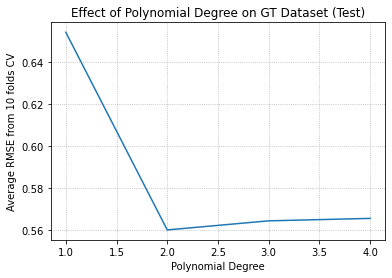

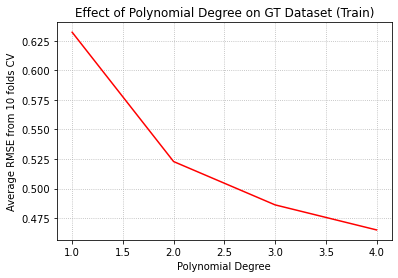

In [ ]:
poly_result = pd.DataFrame(grid.cv_results_)[['mean_test_score','mean_train_score','param_model', 'param_PR__degree','param_model__alpha']]
results = poly_result.sort_values(by=['mean_test_score'], ascending = False).reset_index(drop = True)
results.to_csv('gt_PR.csv', sep='\t', encoding='utf-8')
score = []
train = []
alpha = []
degree_list = np.arange(1,5,1)

for i in degree_list:
    score.append((poly_result.loc[poly_result['param_PR__degree'] == i]).max().mean_test_score)
    train.append((poly_result.loc[poly_result['param_PR__degree'] == i]).max().mean_train_score)
    alpha.append(float(poly_result['param_model__alpha'][
        (poly_result.loc[poly_result['param_PR__degree'] == i])
        [['mean_test_score']].idxmax()].to_numpy()))

plt.plot(degree_list, np.negative(score))
plt.grid(linestyle=':')
plt.xlabel('Polynomial Degree')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of Polynomial Degree on GT Dataset (Test)')
plt.show()

plt.plot(degree_list, np.negative(train), 'r')
plt.grid(linestyle=':')
plt.xlabel('Polynomial Degree')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of Polynomial Degree on GT Dataset (Train)')
plt.show()

In [ ]:
selk = SelectKBest(score_func = mutual_info_regression, k = 9)
X_gt_df_topk = selk.fit_transform(X_gt_df_years, Y_gt_S)
column_names = X_gt_df_years.columns[selk.get_support()]

b_params = grid.best_estimator_.get_params()
b_coefs = b_params['model'].coef_
b_feature_name = list(column_names)
b_names = b_params['PR'].get_feature_names(b_feature_name)
b_sorted_indice = np.argsort(-abs(b_coefs))
salient_features =[b_names[i] for i in b_sorted_indice[:5]]
print ('Top 5 Salient features (GT):',salient_features)

Top 5 Salient features (GT): ['TAT', 'TIT TAT', 'TIT', 'TEY', 'TAT TEY']


# Question 14

In [ ]:
X_diamond_new = X_diamond_df.copy()

# Adding the density of the diamond could be useful
density = pd.DataFrame(np.divide(X_diamond_df['carat'], np.prod(X_diamond_df[['x', 'y', 'z']], axis=1) + 1e-3))
X_diamond_new['density'] = density
print(X_diamond_new.describe())

              carat           cut         color       clarity             x  \
count  53940.000000  53940.000000  53940.000000  53940.000000  53940.000000   
mean       0.797940      3.904097      4.405803      4.051020      5.731157   
std        0.474011      1.116600      1.701105      1.647136      1.121761   
min        0.200000      1.000000      1.000000      1.000000      0.000000   
25%        0.400000      3.000000      3.000000      3.000000      4.710000   
50%        0.700000      4.000000      4.000000      4.000000      5.700000   
75%        1.040000      5.000000      6.000000      5.000000      6.540000   
max        5.010000      5.000000      7.000000      8.000000     10.740000   

                  y             z         depth         table       density  
count  53940.000000  53940.000000  53940.000000  53940.000000  53940.000000  
mean       5.734526      3.538734     61.749405     57.457184      0.543389  
std        1.142135      0.705699      1.432621      2

In [ ]:
# Best previously was top 6 with F-Regression
selK = SelectKBest(score_func = f_regression, k = 6)
X_diamond_topk = selK.fit_transform(X_diamond_new, Y_diamond_S)
column_names = X_diamond_new.columns[selK.get_support()]
X_diamond_topk_df = pd.DataFrame(X_diamond_topk, columns = list(column_names))

[CV 7/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.0001;, score=(train=-0.501, test=-0.414) total time=   0.7s
[CV 6/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.001;, score=(train=-0.488, test=-0.596) total time=   0.6s
[CV 1/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.01;, score=(train=-0.521, test=-0.443) total time=   0.6s
[CV 7/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.01;, score=(train=-0.520, test=-0.436) total time=   0.7s
[CV 2/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.1;, score=(train=-0.496, test=-0.698) total time=   0.9s
[CV 8/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.1;, score=(train=-0.520, test=-0.557) total time=   1.0s
[CV 7/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=1.0;, score=(train=-0.536, test=-0.416) total time=   0.9s
[CV 4/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=10.0;, score

[CV 8/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.0001;, score=(train=-0.494, test=-0.538) total time=   0.7s
[CV 8/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.001;, score=(train=-0.504, test=-0.548) total time=   0.5s
[CV 4/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.01;, score=(train=-0.504, test=-0.554) total time=   0.6s
[CV 9/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.01;, score=(train=-0.504, test=-0.700) total time=   0.8s
[CV 4/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.1;, score=(train=-0.512, test=-0.560) total time=   1.1s
[CV 1/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=1.0;, score=(train=-0.537, test=-0.411) total time=   0.8s
[CV 8/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=1.0;, score=(train=-0.528, test=-0.522) total time=   0.9s
[CV 7/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=10.0;, score

[CV 2/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.001;, score=(train=-0.481, test=-0.685) total time=   0.7s
[CV 3/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.01;, score=(train=-0.480, test=-0.955) total time=   0.6s
[CV 8/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.01;, score=(train=-0.513, test=-0.570) total time=   0.8s
[CV 3/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=0.1;, score=(train=-0.487, test=-0.902) total time=   1.3s
[CV 2/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=1.0;, score=(train=-0.505, test=-0.677) total time=   0.7s
[CV 10/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=1.0;, score=(train=-0.526, test=-0.526) total time=   0.8s
[CV 6/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=10.0;, score=(train=-0.534, test=-0.602) total time=   0.8s
[CV 5/10] END PR__degree=3, model=Ridge(random_state=42), model__alpha=100.0;, score

In [ ]:
pipeline = Pipeline([
    ('kbest', SelectKBest()),
    ('PR', PolynomialFeatures(degree = 3)),
    ('standardize', StandardScaler()),
    ('model', Ridge(random_state=42))
])

param_grid = [
    {
        'model__alpha': (0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0),
        'kbest__score_func': (mutual_info_regression, f_regression),
        'kbest__k': (5, 6, 7),
    }
]

grid = GridSearchCV(pipeline, param_grid = param_grid, cv = 10, n_jobs = -1, verbose = 3, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_diamond_new, Y_diamond_S)
print('Average Test RMSE with inverse feature:', grid.best_score_)

Fitting 10 folds for each of 48 candidates, totalling 480 fits
Average Test RMSE with inverse feature: -0.17403316392998497


In [ ]:
print(grid.best_estimator_.get_params())

{'memory': None, 'steps': [('kbest', SelectKBest(k=7, score_func=<function mutual_info_regression at 0x7f8831821280>)), ('PR', PolynomialFeatures(degree=3)), ('standardize', StandardScaler()), ('model', Ridge(alpha=1000.0, random_state=42))], 'verbose': False, 'kbest': SelectKBest(k=7, score_func=<function mutual_info_regression at 0x7f8831821280>), 'PR': PolynomialFeatures(degree=3), 'standardize': StandardScaler(), 'model': Ridge(alpha=1000.0, random_state=42), 'kbest__k': 7, 'kbest__score_func': <function mutual_info_regression at 0x7f8831821280>, 'PR__degree': 3, 'PR__include_bias': True, 'PR__interaction_only': False, 'PR__order': 'C', 'standardize__copy': True, 'standardize__with_mean': True, 'standardize__with_std': True, 'model__alpha': 1000.0, 'model__copy_X': True, 'model__fit_intercept': True, 'model__max_iter': None, 'model__normalize': False, 'model__random_state': 42, 'model__solver': 'auto', 'model__tol': 0.001}
[CV 6/10] END kbest__k=5, kbest__score_func=<function mutua

[CV 4/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fe5605588b0>, model__alpha=0.0001;, score=(train=-0.240, test=-0.431) total time=   5.3s
[CV 5/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fe5605588b0>, model__alpha=0.001;, score=(train=-0.207, test=-46.370) total time=   5.2s
[CV 4/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fe5605588b0>, model__alpha=0.01;, score=(train=-0.243, test=-0.427) total time=   5.6s
[CV 2/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fe5605588b0>, model__alpha=0.1;, score=(train=-0.271, test=-0.207) total time=   5.6s
[CV 10/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fe5605588b0>, model__alpha=0.1;, score=(train=-0.274, test=-0.438) total time=   5.7s
[CV 8/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fe5605588b0>, model__alpha=1.0;, score=(train=-0.281, test=-0.05

[CV 2/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fdba82788b0>, model__alpha=0.0001;, score=(train=-0.268, test=-0.206) total time=   4.9s
[CV 2/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fdba82788b0>, model__alpha=0.001;, score=(train=-0.269, test=-0.205) total time=   5.1s
[CV 8/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fdba82788b0>, model__alpha=0.001;, score=(train=-0.277, test=-0.060) total time=   5.5s
[CV 10/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fdba82788b0>, model__alpha=0.01;, score=(train=-0.273, test=-0.352) total time=   5.4s
[CV 8/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fdba82788b0>, model__alpha=0.1;, score=(train=-0.279, test=-0.058) total time=   5.4s
[CV 5/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fdba82788b0>, model__alpha=1.0;, score=(train=-0.210, test=-4.0

[CV 8/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fbd803208b0>, model__alpha=0.0001;, score=(train=-0.276, test=-0.061) total time=   5.2s
[CV 4/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fbd803208b0>, model__alpha=0.001;, score=(train=-0.241, test=-0.429) total time=   5.1s
[CV 2/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fbd803208b0>, model__alpha=0.01;, score=(train=-0.270, test=-0.206) total time=   5.2s
[CV 8/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fbd803208b0>, model__alpha=0.01;, score=(train=-0.278, test=-0.059) total time=   5.3s
[CV 5/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fbd803208b0>, model__alpha=0.1;, score=(train=-0.208, test=-3.528) total time=   5.3s
[CV 3/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fbd803208b0>, model__alpha=1.0;, score=(train=-0.262, test=-0.319

[CV 1/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fd7e87788b0>, model__alpha=0.0001;, score=(train=-0.271, test=-0.173) total time=   5.0s
[CV 3/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fd7e87788b0>, model__alpha=0.001;, score=(train=-0.258, test=-0.342) total time=   5.0s
[CV 10/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fd7e87788b0>, model__alpha=0.001;, score=(train=-0.272, test=-3.247) total time=   5.2s
[CV 6/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fd7e87788b0>, model__alpha=0.01;, score=(train=-0.254, test=-0.397) total time=   5.1s
[CV 3/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fd7e87788b0>, model__alpha=0.1;, score=(train=-0.260, test=-0.344) total time=   5.1s
[CV 2/10] END kbest__k=5, kbest__score_func=<function mutual_info_regression at 0x7fd7e87788b0>, model__alpha=1.0;, score=(train=-0.273, test=-0.2

# Question 15

# Neural Network

In [13]:
a_list = [30,40,60]
all_combinations = []

for r in range(len(a_list) + 1):
    combinations_object = itertools.combinations_with_replacement(a_list, r)
    combinations_list = list(combinations_object)
    all_combinations += combinations_list
all_combinations = all_combinations[1:]

pipeline = Pipeline([
    ('kbest', SelectKBest(k = 9, score_func = f_regression)),
    ('model', MLPRegressor(random_state=42, max_iter=1000))
])
                         
param_grid = {
    'model__hidden_layer_sizes': all_combinations,
    'model__alpha': [10.0 ** x for x in np.arange(-4, 2)],
    'model__activation': ['logistic', 'tanh', 'relu']
}

grid = GridSearchCV(pipeline, param_grid = param_grid, cv = 5, n_jobs = -1, verbose = 3, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_diamond_S, Y_diamond_S)

Fitting 5 folds for each of 342 candidates, totalling 1710 fits
[CV 3/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40,);, score=(train=-0.101, test=-0.787) total time=   2.8s
[CV 5/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40,);, score=(train=-0.174, test=-0.098) total time=   4.5s
[CV 2/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 30);, score=(train=-0.146, test=-0.263) total time=   6.0s
[CV 5/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 40);, score=(train=-0.174, test=-0.092) total time=   7.9s
[CV 2/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40, 40);, score=(train=-0.146, test=-0.245) total time=   7.1s
[CV 4/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40, 60);, score=(train=-0.169, test=-0.050) total time=  13.2s
[CV 1/5] END model__activation

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 4/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30,);, score=(train=-0.177, test=-0.055) total time=   4.7s
[CV 2/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(60,);, score=(train=-0.140, test=-0.249) total time=   6.3s
[CV 1/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 40);, score=(train=-0.167, test=-0.126) total time=   8.9s
[CV 1/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40, 40);, score=(train=-0.166, test=-0.125) total time=   9.7s
[CV 5/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40, 60);, score=(train=-0.168, test=-0.090) total time=  12.0s
[CV 2/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 30, 30);, score=(train=-0.146, test=-0.240) total time=  12.3s
[CV 4/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(3

[CV 1/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30,);, score=(train=-0.170, test=-0.116) total time=   5.2s
[CV 5/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(60,);, score=(train=-0.170, test=-0.097) total time=   6.7s
[CV 3/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 40);, score=(train=-0.102, test=-0.729) total time=   4.2s
[CV 3/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 60);, score=(train=-0.101, test=-0.767) total time=   6.3s
[CV 4/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40, 40);, score=(train=-0.170, test=-0.045) total time=   9.3s
[CV 1/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(60, 60);, score=(train=-0.152, test=-0.115) total time=  27.4s
[CV 1/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 3

[CV 3/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30,);, score=(train=-0.102, test=-0.796) total time=   2.9s
[CV 4/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40,);, score=(train=-0.176, test=-0.051) total time=   4.8s
[CV 3/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 30);, score=(train=-0.101, test=-0.759) total time=   4.3s
[CV 4/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 40);, score=(train=-0.165, test=-0.045) total time=  13.4s
[CV 1/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40, 60);, score=(train=-0.158, test=-0.122) total time=  16.3s
[CV 3/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 30, 30);, score=(train=-0.103, test=-0.718) total time=   6.7s
[CV 1/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(3

[CV 2/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30,);, score=(train=-0.144, test=-0.257) total time=   4.3s
[CV 1/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(60,);, score=(train=-0.170, test=-0.116) total time=   5.8s
[CV 5/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 30);, score=(train=-0.174, test=-0.093) total time=   6.5s
[CV 4/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 60);, score=(train=-0.164, test=-0.043) total time=  16.1s
[CV 2/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(60, 60);, score=(train=-0.142, test=-0.242) total time=  15.1s
[CV 5/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 30, 30);, score=(train=-0.178, test=-0.095) total time=  10.2s
[CV 5/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(3

[CV 2/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40,);, score=(train=-0.143, test=-0.240) total time=   4.7s
[CV 3/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(60,);, score=(train=-0.099, test=-0.779) total time=   4.1s
[CV 4/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 30);, score=(train=-0.177, test=-0.046) total time=   6.3s
[CV 2/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 60);, score=(train=-0.144, test=-0.252) total time=   7.7s
[CV 5/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40, 40);, score=(train=-0.166, test=-0.086) total time=  11.6s
[CV 4/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(60, 60);, score=(train=-0.162, test=-0.041) total time=  29.5s
[CV 5/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 3

[CV 5/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30,);, score=(train=-0.174, test=-0.096) total time=   4.8s
[CV 4/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(60,);, score=(train=-0.174, test=-0.050) total time=   6.9s
[CV 2/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 40);, score=(train=-0.147, test=-0.247) total time=   5.9s
[CV 5/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 60);, score=(train=-0.174, test=-0.091) total time=   9.2s
[CV 2/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40, 60);, score=(train=-0.143, test=-0.239) total time=   9.8s
[CV 5/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(60, 60);, score=(train=-0.175, test=-0.096) total time=  13.8s
[CV 2/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 3

[CV 2/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(40, 40);, score=(train=-0.147, test=-0.241) total time=   7.6s
[CV 4/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(40, 60);, score=(train=-0.170, test=-0.052) total time=  16.1s
[CV 2/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(30, 30, 30);, score=(train=-0.146, test=-0.239) total time=  13.9s
[CV 5/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(30, 30, 40);, score=(train=-0.177, test=-0.090) total time=  13.4s
[CV 1/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(30, 40, 40);, score=(train=-0.172, test=-0.121) total time=  14.1s
[CV 4/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(30, 40, 60);, score=(train=-0.171, test=-0.053) total time=  35.6s
[CV 4/5] END model__activation=logistic, model__alpha=0.001, model__hidden_lay

[CV 5/5] END model__activation=tanh, model__alpha=0.0001, model__hidden_layer_sizes=(40, 40, 40);, score=(train=-0.147, test=-0.064) total time=  22.8s
[CV 4/5] END model__activation=tanh, model__alpha=0.0001, model__hidden_layer_sizes=(40, 60, 60);, score=(train=-0.144, test=-0.045) total time=  43.6s
[CV 3/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(40,);, score=(train=-0.098, test=-0.752) total time=   3.2s
[CV 4/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(60,);, score=(train=-0.164, test=-0.057) total time=  10.5s
[CV 5/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(30, 30);, score=(train=-0.152, test=-0.067) total time=  14.6s
[CV 4/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(30, 60);, score=(train=-0.163, test=-0.042) total time=  12.1s
[CV 3/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(40, 60);, score=(train=-0.090,

In [1]:
result = pd.DataFrame(grid.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model__hidden_layer_sizes', 'param_model__alpha', 'param_model__activation']]
result = result.sort_values(by=['mean_test_score'], ascending = False).reset_index(drop = True)
result.to_csv('diamondsNN.csv', sep='\t', encoding='utf-8')
print('Best parameters:',grid.best_params_,',Test RMSE:',grid.best_score_)
print('Train RMSE:',max(result.mean_train_score))

Best parameters: {'model__activation': 'relu', 'model__alpha': 0.01, 'model__hidden_layer_sizes': (40, 40)} ,Test RMSE: -0.1472866268791908
Train RMSE: -0.12434141398979011


In [15]:
a_list = [30,40,60]
all_combinations = []

for r in range(len(a_list) + 1):
    combinations_object = itertools.combinations_with_replacement(a_list, r)
    combinations_list = list(combinations_object)
    all_combinations += combinations_list
all_combinations = all_combinations[1:]

pipeline = Pipeline([
    ('kbest', SelectKBest(k = 9, score_func = mutual_info_regression)),
    ('model', MLPRegressor(random_state=42, max_iter=1000))
])
                         
param_grid = {
    'model__hidden_layer_sizes': all_combinations,
    'model__alpha': [10.0 ** x for x in np.arange(-4, 2)],
    'model__activation': ['logistic', 'tanh', 'relu']
}

grid = GridSearchCV(pipeline, param_grid = param_grid, cv = 5, n_jobs = -1, verbose = 3, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_gt_S, Y_gt_S)


Fitting 5 folds for each of 342 candidates, totalling 1710 fits
[CV 3/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(40, 40, 60);, score=(train=-0.102, test=-0.774) total time=  16.4s
[CV 2/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(40, 60, 60);, score=(train=-0.134, test=-0.222) total time=  36.1s
[CV 1/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(30,);, score=(train=-0.188, test=-0.129) total time=   7.7s
[CV 4/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(30,);, score=(train=-0.196, test=-0.047) total time=   6.8s
[CV 2/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(40,);, score=(train=-0.168, test=-0.287) total time=   6.3s
[CV 3/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(60,);, score=(train=-0.123, test=-0.861) total time=   4.8s
[CV 1/5] END model__activation=tanh, model__alpha=1.0, model__hidden_l

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 2/5] END model__activation=tanh, model__alpha=0.0001, model__hidden_layer_sizes=(40, 40, 60);, score=(train=-0.123, test=-0.309) total time=  27.1s
[CV 2/5] END model__activation=tanh, model__alpha=0.0001, model__hidden_layer_sizes=(60, 60, 60);, score=(train=-0.124, test=-0.281) total time=  27.0s
[CV 5/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(30,);, score=(train=-0.163, test=-0.082) total time=   7.4s
[CV 1/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(60,);, score=(train=-0.157, test=-0.121) total time=  11.3s
[CV 4/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(30, 30);, score=(train=-0.151, test=-0.044) total time=  15.4s
[CV 5/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(30, 60);, score=(train=-0.161, test=-0.077) total time=  12.9s
[CV 4/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(40, 60);, score=(train=-0.152,

[CV 1/5] END model__activation=tanh, model__alpha=0.01, model__hidden_layer_sizes=(60, 60, 60);, score=(train=-0.144, test=-0.122) total time=  36.9s
[CV 1/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(40,);, score=(train=-0.165, test=-0.113) total time=   9.3s
[CV 4/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(60,);, score=(train=-0.172, test=-0.048) total time=  10.7s
[CV 5/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(30, 30);, score=(train=-0.167, test=-0.082) total time=  12.6s
[CV 4/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(30, 60);, score=(train=-0.167, test=-0.043) total time=  17.6s
[CV 3/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(40, 60);, score=(train=-0.100, test=-0.822) total time=  10.7s
[CV 4/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(60, 60);, score=(train=-0.169, test=-0.046) total

[CV 3/5] END model__activation=relu, model__alpha=0.01, model__hidden_layer_sizes=(30, 60, 60);, score=(train=-0.085, test=-0.867) total time=  16.1s
[CV 4/5] END model__activation=relu, model__alpha=0.01, model__hidden_layer_sizes=(40, 40, 40);, score=(train=-0.145, test=-0.042) total time=  26.1s
[CV 2/5] END model__activation=relu, model__alpha=0.01, model__hidden_layer_sizes=(40, 60, 60);, score=(train=-0.119, test=-0.231) total time=  36.0s
[CV 2/5] END model__activation=relu, model__alpha=0.1, model__hidden_layer_sizes=(30,);, score=(train=-0.136, test=-0.250) total time=   7.6s
[CV 3/5] END model__activation=relu, model__alpha=0.1, model__hidden_layer_sizes=(40,);, score=(train=-0.097, test=-0.699) total time=   4.5s
[CV 5/5] END model__activation=relu, model__alpha=0.1, model__hidden_layer_sizes=(40,);, score=(train=-0.162, test=-0.182) total time=   7.5s
[CV 1/5] END model__activation=relu, model__alpha=0.1, model__hidden_layer_sizes=(30, 30);, score=(train=-0.149, test=-0.112

[CV 3/5] END model__activation=tanh, model__alpha=0.01, model__hidden_layer_sizes=(60, 60, 60);, score=(train=-0.091, test=-0.825) total time=  24.0s
[CV 3/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(30,);, score=(train=-0.101, test=-0.779) total time=   4.5s
[CV 5/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(30,);, score=(train=-0.169, test=-0.080) total time=   6.4s
[CV 5/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(40,);, score=(train=-0.168, test=-0.082) total time=   8.9s
[CV 4/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(30, 30);, score=(train=-0.165, test=-0.045) total time=  14.3s
[CV 2/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(30, 60);, score=(train=-0.140, test=-0.244) total time=  13.0s
[CV 4/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(40, 40);, score=(train=-0.165, test=-0.042) total ti

[CV 1/5] END model__activation=relu, model__alpha=10.0, model__hidden_layer_sizes=(60, 60);, score=(train=-0.258, test=-0.211) total time=  18.6s
[CV 2/5] END model__activation=relu, model__alpha=10.0, model__hidden_layer_sizes=(30, 30, 40);, score=(train=-0.219, test=-0.331) total time=  17.3s
[CV 2/5] END model__activation=relu, model__alpha=10.0, model__hidden_layer_sizes=(30, 40, 40);, score=(train=-0.220, test=-0.320) total time=  14.5s
[CV 1/5] END model__activation=relu, model__alpha=10.0, model__hidden_layer_sizes=(30, 60, 60);, score=(train=-0.252, test=-0.220) total time=  26.7s
[CV 2/5] END model__activation=relu, model__alpha=10.0, model__hidden_layer_sizes=(40, 40, 60);, score=(train=-0.215, test=-0.334) total time=  20.1s
[CV 5/5] END model__activation=relu, model__alpha=10.0, model__hidden_layer_sizes=(40, 60, 60);, score=(train=-0.261, test=-0.137) total time=  12.0s
[CV 1/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30,);, score=(t

[CV 1/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(30, 30, 40);, score=(train=-0.156, test=-0.115) total time=  17.1s
[CV 2/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(30, 30, 60);, score=(train=-0.136, test=-0.228) total time=  21.2s
[CV 1/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(30, 40, 60);, score=(train=-0.155, test=-0.120) total time=  30.1s
[CV 5/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(30, 60, 60);, score=(train=-0.161, test=-0.077) total time=  36.0s
[CV 1/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(40, 60, 60);, score=(train=-0.156, test=-0.119) total time=  39.0s
[CV 5/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(60, 60, 60);, score=(train=-0.168, test=-0.074) total time=  46.4s
[CV 3/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(30, 60);, score=(train=-

[CV 3/5] END model__activation=tanh, model__alpha=10.0, model__hidden_layer_sizes=(40, 40, 60);, score=(train=-0.206, test=-1.084) total time=  10.3s
[CV 3/5] END model__activation=tanh, model__alpha=10.0, model__hidden_layer_sizes=(40, 60, 60);, score=(train=-0.200, test=-1.059) total time=  10.7s
[CV 2/5] END model__activation=tanh, model__alpha=10.0, model__hidden_layer_sizes=(60, 60, 60);, score=(train=-0.220, test=-0.347) total time=  24.0s
[CV 4/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(40,);, score=(train=-0.162, test=-0.051) total time=   8.4s
[CV 1/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(30, 30);, score=(train=-0.143, test=-0.118) total time=  14.3s
[CV 1/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(30, 60);, score=(train=-0.141, test=-0.114) total time=  16.2s
[CV 5/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(40, 40);, score=(train=-

[CV 5/5] END model__activation=relu, model__alpha=1.0, model__hidden_layer_sizes=(30, 40);, score=(train=-0.185, test=-0.115) total time=  10.6s
[CV 4/5] END model__activation=relu, model__alpha=1.0, model__hidden_layer_sizes=(40, 40);, score=(train=-0.186, test=-0.049) total time=  11.2s
[CV 2/5] END model__activation=relu, model__alpha=1.0, model__hidden_layer_sizes=(60, 60);, score=(train=-0.158, test=-0.260) total time=  15.2s
[CV 5/5] END model__activation=relu, model__alpha=1.0, model__hidden_layer_sizes=(30, 30, 30);, score=(train=-0.181, test=-0.090) total time=  15.1s
[CV 1/5] END model__activation=relu, model__alpha=1.0, model__hidden_layer_sizes=(30, 40, 40);, score=(train=-0.176, test=-0.142) total time=  15.5s
[CV 3/5] END model__activation=relu, model__alpha=1.0, model__hidden_layer_sizes=(30, 40, 60);, score=(train=-0.114, test=-0.917) total time=   8.8s
[CV 3/5] END model__activation=relu, model__alpha=1.0, model__hidden_layer_sizes=(30, 60, 60);, score=(train=-0.114, t

[CV 1/5] END model__activation=relu, model__alpha=10.0, model__hidden_layer_sizes=(30, 40, 40);, score=(train=-0.257, test=-0.231) total time=  15.6s
[CV 3/5] END model__activation=relu, model__alpha=10.0, model__hidden_layer_sizes=(30, 40, 60);, score=(train=-0.193, test=-1.103) total time=   6.6s
[CV 3/5] END model__activation=relu, model__alpha=10.0, model__hidden_layer_sizes=(30, 60, 60);, score=(train=-0.190, test=-1.107) total time=   8.0s
[CV 5/5] END model__activation=relu, model__alpha=10.0, model__hidden_layer_sizes=(30, 60, 60);, score=(train=-0.263, test=-0.127) total time=  28.7s
[CV 1/5] END model__activation=relu, model__alpha=10.0, model__hidden_layer_sizes=(40, 60, 60);, score=(train=-0.260, test=-0.223) total time=  19.8s
[CV 2/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30,);, score=(train=-0.471, test=-0.727) total time=  21.3s
[CV 4/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40,);, score

[CV 4/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 40, 40);, score=(train=-0.489, test=-0.524) total time= 1.1min
[CV 1/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(30, 60, 60);, score=(train=-0.434, test=-0.843) total time= 2.3min
[CV 1/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40, 40, 60);, score=(train=-0.431, test=-0.788) total time= 2.1min
[CV 5/5] END model__activation=logistic, model__alpha=0.0001, model__hidden_layer_sizes=(40, 60, 60);, score=(train=-0.427, test=-0.755) total time= 2.3min
[CV 3/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(60,);, score=(train=-0.483, test=-0.522) total time=  47.1s
[CV 1/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(30, 40);, score=(train=-0.456, test=-0.665) total time=  53.0s
[CV 1/5] END model__activation=logistic, model__alpha=0.001, model__hidden_la

[CV 4/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(60, 60);, score=(train=-0.458, test=-0.564) total time= 1.8min
[CV 5/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(30, 30, 40);, score=(train=-0.442, test=-0.728) total time= 1.2min
[CV 2/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(30, 40, 40);, score=(train=-0.474, test=-0.820) total time=  46.8s
[CV 2/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(30, 40, 60);, score=(train=-0.468, test=-0.803) total time=  52.0s
[CV 3/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(30, 60, 60);, score=(train=-0.456, test=-0.545) total time= 1.8min
[CV 2/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(40, 40, 60);, score=(train=-0.467, test=-0.814) total time=  57.3s
[CV 2/5] END model__activation=logistic, model__alpha=0.001, model__hidden

[CV 5/5] END model__activation=logistic, model__alpha=0.01, model__hidden_layer_sizes=(40, 40, 60);, score=(train=-0.476, test=-0.782) total time=  59.9s
[CV 2/5] END model__activation=logistic, model__alpha=0.01, model__hidden_layer_sizes=(60, 60, 60);, score=(train=-0.475, test=-0.795) total time= 1.2min
[CV 1/5] END model__activation=logistic, model__alpha=0.1, model__hidden_layer_sizes=(40,);, score=(train=-0.521, test=-0.677) total time=  25.5s
[CV 1/5] END model__activation=logistic, model__alpha=0.1, model__hidden_layer_sizes=(60,);, score=(train=-0.520, test=-0.697) total time=  30.1s
[CV 5/5] END model__activation=logistic, model__alpha=0.1, model__hidden_layer_sizes=(30, 30);, score=(train=-0.515, test=-0.751) total time=  28.4s
[CV 3/5] END model__activation=logistic, model__alpha=0.1, model__hidden_layer_sizes=(30, 60);, score=(train=-0.536, test=-0.559) total time=  26.7s
[CV 4/5] END model__activation=logistic, model__alpha=0.1, model__hidden_layer_sizes=(40, 40);, score=

In [16]:
result = pd.DataFrame(grid.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model__hidden_layer_sizes', 'param_model__alpha', 'param_model__activation']]
result = result.sort_values(by=['mean_test_score'], ascending = False).reset_index(drop = True)
result.to_csv('gtNN.csv', sep='\t', encoding='utf-8')
print(result.head())
print('Best parameters:',grid.best_params_,',Test RMSE:',grid.best_score_)
print('Train RMSE:',max(result.mean_train_score))


   mean_test_score  mean_train_score param_model__hidden_layer_sizes  \
0        -0.629530         -0.574495                    (30, 30, 60)   
1        -0.629898         -0.575332                        (30, 40)   
2        -0.630831         -0.575164                           (30,)   
3        -0.633653         -0.577463                    (40, 60, 60)   
4        -0.634429         -0.573575                    (30, 40, 60)   

  param_model__alpha param_model__activation  
0               10.0                    relu  
1               10.0                    relu  
2               10.0                    relu  
3               10.0                    relu  
4               10.0                    relu  
Best parameters: {'model__activation': 'relu', 'model__alpha': 10.0, 'model__hidden_layer_sizes': (30, 30, 60)} ,Test RMSE: -0.6295302480950741
Train RMSE: -0.3403640081164047
[CV 2/5] END model__activation=logistic, model__alpha=0.001, model__hidden_layer_sizes=(30, 30, 40);, score=(

[CV 3/5] END model__activation=tanh, model__alpha=0.01, model__hidden_layer_sizes=(30, 30, 40);, score=(train=-0.395, test=-0.529) total time= 1.3min
[CV 5/5] END model__activation=tanh, model__alpha=0.01, model__hidden_layer_sizes=(30, 30, 60);, score=(train=-0.372, test=-0.783) total time= 1.3min
[CV 4/5] END model__activation=tanh, model__alpha=0.01, model__hidden_layer_sizes=(30, 40, 60);, score=(train=-0.405, test=-0.581) total time= 1.8min
[CV 3/5] END model__activation=tanh, model__alpha=0.01, model__hidden_layer_sizes=(40, 40, 40);, score=(train=-0.398, test=-0.550) total time= 1.1min
[CV 5/5] END model__activation=tanh, model__alpha=0.01, model__hidden_layer_sizes=(40, 40, 60);, score=(train=-0.363, test=-0.755) total time= 1.3min
[CV 1/5] END model__activation=tanh, model__alpha=0.01, model__hidden_layer_sizes=(60, 60, 60);, score=(train=-0.374, test=-0.898) total time= 1.6min
[CV 4/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(40,);, score=(trai

[CV 1/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(60,);, score=(train=-0.472, test=-0.737) total time=  19.0s
[CV 5/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(30, 30);, score=(train=-0.395, test=-0.698) total time=  42.0s
[CV 4/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(30, 60);, score=(train=-0.438, test=-0.607) total time=  47.1s
[CV 4/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(40, 60);, score=(train=-0.440, test=-0.628) total time=  41.3s
[CV 5/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(60, 60);, score=(train=-0.374, test=-0.677) total time=  53.4s
[CV 5/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(30, 30, 40);, score=(train=-0.372, test=-0.708) total time=  33.8s
[CV 1/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(30, 40, 40);, score=(train

[CV 2/5] END model__activation=logistic, model__alpha=10.0, model__hidden_layer_sizes=(30, 40, 40);, score=(train=-0.976, test=-1.091) total time=  12.4s
[CV 5/5] END model__activation=logistic, model__alpha=10.0, model__hidden_layer_sizes=(30, 40, 60);, score=(train=-0.986, test=-1.082) total time=  14.7s
[CV 2/5] END model__activation=logistic, model__alpha=10.0, model__hidden_layer_sizes=(40, 40, 40);, score=(train=-0.976, test=-1.091) total time=  14.2s
[CV 4/5] END model__activation=logistic, model__alpha=10.0, model__hidden_layer_sizes=(40, 40, 60);, score=(train=-1.025, test=-0.897) total time=  17.2s
[CV 3/5] END model__activation=logistic, model__alpha=10.0, model__hidden_layer_sizes=(60, 60, 60);, score=(train=-0.982, test=-1.072) total time=  19.9s
[CV 3/5] END model__activation=tanh, model__alpha=0.0001, model__hidden_layer_sizes=(40,);, score=(train=-0.460, test=-0.528) total time=  39.5s
[CV 1/5] END model__activation=tanh, model__alpha=0.0001, model__hidden_layer_sizes=(

[CV 2/5] END model__activation=tanh, model__alpha=10.0, model__hidden_layer_sizes=(30, 30, 60);, score=(train=-0.220, test=-0.355) total time=  12.0s
[CV 5/5] END model__activation=tanh, model__alpha=10.0, model__hidden_layer_sizes=(30, 40, 40);, score=(train=-0.268, test=-0.140) total time=  18.7s
[CV 5/5] END model__activation=tanh, model__alpha=10.0, model__hidden_layer_sizes=(30, 60, 60);, score=(train=-0.265, test=-0.121) total time=  28.6s
[CV 2/5] END model__activation=tanh, model__alpha=10.0, model__hidden_layer_sizes=(40, 60, 60);, score=(train=-0.226, test=-0.306) total time=  22.4s
[CV 2/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(30,);, score=(train=-0.135, test=-0.241) total time=   9.1s
[CV 2/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(40,);, score=(train=-0.137, test=-0.237) total time=   7.2s
[CV 1/5] END model__activation=relu, model__alpha=0.0001, model__hidden_layer_sizes=(60,);, score=(train=-0.14

[CV 4/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(40, 40, 60);, score=(train=-0.462, test=-0.606) total time=  51.9s
[CV 2/5] END model__activation=tanh, model__alpha=0.1, model__hidden_layer_sizes=(60, 60, 60);, score=(train=-0.462, test=-0.797) total time= 1.1min
[CV 1/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(40,);, score=(train=-0.537, test=-0.637) total time=  14.1s
[CV 1/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(60,);, score=(train=-0.540, test=-0.645) total time=  14.5s
[CV 4/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(30, 30);, score=(train=-0.547, test=-0.633) total time=  22.6s
[CV 2/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(30, 60);, score=(train=-0.493, test=-0.726) total time=  28.4s
[CV 1/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(40, 60);, score=(train=-0.527, test=-0.638) to

[CV 2/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(30, 40, 60);, score=(train=-0.493, test=-0.737) total time=  47.9s
[CV 3/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(40, 40, 40);, score=(train=-0.534, test=-0.529) total time=  30.2s
[CV 4/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(40, 40, 60);, score=(train=-0.544, test=-0.618) total time=  43.4s
[CV 2/5] END model__activation=tanh, model__alpha=1.0, model__hidden_layer_sizes=(60, 60, 60);, score=(train=-0.491, test=-0.706) total time= 1.1min
[CV 5/5] END model__activation=tanh, model__alpha=10.0, model__hidden_layer_sizes=(60,);, score=(train=-0.598, test=-0.681) total time=  16.1s
[CV 3/5] END model__activation=tanh, model__alpha=10.0, model__hidden_layer_sizes=(30, 40);, score=(train=-0.611, test=-0.606) total time=  21.6s
[CV 1/5] END model__activation=tanh, model__alpha=10.0, model__hidden_layer_sizes=(40, 40);, score=(train=-0.614, t

[CV 3/5] END model__activation=tanh, model__alpha=0.0001, model__hidden_layer_sizes=(60, 60, 60);, score=(train=-0.351, test=-0.586) total time= 2.7min
[CV 3/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(60,);, score=(train=-0.476, test=-0.514) total time=  29.9s
[CV 4/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(30, 30);, score=(train=-0.422, test=-0.623) total time= 1.3min
[CV 3/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(30, 60);, score=(train=-0.403, test=-0.529) total time= 1.5min
[CV 3/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(40, 60);, score=(train=-0.398, test=-0.565) total time= 1.6min
[CV 5/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(60, 60);, score=(train=-0.366, test=-0.754) total time= 1.8min
[CV 2/5] END model__activation=tanh, model__alpha=0.001, model__hidden_layer_sizes=(30, 30, 60);, score=(train=-0.37

# Question 19

In [ ]:
pipeline = Pipeline([
    ('standardize', StandardScaler()),
    ('kbest', SelectKBest(k = 9, score_func = f_regression)),
    ('model', RandomForestRegressor(random_state = 42, oob_score = True))
])
                         
param_grid = {
    'model__max_features': np.arange(1, 7, 1),
    'model__n_estimators': np.arange(10, 50, 10),
    'model__max_depth': np.arange(1, 7, 1)
}

grid = GridSearchCV(pipeline, param_grid = param_grid, cv = 10, n_jobs = -1, verbose = 3, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_diamond_df, Y_diamond_S)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits


/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

In [3]:
result = pd.DataFrame(grid.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model__max_features', 'param_model__n_estimators', 'param_model__max_depth']]
result = result.sort_values(by=['mean_test_score'], ascending = False).reset_index(drop = True)
result.to_csv('diamondsRF.csv', sep='\t', encoding='utf-8')
print('Best parameters:',grid.best_params_,',Test RMSE:',grid.best_score_)
print('Train RMSE:',max(result.mean_train_score))


Best parameters: {'model__max_depth': 6, 'model__max_features': 7, 'model__n_estimators': 40} ,Test RMSE: -0.1909485699195827
Train RMSE: -0.11587898375311968


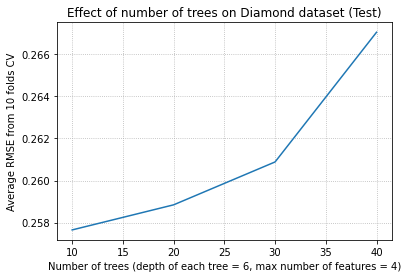

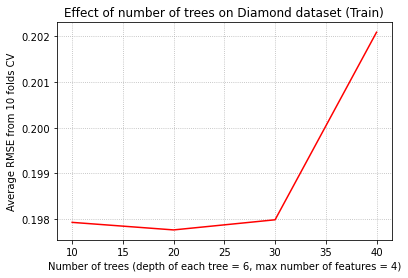

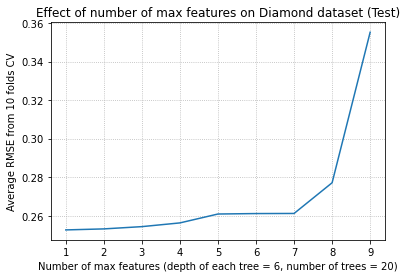

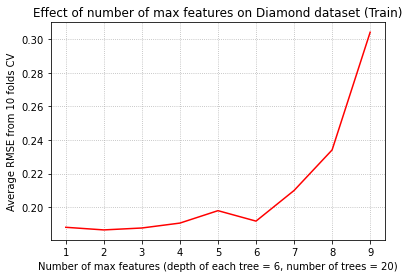

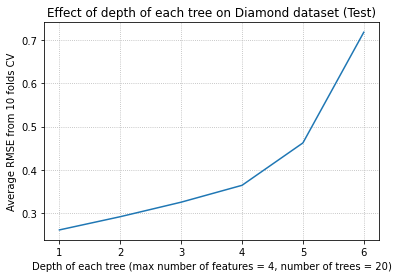

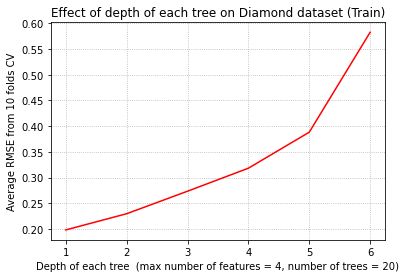

In [ ]:
max_features = np.arange(1, 7, 1).reshape(6)
n_estimators = np.arange(10, 50, 10).reshape(4)
max_depth = np.arange(1, 7, 1).reshape(6)

score = np.negative(list((result[(result['param_model__max_depth'] == 6) & (result['param_model__max_features'] == 4)]).mean_test_score))
train = np.negative(list((result[(result['param_model__max_depth'] == 6) & (result['param_model__max_features'] == 4)]).mean_train_score))
plt.plot(n_estimators, score)
plt.grid(linestyle=':')
plt.xlabel('Number of trees (depth of each tree = 6, max number of features = 4)')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of number of trees on Diamond dataset (Test)')
plt.show()

plt.plot(n_estimators, train, 'r')
plt.grid(linestyle=':')
plt.xlabel('Number of trees (depth of each tree = 6, max number of features = 4)')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of number of trees on Diamond dataset (Train)')
plt.show()

score = np.negative(list((result[(result['param_model__max_depth'] == 6) & (result['param_model__n_estimators'] == 20)]).mean_test_score))
train = np.negative(list((result[(result['param_model__max_depth'] == 6) & (result['param_model__n_estimators'] == 20)]).mean_train_score))
plt.plot(max_features, score)
plt.grid(linestyle=':')
plt.xlabel('Number of max features (depth of each tree = 6, number of trees = 20)')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of number of max features on Diamond dataset (Test)')
plt.show()

plt.plot(max_features, train, 'r')
plt.grid(linestyle=':')
plt.xlabel('Number of max features (depth of each tree = 6, number of trees = 20)')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of number of max features on Diamond dataset (Train)')
plt.show()

score = np.negative(list((result[(result['param_model__max_features'] == 4) & (result['param_model__n_estimators'] == 20)]).mean_test_score))
train = np.negative(list((result[(result['param_model__max_features'] == 4) & (result['param_model__n_estimators'] == 20)]).mean_train_score))
plt.plot(max_depth, score)
plt.grid(linestyle=':')
plt.xlabel('Depth of each tree (max number of features = 4, number of trees = 20)')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of depth of each tree on Diamond dataset (Test)')
plt.show()

plt.plot(max_depth, train, 'r')
plt.grid(linestyle=':')
plt.xlabel('Depth of each tree  (max number of features = 4, number of trees = 20)')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of depth of each tree on Diamond dataset (Train)')
plt.show()

In [ ]:
print('OOB, Diamond:', RandomForestRegressor(random_state=42,max_depth=6,
                                         max_features=7, n_estimators=40, oob_score=True).fit(X_diamond_S, Y_diamond_S).oob_score_)

OOB, Diamond: 0.9569190066991791


10
20
30
40


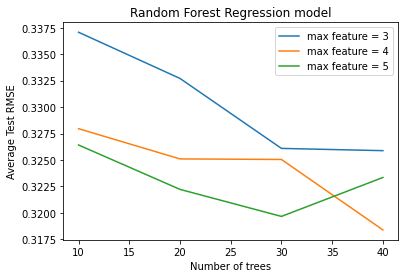

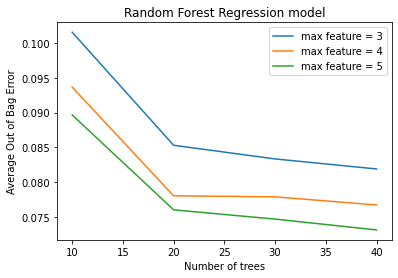

1
2
3
4
5
6


No handles with labels found to put in legend.


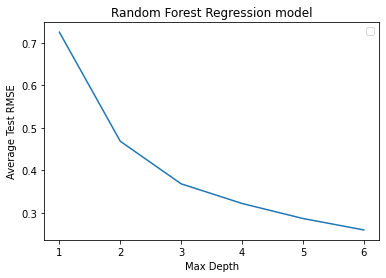

No handles with labels found to put in legend.


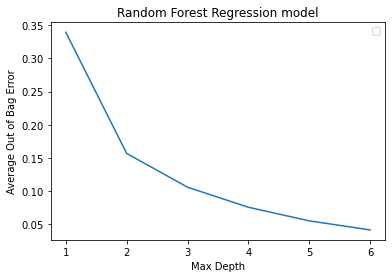

1
2
3
4
5
6
7
8


No handles with labels found to put in legend.


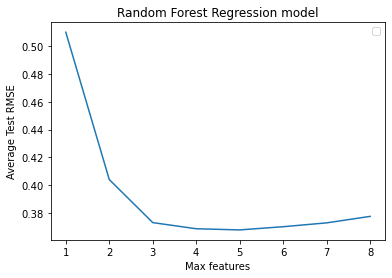

No handles with labels found to put in legend.


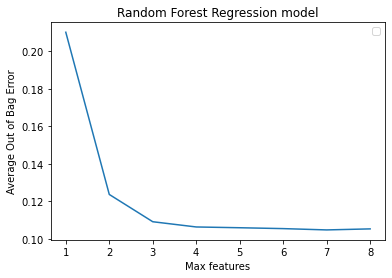

[0.14813042 0.14371472 0.21163596 0.35768599 0.60897501 0.29235076
 0.0371149  0.06056346 0.06988372 0.09911049]
Feature importances from best random forest model: 
 [0.18635985 0.00324472 0.0257298  0.06259692 0.14389384 0.47333603
 0.10102965 0.0026086  0.00120058]


In [ ]:
import warnings
warnings.filterwarnings("ignore")

X = X_diamond_S
y = Y_diamond_S
trees = np.arange(10, 50, 10)
oob3 = []; oob4 = []; oob5 = [];
test_rmse3 = []; test_rmse4 = []; test_rmse5 = [];
for i in trees:
    print(i)
    rf = RandomForestRegressor(n_estimators=i,max_depth=4,bootstrap=True,max_features=3,oob_score=True,warm_start=True)
    cv_results = cross_validate(rf,X,y,scoring='neg_mean_squared_error',cv=10,return_train_score=True,return_estimator=True)
    test_rmse3.append( np.mean(np.sqrt(cv_results['test_score']*(-1.))) )
    oob3.append( 1-np.mean([i.oob_score_ for i in cv_results['estimator']]) )
    
    rf = RandomForestRegressor(n_estimators=i,max_depth=4,bootstrap=True,max_features=4,oob_score=True,warm_start=True)
    cv_results = cross_validate(rf,X,y,scoring='neg_mean_squared_error',cv=10,return_train_score=True,return_estimator=True)
    test_rmse4.append( np.mean(np.sqrt(cv_results['test_score']*(-1.))) )
    oob4.append( 1-np.mean([i.oob_score_ for i in cv_results['estimator']]) )
    
    rf = RandomForestRegressor(n_estimators=i,max_depth=4,bootstrap=True,max_features=5,oob_score=True,warm_start=True)
    cv_results = cross_validate(rf,X,y,scoring='neg_mean_squared_error',cv=10,return_train_score=True,return_estimator=True)
    test_rmse5.append( np.mean(np.sqrt(cv_results['test_score']*(-1.))) )
    oob5.append( 1-np.mean([i.oob_score_ for i in cv_results['estimator']]) )

fig, ax = plt.subplots()
ax.plot(trees,test_rmse3, label='max feature = 3')
ax.plot(trees,test_rmse4, label='max feature = 4')
ax.plot(trees,test_rmse5, label='max feature = 5')
ax.legend(loc='best')
plt.xlabel("Number of trees")
plt.ylabel("Average Test RMSE")
plt.title("Random Forest Regression model")
plt.show()

fig, ax = plt.subplots()
ax.plot(trees,oob3, label='max feature = 3')
ax.plot(trees,oob4, label='max feature = 4')
ax.plot(trees,oob5, label='max feature = 5')
ax.legend(loc='best')
plt.xlabel("Number of trees")
plt.ylabel("Average Out of Bag Error")
plt.title("Random Forest Regression model")
plt.show()

depth = np.arange(1, 7, 1)
test_rmse = []
oob = []
for i in depth:
    print(i)
    rf = RandomForestRegressor(n_estimators=166,max_features=4,max_depth=i,bootstrap=True,oob_score=True,warm_start=True)
    cv_results = cross_validate(rf,X,y,scoring='neg_mean_squared_error',cv=10,return_train_score=True,return_estimator=True)
    test_rmse.append( np.mean(np.sqrt(cv_results['test_score']*(-1.))) )
    oob.append( 1-np.mean([i.oob_score_ for i in cv_results['estimator']]) )

fig, ax = plt.subplots()
ax.plot(depth,test_rmse)
ax.legend(loc='best')
plt.xlabel("Max Depth"); plt.ylabel("Average Test RMSE"); plt.title("Random Forest Regression model")
plt.show()

fig, ax = plt.subplots()
ax.plot(depth,oob)
ax.legend(loc='best')
plt.xlabel("Max Depth"); plt.ylabel("Average Out of Bag Error"); plt.title("Random Forest Regression model")
plt.show()

features = np.arange(1, 7, 1)
test_rmse = []
oob = []
for i in features:
    print(i)
    rf = RandomForestRegressor(n_estimators=166,max_features=i,max_depth=3,bootstrap=True,oob_score=True,warm_start=True)
    cv_results = cross_validate(rf,X,y,scoring='neg_mean_squared_error',cv=10,return_train_score=True,return_estimator=True)
    test_rmse.append( np.mean(np.sqrt(cv_results['test_score']*(-1.))) )
    oob.append( 1-np.mean([i.oob_score_ for i in cv_results['estimator']]) )

fig, ax = plt.subplots()
ax.plot(features,test_rmse)
ax.legend(loc='best')
plt.xlabel("Max features"); plt.ylabel("Average Test RMSE"); plt.title("Random Forest Regression model")
plt.show()

fig, ax = plt.subplots()
ax.plot(features,oob)
ax.legend(loc='best')
plt.xlabel("Max features"); plt.ylabel("Average Out of Bag Error"); plt.title("Random Forest Regression model")
plt.show()

rf = RandomForestRegressor(n_estimators=20,max_features=4,max_depth=10,bootstrap=True,oob_score=True,warm_start=True)
cv_results = cross_validate(rf,X,y,scoring='neg_mean_squared_error',cv=10,return_train_score=True,return_estimator=True)
print( np.sqrt(cv_results['test_score']*(-1.)) )
print("Feature importances from best random forest model: \n", cv_results['estimator'][4].feature_importances_)


In [22]:
X = X_diamond_S
y = Y_diamond_S
rf = RandomForestRegressor(n_estimators=40,max_features=6,max_depth=6,bootstrap=True,oob_score=True,warm_start=True)
cv_results = cross_validate(rf,X,y,scoring='neg_mean_squared_error',cv=10,return_train_score=True,return_estimator=True)
print( np.sqrt(cv_results['test_score']*(-1.)) )
print("Feature importances from best random forest model: \n", cv_results['estimator'][4].feature_importances_)

[0.19859391 0.18491703 0.2594582  0.43991586 0.73491308 0.3538945
 0.04659607 0.08769421 0.08663948 0.12517973]
Feature importances from best random forest model: 
 [1.74083968e-01 6.82477925e-04 2.03606483e-02 5.91157498e-02
 9.07991263e-02 6.01968577e-01 5.20012503e-02 8.18211866e-04
 1.69990799e-04]


In [24]:
pipeline = Pipeline([
    ('standardize', StandardScaler()),
    ('kbest', SelectKBest(k = 9, score_func = mutual_info_regression)),
    ('model', RandomForestRegressor(random_state = 42, oob_score = True))
])
                         
param_grid = {
    'model__max_features': np.arange(1, 10, 1),
    'model__n_estimators': np.arange(10, 50, 10),
    'model__max_depth': np.arange(1, 7, 1)
}

grid = GridSearchCV(pipeline, param_grid = param_grid, cv = 10, n_jobs = -1, verbose = 3, 
                     scoring = 'neg_root_mean_squared_error', return_train_score = True).fit(X_gt_S, Y_gt_S)

Fitting 10 folds for each of 216 candidates, totalling 2160 fits


/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

[CV 8/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.806, test=-0.836) total time=   4.0s
[CV 3/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.785, test=-1.048) total time=   4.0s
[CV 1/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.841, test=-0.593) total time=   3.8s
[CV 7/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.842, test=-0.693) total time=   4.2s
[CV 5/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.827, test=-1.008) total time=   4.3s
[CV 2/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.765, test=-0.932) total time=   4.2s
[CV 1/10] END model__max_depth=1, model__max_features=2, model__n_estimators=20;, score=(train=-0.797, test=-0.573) total time=   4.2s
[CV 8/10] END model__max_depth=1, model__max_features=2

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

[CV 7/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.829, test=-0.676) total time=   3.9s
[CV 10/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.820, test=-0.778) total time=   3.9s
[CV 7/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.828, test=-0.677) total time=   3.9s
[CV 6/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.837, test=-0.704) total time=   4.2s
[CV 4/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.833, test=-0.828) total time=   4.3s
[CV 3/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.768, test=-1.032) total time=   4.1s
[CV 10/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.800, test=-0.764) total time=   4.2s
[CV 7/10] END model__max_depth=1, model__max_features

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


[CV 1/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.859, test=-0.598) total time=   3.8s
[CV 9/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.807, test=-0.929) total time=   4.0s
[CV 8/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.806, test=-0.832) total time=   3.8s
[CV 5/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.821, test=-0.995) total time=   4.1s
[CV 3/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.802, test=-1.079) total time=   4.3s
[CV 1/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.799, test=-0.580) total time=   4.0s
[CV 9/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.787, test=-0.918) total time=   4.3s
[CV 6/10] END model__max_depth=1, model__max_features=2

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


[CV 4/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.818, test=-0.790) total time=   4.0s
[CV 4/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.816, test=-0.793) total time=   4.0s
[CV 9/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.805, test=-0.927) total time=   4.1s
[CV 9/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.819, test=-0.937) total time=   4.4s
[CV 8/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.823, test=-0.857) total time=   4.3s
[CV 5/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.791, test=-0.938) total time=   4.2s
[CV 3/10] END model__max_depth=1, model__max_features=2, model__n_estimators=20;, score=(train=-0.753, test=-1.024) total time=   4.4s
[CV 1/10] END model__max_depth=1, model__max_features=2

[CV 5/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.809, test=-0.973) total time=   4.0s
[CV 2/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.814, test=-0.948) total time=   4.1s
[CV 2/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.803, test=-0.941) total time=   4.0s
[CV 10/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.832, test=-0.788) total time=   4.3s
[CV 7/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.848, test=-0.699) total time=   4.5s
[CV 6/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.806, test=-0.665) total time=   4.4s
[CV 5/10] END model__max_depth=1, model__max_features=2, model__n_estimators=20;, score=(train=-0.783, test=-0.906) total time=   4.4s
[CV 3/10] END model__max_depth=1, model__max_features=

[CV 6/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.825, test=-0.688) total time=   4.0s
[CV 1/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.853, test=-0.597) total time=   4.0s
[CV 10/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.818, test=-0.774) total time=   3.9s
[CV 8/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.818, test=-0.848) total time=   4.3s
[CV 6/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.843, test=-0.718) total time=   4.2s
[CV 4/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.799, test=-0.764) total time=   4.3s
[CV 2/10] END model__max_depth=1, model__max_features=2, model__n_estimators=20;, score=(train=-0.771, test=-0.904) total time=   4.3s
[CV 10/10] END model__max_depth=1, model__max_features

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

[CV 2/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.803, test=-0.910) total time=   4.1s
[CV 5/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.808, test=-0.970) total time=   4.1s
[CV 3/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.797, test=-1.066) total time=   3.9s
[CV 1/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.862, test=-0.611) total time=   4.3s
[CV 9/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.827, test=-0.925) total time=   4.4s
[CV 7/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.811, test=-0.658) total time=   4.2s
[CV 4/10] END model__max_depth=1, model__max_features=2, model__n_estimators=20;, score=(train=-0.784, test=-0.766) total time=   4.5s
[CV 2/10] END model__max_depth=1, model__max_features=2

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

[CV 3/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.787, test=-1.052) total time=   4.7s
[CV 6/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.823, test=-0.691) total time=   4.5s
[CV 4/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.829, test=-0.810) total time=   4.7s
[CV 2/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.821, test=-0.925) total time=   4.9s
[CV 10/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.839, test=-0.786) total time=   4.9s
[CV 8/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.786, test=-0.829) total time=   5.0s
[CV 9/10] END model__max_depth=1, model__max_features=2, model__n_estimators=20;, score=(train=-0.775, test=-0.890) total time=   5.3s
[CV 8/10] END model__max_depth=1, model__max_features=

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
/Users/madhavsankar/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:833: UserWarning: Some inputs do not have OOB scores. This probably means too few trees wer

In [25]:
result = pd.DataFrame(grid.cv_results_)[['mean_test_score', 'mean_train_score', 'param_model__max_features', 'param_model__n_estimators', 'param_model__max_depth']]
result = result.sort_values(by=['mean_test_score'], ascending = False).reset_index(drop = True)
result.to_csv('gtRF.csv', sep='\t', encoding='utf-8')
print(result.head())
print('Best parameters:',grid.best_params_,',Test RMSE:',grid.best_score_)
print('Train RMSE:',max(result.mean_train_score))


   mean_test_score  mean_train_score param_model__max_features  \
0        -0.580643         -0.458101                         4   
1        -0.582024         -0.459547                         4   
2        -0.583045         -0.455967                         5   
3        -0.583428         -0.458749                         4   
4        -0.584657         -0.489195                         5   

  param_model__n_estimators param_model__max_depth  
0                        40                      6  
1                        20                      6  
2                        40                      6  
3                        30                      6  
4                        20                      5  
Best parameters: {'model__max_depth': 6, 'model__max_features': 4, 'model__n_estimators': 40} ,Test RMSE: -0.5806434107682812
Train RMSE: -0.45439940041337373


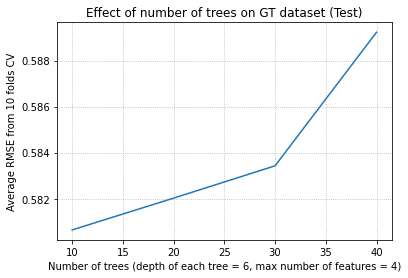

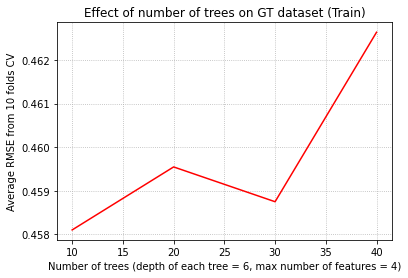

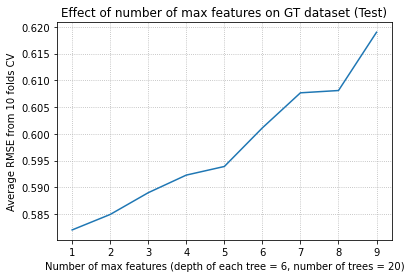

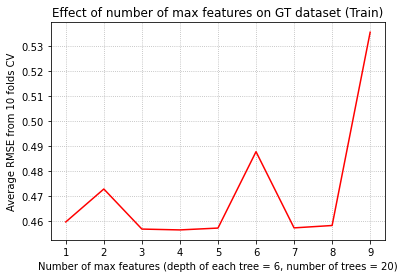

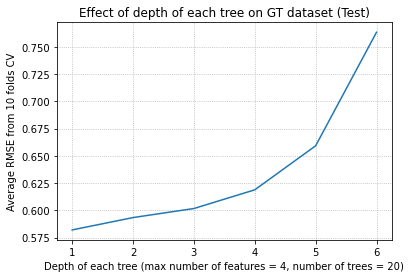

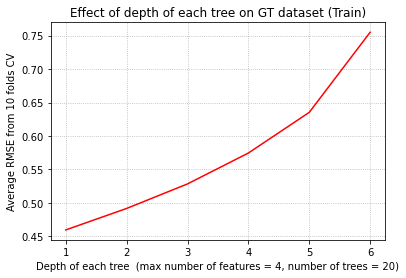

[CV 4/10] END model__max_depth=3, model__max_features=6, model__n_estimators=40;, score=(train=-0.565, test=-0.628) total time=   7.2s
[CV 2/10] END model__max_depth=3, model__max_features=7, model__n_estimators=10;, score=(train=-0.562, test=-0.735) total time=   5.9s
[CV 10/10] END model__max_depth=3, model__max_features=7, model__n_estimators=10;, score=(train=-0.577, test=-0.535) total time=   5.8s
[CV 7/10] END model__max_depth=3, model__max_features=7, model__n_estimators=20;, score=(train=-0.581, test=-0.512) total time=   6.3s
[CV 5/10] END model__max_depth=3, model__max_features=7, model__n_estimators=30;, score=(train=-0.575, test=-0.536) total time=   6.8s
[CV 3/10] END model__max_depth=3, model__max_features=7, model__n_estimators=40;, score=(train=-0.544, test=-0.817) total time=   7.4s
[CV 1/10] END model__max_depth=3, model__max_features=8, model__n_estimators=10;, score=(train=-0.593, test=-0.452) total time=   5.9s
[CV 8/10] END model__max_depth=3, model__max_features=

[CV 2/10] END model__max_depth=3, model__max_features=6, model__n_estimators=30;, score=(train=-0.556, test=-0.725) total time=   6.9s
[CV 9/10] END model__max_depth=3, model__max_features=6, model__n_estimators=30;, score=(train=-0.557, test=-0.697) total time=   6.9s
[CV 7/10] END model__max_depth=3, model__max_features=6, model__n_estimators=40;, score=(train=-0.575, test=-0.515) total time=   6.9s
[CV 5/10] END model__max_depth=3, model__max_features=7, model__n_estimators=10;, score=(train=-0.580, test=-0.526) total time=   5.7s
[CV 3/10] END model__max_depth=3, model__max_features=7, model__n_estimators=20;, score=(train=-0.544, test=-0.825) total time=   6.3s
[CV 1/10] END model__max_depth=3, model__max_features=7, model__n_estimators=30;, score=(train=-0.586, test=-0.455) total time=   6.9s
[CV 9/10] END model__max_depth=3, model__max_features=7, model__n_estimators=30;, score=(train=-0.560, test=-0.696) total time=   6.9s
[CV 7/10] END model__max_depth=3, model__max_features=7

[CV 6/10] END model__max_depth=3, model__max_features=9, model__n_estimators=40;, score=(train=-0.577, test=-0.627) total time=   8.5s
[CV 4/10] END model__max_depth=4, model__max_features=1, model__n_estimators=10;, score=(train=-0.612, test=-0.668) total time=   6.5s
[CV 2/10] END model__max_depth=4, model__max_features=1, model__n_estimators=20;, score=(train=-0.602, test=-0.715) total time=   6.8s
[CV 2/10] END model__max_depth=4, model__max_features=1, model__n_estimators=30;, score=(train=-0.619, test=-0.731) total time=   6.8s
[CV 2/10] END model__max_depth=4, model__max_features=1, model__n_estimators=40;, score=(train=-0.612, test=-0.780) total time=   6.9s
[CV 2/10] END model__max_depth=4, model__max_features=2, model__n_estimators=10;, score=(train=-0.551, test=-0.653) total time=   6.6s
[CV 10/10] END model__max_depth=4, model__max_features=2, model__n_estimators=10;, score=(train=-0.572, test=-0.527) total time=   6.6s
[CV 9/10] END model__max_depth=4, model__max_features=

[CV 7/10] END model__max_depth=3, model__max_features=6, model__n_estimators=30;, score=(train=-0.576, test=-0.507) total time=   6.7s
[CV 5/10] END model__max_depth=3, model__max_features=6, model__n_estimators=40;, score=(train=-0.573, test=-0.558) total time=   7.0s
[CV 3/10] END model__max_depth=3, model__max_features=7, model__n_estimators=10;, score=(train=-0.546, test=-0.837) total time=   5.9s
[CV 1/10] END model__max_depth=3, model__max_features=7, model__n_estimators=20;, score=(train=-0.590, test=-0.457) total time=   6.4s
[CV 9/10] END model__max_depth=3, model__max_features=7, model__n_estimators=20;, score=(train=-0.560, test=-0.695) total time=   6.6s
[CV 8/10] END model__max_depth=3, model__max_features=7, model__n_estimators=30;, score=(train=-0.577, test=-0.581) total time=   6.8s
[CV 5/10] END model__max_depth=3, model__max_features=7, model__n_estimators=40;, score=(train=-0.575, test=-0.544) total time=   7.2s
[CV 3/10] END model__max_depth=3, model__max_features=8

[CV 4/10] END model__max_depth=3, model__max_features=6, model__n_estimators=30;, score=(train=-0.566, test=-0.629) total time=   6.9s
[CV 2/10] END model__max_depth=3, model__max_features=6, model__n_estimators=40;, score=(train=-0.558, test=-0.724) total time=   7.1s
[CV 10/10] END model__max_depth=3, model__max_features=6, model__n_estimators=40;, score=(train=-0.573, test=-0.527) total time=   6.9s
[CV 7/10] END model__max_depth=3, model__max_features=7, model__n_estimators=10;, score=(train=-0.583, test=-0.514) total time=   5.7s
[CV 5/10] END model__max_depth=3, model__max_features=7, model__n_estimators=20;, score=(train=-0.577, test=-0.537) total time=   6.4s
[CV 3/10] END model__max_depth=3, model__max_features=7, model__n_estimators=30;, score=(train=-0.544, test=-0.822) total time=   6.7s
[CV 1/10] END model__max_depth=3, model__max_features=7, model__n_estimators=40;, score=(train=-0.587, test=-0.455) total time=   7.4s
[CV 9/10] END model__max_depth=3, model__max_features=

[CV 10/10] END model__max_depth=3, model__max_features=6, model__n_estimators=20;, score=(train=-0.573, test=-0.531) total time=   6.2s
[CV 8/10] END model__max_depth=3, model__max_features=6, model__n_estimators=30;, score=(train=-0.572, test=-0.573) total time=   6.7s
[CV 6/10] END model__max_depth=3, model__max_features=6, model__n_estimators=40;, score=(train=-0.565, test=-0.602) total time=   7.0s
[CV 4/10] END model__max_depth=3, model__max_features=7, model__n_estimators=10;, score=(train=-0.576, test=-0.633) total time=   5.8s
[CV 2/10] END model__max_depth=3, model__max_features=7, model__n_estimators=20;, score=(train=-0.558, test=-0.724) total time=   6.3s
[CV 10/10] END model__max_depth=3, model__max_features=7, model__n_estimators=20;, score=(train=-0.576, test=-0.528) total time=   6.1s
[CV 6/10] END model__max_depth=3, model__max_features=7, model__n_estimators=30;, score=(train=-0.569, test=-0.613) total time=   6.7s
[CV 4/10] END model__max_depth=3, model__max_features

In [26]:
max_features = np.arange(1, 10, 1).reshape(9)
n_estimators = np.arange(10, 50, 10).reshape(4)
max_depth = np.arange(1, 7, 1).reshape(6)

score = np.negative(list((result[(result['param_model__max_depth'] == 6) & (result['param_model__max_features'] == 4)]).mean_test_score))
train = np.negative(list((result[(result['param_model__max_depth'] == 6) & (result['param_model__max_features'] == 4)]).mean_train_score))
plt.plot(n_estimators, score)
plt.grid(linestyle=':')
plt.xlabel('Number of trees (depth of each tree = 6, max number of features = 4)')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of number of trees on GT dataset (Test)')
plt.show()

plt.plot(n_estimators, train, 'r')
plt.grid(linestyle=':')
plt.xlabel('Number of trees (depth of each tree = 6, max number of features = 4)')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of number of trees on GT dataset (Train)')
plt.show()

score = np.negative(list((result[(result['param_model__max_depth'] == 6) & (result['param_model__n_estimators'] == 20)]).mean_test_score))
train = np.negative(list((result[(result['param_model__max_depth'] == 6) & (result['param_model__n_estimators'] == 20)]).mean_train_score))
plt.plot(max_features, score)
plt.grid(linestyle=':')
plt.xlabel('Number of max features (depth of each tree = 6, number of trees = 20)')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of number of max features on GT dataset (Test)')
plt.show()

plt.plot(max_features, train, 'r')
plt.grid(linestyle=':')
plt.xlabel('Number of max features (depth of each tree = 6, number of trees = 20)')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of number of max features on GT dataset (Train)')
plt.show()

score = np.negative(list((result[(result['param_model__max_features'] == 4) & (result['param_model__n_estimators'] == 20)]).mean_test_score))
train = np.negative(list((result[(result['param_model__max_features'] == 4) & (result['param_model__n_estimators'] == 20)]).mean_train_score))
plt.plot(max_depth, score)
plt.grid(linestyle=':')
plt.xlabel('Depth of each tree (max number of features = 4, number of trees = 20)')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of depth of each tree on GT dataset (Test)')
plt.show()

plt.plot(max_depth, train, 'r')
plt.grid(linestyle=':')
plt.xlabel('Depth of each tree  (max number of features = 4, number of trees = 20)')
plt.ylabel('Average RMSE from 10 folds CV')
plt.title('Effect of depth of each tree on GT dataset (Train)')
plt.show()

In [ ]:
print('OOB, GT:',RandomForestRegressor(random_state=42,max_depth=6,
                                         max_features=5, n_estimators=40, oob_score=True).fit(X_gt_S, Y_gt_S).oob_score_)

OOB, GT: 0.7220917422471709


10
20
30
40


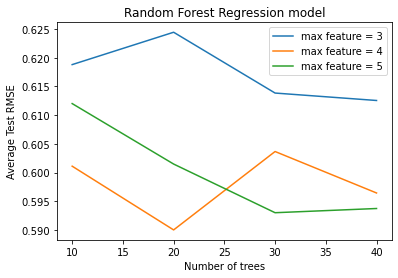

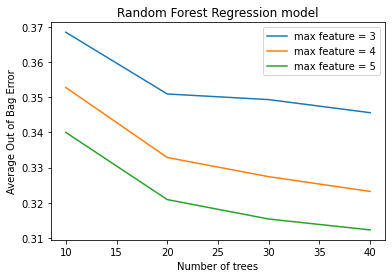

1
2
3
4
5
6


No handles with labels found to put in legend.


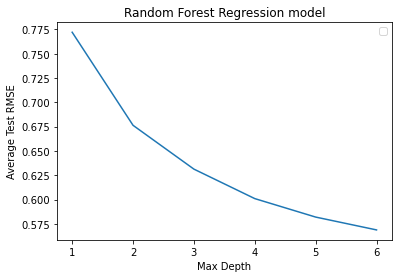

No handles with labels found to put in legend.


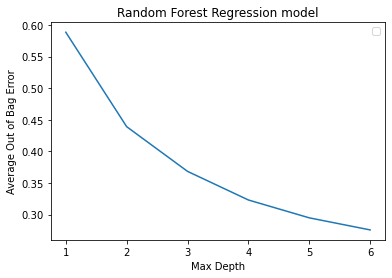

1
2
3
4
5
6
7
8


No handles with labels found to put in legend.


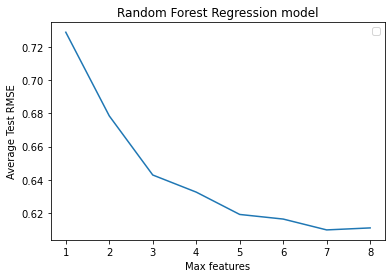

No handles with labels found to put in legend.


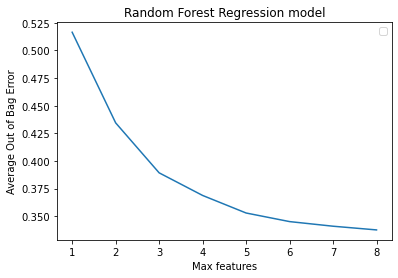

[0.39973994 0.6124293  0.86140096 0.56492282 0.52488765 0.59240189
 0.51883908 0.48403922 0.62405633 0.55960506]
Feature importances from best random forest model: 
 [0.04237627 0.02269294 0.01931741 0.04553206 0.09861132 0.30578193
 0.16316821 0.14434218 0.10379666 0.01871759 0.00639009 0.00307259
 0.00667982 0.01952091]


In [ ]:
import warnings
warnings.filterwarnings("ignore")

X = X_gt_S
y = Y_gt_S
trees = np.arange(10, 50, 10)
oob3 = []; oob4 = []; oob5 = [];
test_rmse3 = []; test_rmse4 = []; test_rmse5 = [];
for i in trees:
    print(i)
    rf = RandomForestRegressor(n_estimators=i,max_depth=4,bootstrap=True,max_features=3,oob_score=True,warm_start=True)
    cv_results = cross_validate(rf,X,y,scoring='neg_mean_squared_error',cv=10,return_train_score=True,return_estimator=True)
    test_rmse3.append( np.mean(np.sqrt(cv_results['test_score']*(-1.))) )
    oob3.append( 1-np.mean([i.oob_score_ for i in cv_results['estimator']]) )
    
    rf = RandomForestRegressor(n_estimators=i,max_depth=4,bootstrap=True,max_features=4,oob_score=True,warm_start=True)
    cv_results = cross_validate(rf,X,y,scoring='neg_mean_squared_error',cv=10,return_train_score=True,return_estimator=True)
    test_rmse4.append( np.mean(np.sqrt(cv_results['test_score']*(-1.))) )
    oob4.append( 1-np.mean([i.oob_score_ for i in cv_results['estimator']]) )
    
    rf = RandomForestRegressor(n_estimators=i,max_depth=4,bootstrap=True,max_features=5,oob_score=True,warm_start=True)
    cv_results = cross_validate(rf,X,y,scoring='neg_mean_squared_error',cv=10,return_train_score=True,return_estimator=True)
    test_rmse5.append( np.mean(np.sqrt(cv_results['test_score']*(-1.))) )
    oob5.append( 1-np.mean([i.oob_score_ for i in cv_results['estimator']]) )

fig, ax = plt.subplots()
ax.plot(trees,test_rmse3, label='max feature = 3')
ax.plot(trees,test_rmse4, label='max feature = 4')
ax.plot(trees,test_rmse5, label='max feature = 5')
ax.legend(loc='best')
plt.xlabel("Number of trees")
plt.ylabel("Average Test RMSE")
plt.title("Random Forest Regression model")
plt.show()

fig, ax = plt.subplots()
ax.plot(trees,oob3, label='max feature = 3')
ax.plot(trees,oob4, label='max feature = 4')
ax.plot(trees,oob5, label='max feature = 5')
ax.legend(loc='best')
plt.xlabel("Number of trees")
plt.ylabel("Average Out of Bag Error")
plt.title("Random Forest Regression model")
plt.show()

depth = np.arange(1, 7, 1)
test_rmse = []
oob = []
for i in depth:
    print(i)
    rf = RandomForestRegressor(n_estimators=50,max_features=4,max_depth=i,bootstrap=True,oob_score=True,warm_start=True)
    cv_results = cross_validate(rf,X,y,scoring='neg_mean_squared_error',cv=10,return_train_score=True,return_estimator=True)
    test_rmse.append( np.mean(np.sqrt(cv_results['test_score']*(-1.))) )
    oob.append( 1-np.mean([i.oob_score_ for i in cv_results['estimator']]) )

fig, ax = plt.subplots()
ax.plot(depth,test_rmse)
ax.legend(loc='best')
plt.xlabel("Max Depth"); plt.ylabel("Average Test RMSE"); plt.title("Random Forest Regression model")
plt.show()

fig, ax = plt.subplots()
ax.plot(depth,oob)
ax.legend(loc='best')
plt.xlabel("Max Depth"); plt.ylabel("Average Out of Bag Error"); plt.title("Random Forest Regression model")
plt.show()

features = np.arange(1, 9, 1)
test_rmse = []
oob = []
for i in features:
    print(i)
    rf = RandomForestRegressor(n_estimators=50,max_features=i,max_depth=3,bootstrap=True,oob_score=True,warm_start=True)
    cv_results = cross_validate(rf,X,y,scoring='neg_mean_squared_error',cv=10,return_train_score=True,return_estimator=True)
    test_rmse.append( np.mean(np.sqrt(cv_results['test_score']*(-1.))) )
    oob.append( 1-np.mean([i.oob_score_ for i in cv_results['estimator']]) )

fig, ax = plt.subplots()
ax.plot(features,test_rmse)
ax.legend(loc='best')
plt.xlabel("Max features"); plt.ylabel("Average Test RMSE"); plt.title("Random Forest Regression model")
plt.show()

fig, ax = plt.subplots()
ax.plot(features,oob)
ax.legend(loc='best')
plt.xlabel("Max features"); plt.ylabel("Average Out of Bag Error"); plt.title("Random Forest Regression model")
plt.show()

rf = RandomForestRegressor(n_estimators=20,max_features=4,max_depth=10,bootstrap=True,oob_score=True,warm_start=True)
cv_results = cross_validate(rf,X,y,scoring='neg_mean_squared_error',cv=10,return_train_score=True,return_estimator=True)
print( np.sqrt(cv_results['test_score']*(-1.)) )
print("Feature importances from best random forest model: \n", cv_results['estimator'][4].feature_importances_)


In [ ]:
vis_tree = RandomForestRegressor(random_state=42,max_depth=4,
                                max_features=5, n_estimators=40, 
                                oob_score=True).fit(X_diamond_S, Y_diamond_S)

In [ ]:
selK = SelectKBest(score_func = f_regression, k = 9)
X_diamond_df_topk = selK.fit_transform(X_diamond_df, Y_diamond)
column_names = X_diamond_df.columns[selK.get_support()]

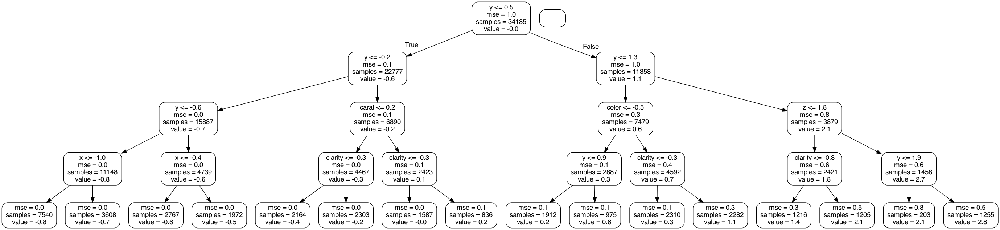

[CV 6/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.859, test=-0.714) total time=   0.2s
[CV 4/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.872, test=-0.833) total time=   0.2s
[CV 2/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.866, test=-0.961) total time=   0.3s
[CV 2/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.868, test=-0.963) total time=   0.3s
[CV 10/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.884, test=-0.841) total time=   0.3s
[CV 3/10] END model__max_depth=1, model__max_features=2, model__n_estimators=20;, score=(train=-0.796, test=-1.046) total time=   0.2s
[CV 2/10] END model__max_depth=1, model__max_features=2, model__n_estimators=30;, score=(train=-0.821, test=-0.924) total time=   0.3s
[CV 10/10] END model__max_depth=1, model__max_features

[CV 5/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.839, test=-1.027) total time=   0.1s
[CV 2/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.855, test=-0.949) total time=   0.2s
[CV 10/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.872, test=-0.832) total time=   0.2s
[CV 8/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.875, test=-0.878) total time=   0.2s
[CV 5/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.865, test=-1.082) total time=   0.3s
[CV 3/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.771, test=-1.015) total time=   0.1s
[CV 9/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.784, test=-0.927) total time=   0.1s
[CV 7/10] END model__max_depth=1, model__max_features=

[CV 2/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.834, test=-0.952) total time=   0.1s
[CV 9/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.840, test=-0.962) total time=   0.1s
[CV 7/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.884, test=-0.718) total time=   0.2s
[CV 6/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.890, test=-0.743) total time=   0.2s
[CV 4/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.883, test=-0.851) total time=   0.3s
[CV 4/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.803, test=-0.741) total time=   0.1s
[CV 8/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.792, test=-0.814) total time=   0.1s
[CV 6/10] END model__max_depth=1, model__max_features=2

[CV 4/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.852, test=-0.816) total time=   0.1s
[CV 10/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.853, test=-0.805) total time=   0.1s
[CV 8/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.864, test=-0.867) total time=   0.2s
[CV 5/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.866, test=-1.079) total time=   0.2s
[CV 3/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.853, test=-1.103) total time=   0.3s
[CV 1/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.816, test=-0.596) total time=   0.1s
[CV 10/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.800, test=-0.779) total time=   0.1s
[CV 8/10] END model__max_depth=1, model__max_features

[CV 7/10] END model__max_depth=1, model__max_features=1, model__n_estimators=10;, score=(train=-0.865, test=-0.696) total time=   0.1s
[CV 1/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.891, test=-0.626) total time=   0.1s
[CV 9/10] END model__max_depth=1, model__max_features=1, model__n_estimators=20;, score=(train=-0.856, test=-0.999) total time=   0.2s
[CV 7/10] END model__max_depth=1, model__max_features=1, model__n_estimators=30;, score=(train=-0.895, test=-0.728) total time=   0.2s
[CV 7/10] END model__max_depth=1, model__max_features=1, model__n_estimators=40;, score=(train=-0.896, test=-0.726) total time=   0.3s
[CV 5/10] END model__max_depth=1, model__max_features=2, model__n_estimators=10;, score=(train=-0.792, test=-0.912) total time=   0.1s
[CV 2/10] END model__max_depth=1, model__max_features=2, model__n_estimators=20;, score=(train=-0.809, test=-0.916) total time=   0.2s
[CV 10/10] END model__max_depth=1, model__max_features=

In [ ]:
tree = vis_tree.estimators_[1]
export_graphviz(tree, out_file = 'tree.dot', feature_names = column_names, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('tree.dot')
from sklearn.tree import export_graphviz
import pydot
from IPython.display import Image
Image(graph.create_png())

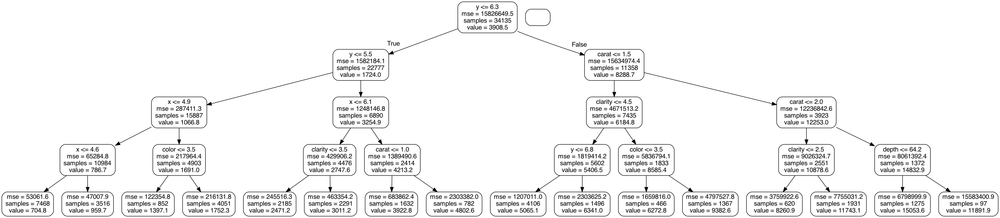

In [ ]:
tree = vis_tree.estimators_[1]
export_graphviz(tree, out_file = 'tree.dot', feature_names = column_names, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('tree.dot')
from sklearn.tree import export_graphviz
import pydot
from IPython.display import Image
Image(graph.create_png())